In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Data Analysis & Data wrangling
import numpy as np
import pandas as pd
from collections import Counter
import shap

#Visualization
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline

# Plot Style
sns.set_context("paper")
style.use('fivethirtyeight')

# Machine Learning Libraries

#Sci-kit learn libraries
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import precision_score, recall_score, accuracy_score, classification_report, roc_auc_score
from sklearn.metrics import precision_recall_curve, confusion_matrix, f1_score

#Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

#Function
import sys
sys.path.append(r'D:\Project\Lead_scoring_model\lead_model\Function')

from calculate_woe_iv import calculate_woe_iv
from evaluation import draw_roc, draw_cm, evaluate_model
from fts_impotance_shap import summarize_shap_values

#Turning Hyperparameters
import optuna


pd.options.display.float_format = '{:.3f}'.format

In [3]:
lead = pd.read_excel('./model_data.xlsx')
lead

,RECEIVE_EMAIL,CONVERTED,TOTAL_VISITS,TIME_ON_SITE,PAGE_VIEWS_VISIT,ID_ORIGIN_Landing Page Submission,ID_ORIGIN_Lead Add Form,ID_ORIGIN_Lead Import,ID_ORIGIN_Quick Add Form,ID_SOURCE_Facebook,...,CUST_BACKGROUND_International Business,CUST_BACKGROUND_Marketing Management,CUST_BACKGROUND_Media and Advertising,CUST_BACKGROUND_Operations Management,CUST_BACKGROUND_Others,CUST_BACKGROUND_Retail Management,CUST_BACKGROUND_Rural and Agribusiness,CUST_BACKGROUND_Services Excellence,CUST_BACKGROUND_Supply Chain Management,CUST_BACKGROUND_Travel and Tourism
0,0,0,-1.151,-0.890,-1.267,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,0,0,0.659,0.340,0.138,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,0,1,-0.427,1.906,-0.143,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,-0.789,-0.333,-0.705,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,1,-0.427,1.716,-0.705,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9235,1,1,1.746,2.477,0.233,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9236,0,0,-0.427,-0.456,-0.143,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9237,1,0,-0.427,-0.527,-0.143,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9238,0,1,-0.065,0.021,0.419,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
lead.columns

Index(['RECEIVE_EMAIL', 'CONVERTED', 'TOTAL_VISITS', 'TIME_ON_SITE',
       'PAGE_VIEWS_VISIT', 'ID_ORIGIN_Landing Page Submission',
       'ID_ORIGIN_Lead Add Form', 'ID_ORIGIN_Lead Import',
       'ID_ORIGIN_Quick Add Form', 'ID_SOURCE_Facebook', 'ID_SOURCE_Google',
       'ID_SOURCE_Olark Chat', 'ID_SOURCE_Organic Search',
       'ID_SOURCE_Other Sources', 'ID_SOURCE_Reference',
       'ID_SOURCE_Referral Sites', 'ID_SOURCE_Welingak Website',
       'WORK_STATUS_Housewife', 'WORK_STATUS_Other', 'WORK_STATUS_Student',
       'WORK_STATUS_Unemployed', 'WORK_STATUS_Unknown',
       'WORK_STATUS_Working Professional', 'LAST_ACTIVITY_Email Bounced',
       'LAST_ACTIVITY_Email Link Clicked', 'LAST_ACTIVITY_Email Opened',
       'LAST_ACTIVITY_Form Submitted on Website',
       'LAST_ACTIVITY_Olark Chat Conversation', 'LAST_ACTIVITY_Other Activity',
       'LAST_ACTIVITY_Page Visited on Website', 'LAST_ACTIVITY_SMS Sent',
       'LAST_ACTIVITY_Unreachable', 'LAST_ACTIVITY_Unsubscribed',
 

<a id="scaling"></a>
<h2>   
      <font color = lightblue >
            <span style='font-family:Georgia'>
            Train - Test Split
            </span>   
        </font>    
</h2>

In [5]:
# target variable
Y = lead['CONVERTED']
X = lead.drop(['CONVERTED', 'WORK_STATUS_Unknown','WORK_STATUS_Other', 'LAST_ACTIVITY_Other Activity', 'CUST_BACKGROUND_Others'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [6]:
#Checking the shape of the created Train & Test DFs
print(" Shape of X_train is : ",X_train.shape)
print(" Shape of y_train is : ",y_train.shape)
print(" Shape of X_test is  : ",X_test.shape)
print(" Shape of y_test is  : ",y_test.shape)

 Shape of X_train is :  (7392, 46)
 Shape of y_train is :  (7392,)
 Shape of X_test is  :  (1848, 46)
 Shape of y_test is  :  (1848,)


<a id="modelbuild"></a>
<h1>   
      <font color = yellow >
            <span style='font-family:Georgia'>
            Model Building
            </span>   
        </font>    
</h1>

In [7]:
# Khởi tạo các mô hình
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(max_depth= 5, random_state= 42),
    'CatBoost': CatBoostClassifier(verbose= 0),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='auc'),
    'LightGBM': LGBMClassifier()
}

# Đánh giá mỗi mô hình
for name, model in models.items():
    print(f"Evaluating model: {name}")
    evaluate_model(model, X_train, y_train, X_test, y_test)
    print("\n" + "_"*50 + "\n")

Evaluating model: Logistic Regression
**Accuracy Score**
Train Accuracy is: 0.816017316017316

Test Accuracy is: 0.8284632034632035
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.18398268398268403

Test Error: 0.17153679653679654
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.829    0.791     0.816      0.810         0.814
recall       0.885    0.704     0.816      0.795         0.816
f1-score     0.856    0.745     0.816      0.800         0.814
support   4572.000 2820.000     0.816   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.835   0.816     0.828      0.826         0.828
recall       0.889   0.738     0.828      0.814         0.828
f1-score     0.861   0.775     0.828      0.818         0.827
support   1107.000

<a id="modelbuild"></a>
<h2>   
      <font color = lightblue >
            <span style='font-family:Georgia'>
            Weight of Evidence
            </span>   
        </font>    
</h2>

In [8]:
features = list(X)
results = []

for col in lead.columns:
    if col in features:
        _, iv = calculate_woe_iv(lead, col, 'CONVERTED')
        results.append({'column': col, 'IV': iv})


df_WOE = pd.DataFrame(results)

def _rank_IV(iv):
    if iv <= 0.02:
        return 'Useless'
    elif iv <= 0.1:
        return 'Weak'
    elif iv <= 0.3:
        return 'Medium'
    elif iv <= 0.5:
        return 'Strong'
    else:
        return 'Suspicious'

df_WOE['rank'] = df_WOE['IV'].apply(_rank_IV)
df_WOE_sorted = df_WOE.sort_values('IV', ascending=False)
df_WOE_sorted

,column,IV,rank
2,TIME_ON_SITE,0.601,Suspicious
5,ID_ORIGIN_Lead Add Form,0.561,Suspicious
19,WORK_STATUS_Working Professional,0.523,Suspicious
26,LAST_ACTIVITY_SMS Sent,0.447,Strong
13,ID_SOURCE_Reference,0.392,Strong
24,LAST_ACTIVITY_Olark Chat Conversation,0.271,Medium
15,ID_SOURCE_Welingak Website,0.185,Medium
0,RECEIVE_EMAIL,0.095,Weak
20,LAST_ACTIVITY_Email Bounced,0.092,Weak
1,TOTAL_VISITS,0.085,Weak


In [9]:
# Lọc ra những giá trị có IV từ Medium đến Suspicious
filtered_df = df_WOE.query("IV >= 0.045 & IV <= 0.8")
features2 = filtered_df['column']
features2

0                             RECEIVE_EMAIL
1                              TOTAL_VISITS
2                              TIME_ON_SITE
3                          PAGE_VIEWS_VISIT
5                   ID_ORIGIN_Lead Add Form
10                     ID_SOURCE_Olark Chat
13                      ID_SOURCE_Reference
15               ID_SOURCE_Welingak Website
18                   WORK_STATUS_Unemployed
19         WORK_STATUS_Working Professional
20              LAST_ACTIVITY_Email Bounced
24    LAST_ACTIVITY_Olark Chat Conversation
26                   LAST_ACTIVITY_SMS Sent
Name: column, dtype: object

In [10]:
# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train_woe, X_test_woe, y_train_woe, y_test_woe = train_test_split(X[features2], Y, test_size=0.2, random_state=42)

In [11]:
#Checking the shape of the created Train & Test DFs
print(" Shape of X_train is : ",X_train_woe.shape)
print(" Shape of y_train is : ",y_train_woe.shape)
print(" Shape of X_test is  : ",X_test_woe.shape)
print(" Shape of y_test is  : ",y_test_woe.shape)

 Shape of X_train is :  (7392, 13)
 Shape of y_train is :  (7392,)
 Shape of X_test is  :  (1848, 13)
 Shape of y_test is  :  (1848,)


In [12]:
# Khởi tạo các mô hình
models_woe = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(max_depth= 5),
    'Random Forest': RandomForestClassifier(max_depth= 5, random_state= 42),
    'CatBoost': CatBoostClassifier(verbose= 0),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='auc'),
    'LightGBM': LGBMClassifier()
}

# Đánh giá mỗi mô hình
for name, model in models_woe.items():
    print(f"Evaluating model: {name}")
    evaluate_model(model, X_train_woe, y_train_woe, X_test_woe, y_test_woe)
    print("\n" + "_"*50 + "\n")

Evaluating model: Logistic Regression
**Accuracy Score**
Train Accuracy is: 0.8111471861471862

Test Accuracy is: 0.8246753246753247
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.18885281385281383

Test Error: 0.17532467532467533
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.824    0.786     0.811      0.805         0.809
recall       0.884    0.694     0.811      0.789         0.811
f1-score     0.853    0.737     0.811      0.795         0.809
support   4572.000 2820.000     0.811   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.828   0.818     0.825      0.823         0.824
recall       0.893   0.723     0.825      0.808         0.825
f1-score     0.859   0.768     0.825      0.814         0.823
support   1107.00

<a id="ROC"></a>
<h2>   
      <font color = lightblue >
            <span style='font-family:Georgia'>
            SHAP
            </span>   
        </font>    
</h2>

In [13]:
# Khởi tạo các mô hình
models_shap = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(max_depth= 6),
    'Random Forest': RandomForestClassifier(random_state= 42, max_depth= 9),
    'CatBoost': CatBoostClassifier(verbose= 0),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'LightGBM': LGBMClassifier()
}

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            Logistic
            </span>   
        </font>    
</h3>

In [14]:
lr_model = models_shap['Logistic Regression'].fit(X_train, y_train)

# Khởi tạo SHAP Explainer
explainer_lr = shap.Explainer(lr_model, X_train)

# Tính toán SHAP values cho tập kiểm tra
shap_values_lr = explainer_lr(X_test)

features_shap_lr = summarize_shap_values(shap_values_lr, percentile= 60, class_index= 3)
features_shap_lr

,SHAP Value
TIME_ON_SITE,0.902
LAST_ACTIVITY_SMS Sent,0.752
WORK_STATUS_Unemployed,0.572
ID_SOURCE_Olark Chat,0.410
WORK_STATUS_Working Professional,0.386
ID_ORIGIN_Lead Add Form,0.358
LAST_ACTIVITY_Email Opened,0.276
TOTAL_VISITS,0.260
PAGE_VIEWS_VISIT,0.239
ID_ORIGIN_Landing Page Submission,0.232


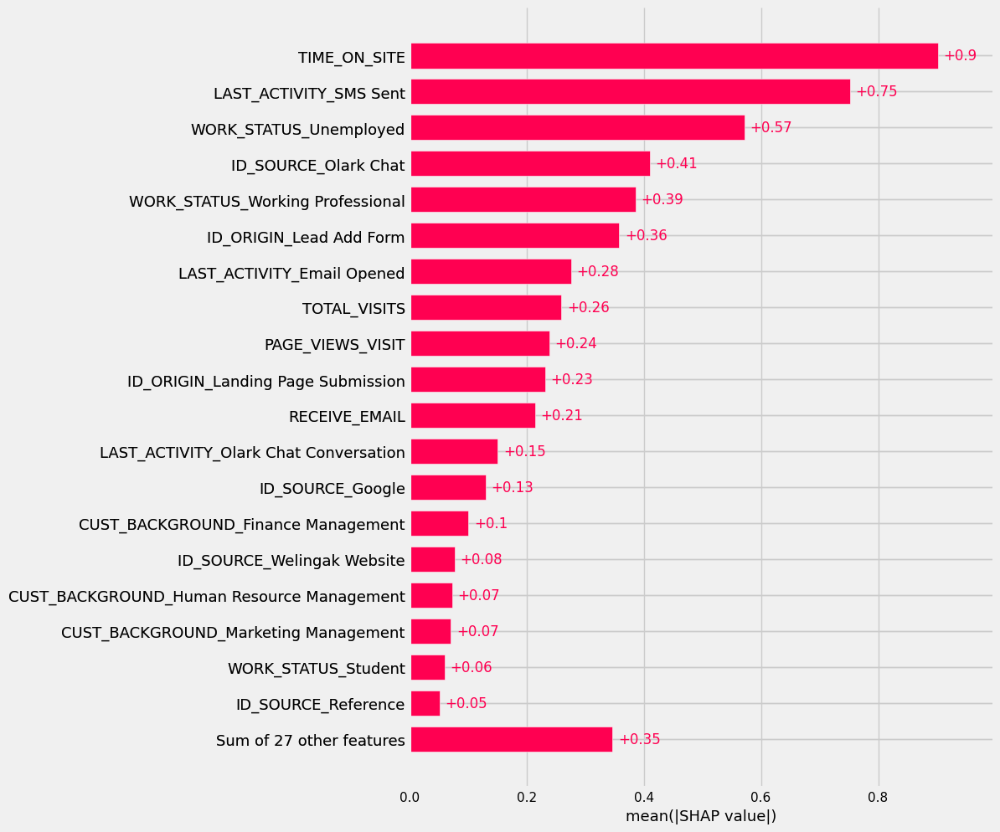

In [15]:
shap.plots.bar(shap_values_lr, max_display= len(features_shap_lr.index)+1)

In [16]:
# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train_lr_shap, X_test_lr_shap, y_train_lr_shap, y_test_lr_shap = train_test_split(X[features_shap_lr.index], Y, test_size=0.2, random_state=42)

In [17]:
lr_model_shap = LogisticRegression(random_state= 42, max_iter= 200)
evaluate_model(lr_model_shap, X_train_lr_shap, y_train_lr_shap, X_test_lr_shap, y_test_lr_shap)

**Accuracy Score**
Train Accuracy is: 0.8145292207792207

Test Accuracy is: 0.8322510822510822
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.18547077922077926

Test Error: 0.16774891774891776
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.827    0.791     0.815      0.809         0.813
recall       0.886    0.699     0.815      0.792         0.815
f1-score     0.855    0.742     0.815      0.799         0.812
support   4572.000 2820.000     0.815   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.839   0.821     0.832      0.830         0.832
recall       0.892   0.744     0.832      0.818         0.832
f1-score     0.864   0.780     0.832      0.822         0.831
support   1107.000 741.000     0.832   1848.000      18

In [18]:
#shap.plots.bar(shap_values[0])

In [19]:
"""
expected_value= explainer.expected_value
shap.decision_plot(expected_value, shap_values.values[1000] , X_test[features], link="logit")
"""

'\nexpected_value= explainer.expected_value\nshap.decision_plot(expected_value, shap_values.values[1000] , X_test[features], link="logit")\n'

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            Decision Tree
            </span>   
        </font>    
</h3>

In [20]:
dt_model = models_shap['Decision Tree'].fit(X_train, y_train)

# Khởi tạo SHAP Explainer
explainer_dt = shap.TreeExplainer(dt_model, X_train)

# Tính toán SHAP values cho tập kiểm tra
shap_values_dt = explainer_dt(X_test, check_additivity= False)

features_shap_dt = summarize_shap_values(shap_values_dt, percentile= 60, class_index = 1)
features_shap_dt

,SHAP Value
TIME_ON_SITE,0.159
LAST_ACTIVITY_SMS Sent,0.101
WORK_STATUS_Unemployed,0.057
ID_ORIGIN_Lead Add Form,0.050
WORK_STATUS_Working Professional,0.048
TOTAL_VISITS,0.029
LAST_ACTIVITY_Email Opened,0.020
RECEIVE_EMAIL,0.019
ID_SOURCE_Olark Chat,0.011
ID_ORIGIN_Landing Page Submission,0.005


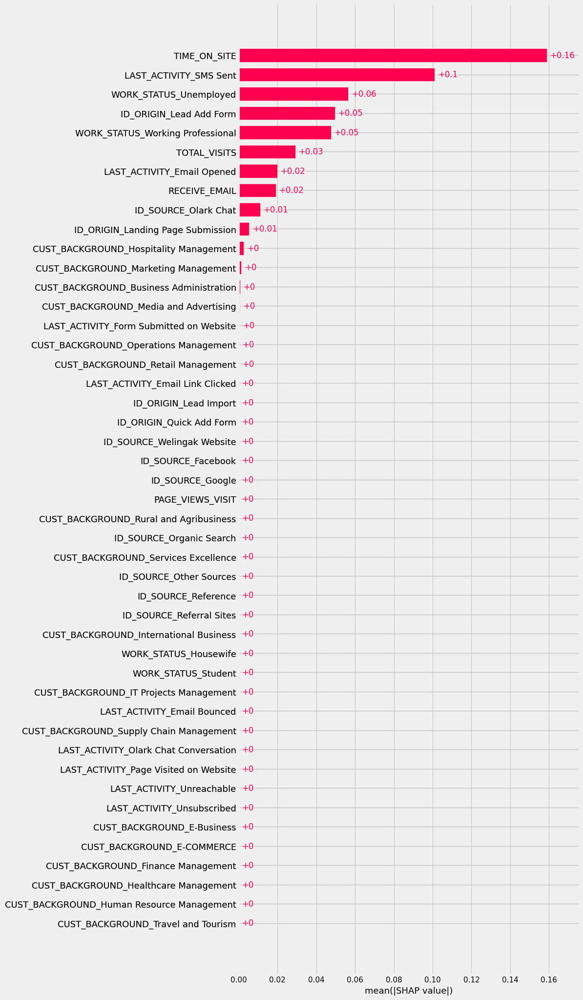

In [21]:
shap.plots.bar(shap_values_dt[:, :, 1], max_display= len(features_shap_dt.index)+1)

In [22]:
# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train_dt_shap, X_test_dt_shap, y_train_dt_shap, y_test_dt_shap = train_test_split(X[features_shap_dt.index], Y, test_size=0.2, random_state=42)

In [23]:
dt_model_shap = DecisionTreeClassifier(max_depth= 9, random_state= 42)
evaluate_model(dt_model_shap, X_train_dt_shap, y_train_dt_shap, X_test_dt_shap, y_test_dt_shap)

**Accuracy Score**
Train Accuracy is: 0.8474025974025974

Test Accuracy is: 0.8246753246753247
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.15259740259740262

Test Error: 0.17532467532467533
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.872    0.807     0.847      0.839         0.847
recall       0.883    0.789     0.847      0.836         0.847
f1-score     0.877    0.798     0.847      0.838         0.847
support   4572.000 2820.000     0.847   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.847   0.790     0.825      0.818         0.824
recall       0.864   0.767     0.825      0.815         0.825
f1-score     0.855   0.778     0.825      0.817         0.824
support   1107.000 741.000     0.825   1848.000      18

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            Random Forest
            </span>   
        </font>    
</h3>

In [24]:
rf_model = models_shap['Random Forest'].fit(X_train, y_train)

# Khởi tạo SHAP Explainer
explainer_rf = shap.TreeExplainer(rf_model, X_train)

# Tính toán SHAP values cho tập kiểm tra
shap_values_rf = explainer_rf(X_test, check_additivity= False)

features_shap_rf = summarize_shap_values(shap_values_rf, percentile= 60, class_index = 1)
features_shap_rf

100%|===================| 3681/3696 [00:26<00:00]        

,SHAP Value
TIME_ON_SITE,0.120
LAST_ACTIVITY_SMS Sent,0.065
WORK_STATUS_Working Professional,0.031
ID_ORIGIN_Lead Add Form,0.029
WORK_STATUS_Unemployed,0.029
LAST_ACTIVITY_Olark Chat Conversation,0.017
RECEIVE_EMAIL,0.016
ID_SOURCE_Reference,0.016
TOTAL_VISITS,0.015
PAGE_VIEWS_VISIT,0.014


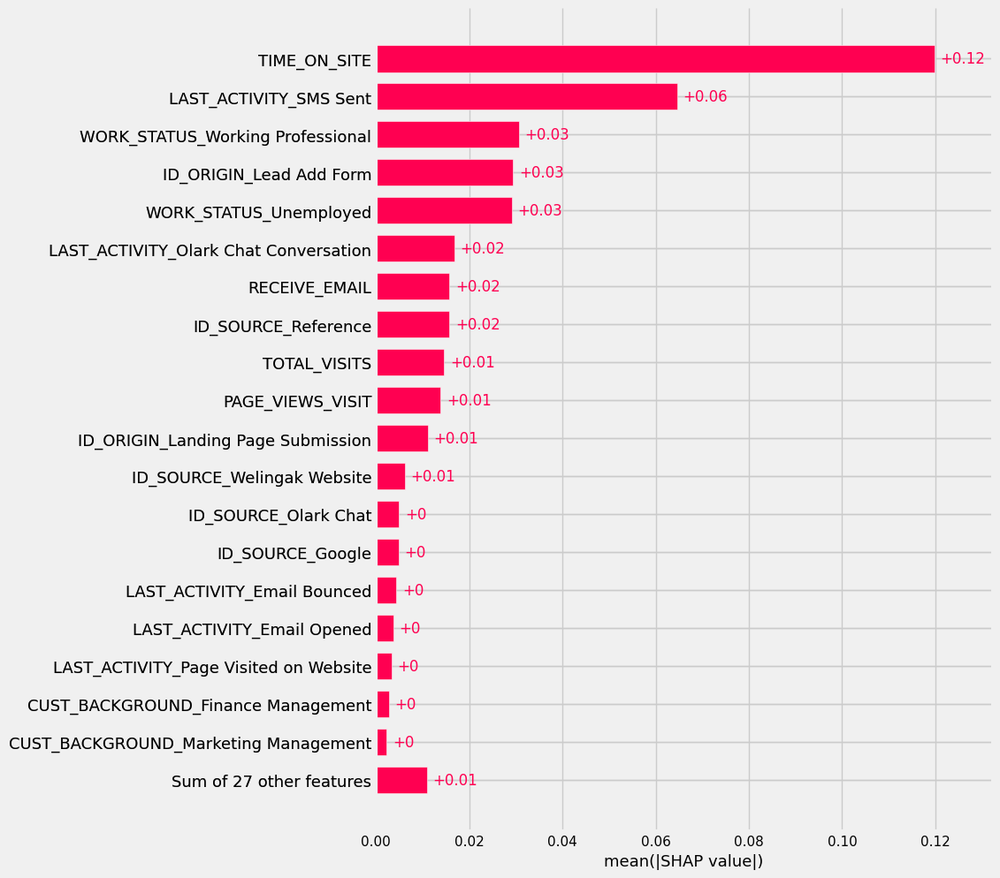

In [25]:
shap.plots.bar(shap_values_rf[:, :, 1], max_display= len(features_shap_rf.index)+1)

In [26]:
# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train_rf_shap, X_test_rf_shap, y_train_rf_shap, y_test_rf_shap = train_test_split(X[features_shap_rf.index], Y, test_size=0.2, random_state=42)

rf_model_shap = RandomForestClassifier(random_state= 42, max_depth= 9)
evaluate_model(rf_model_shap, X_train_rf_shap, y_train_rf_shap, X_test_rf_shap, y_test_rf_shap)

**Accuracy Score**
Train Accuracy is: 0.8436147186147186

Test Accuracy is: 0.8392857142857143
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.1563852813852814

Test Error: 0.1607142857142857
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.864    0.809     0.844      0.836         0.843
recall       0.887    0.773     0.844      0.830         0.844
f1-score     0.875    0.790     0.844      0.833         0.843
support   4572.000 2820.000     0.844   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.850   0.822     0.839      0.836         0.839
recall       0.889   0.765     0.839      0.827         0.839
f1-score     0.869   0.792     0.839      0.831         0.838
support   1107.000 741.000     0.839   1848.000      1848

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            CatBoost
            </span>   
        </font>    
</h3>

In [27]:
cb_model = models_shap['CatBoost'].fit(X_train, y_train)

# Khởi tạo SHAP Explainer
explainer_cb = shap.TreeExplainer(cb_model, X_train)

# Tính toán SHAP values cho tập kiểm tra
shap_values_cb = explainer_cb(X_test, check_additivity= False)

features_shap_cb = summarize_shap_values(shap_values_cb, percentile= 60, class_index = 1)
features_shap_cb

 99%|===================| 1827/1848 [01:04<00:00]        

,SHAP Value
TIME_ON_SITE,0.954
LAST_ACTIVITY_SMS Sent,0.658
WORK_STATUS_Unemployed,0.543
WORK_STATUS_Working Professional,0.318
ID_ORIGIN_Lead Add Form,0.276
RECEIVE_EMAIL,0.238
TOTAL_VISITS,0.209
PAGE_VIEWS_VISIT,0.204
ID_ORIGIN_Landing Page Submission,0.175
LAST_ACTIVITY_Olark Chat Conversation,0.141


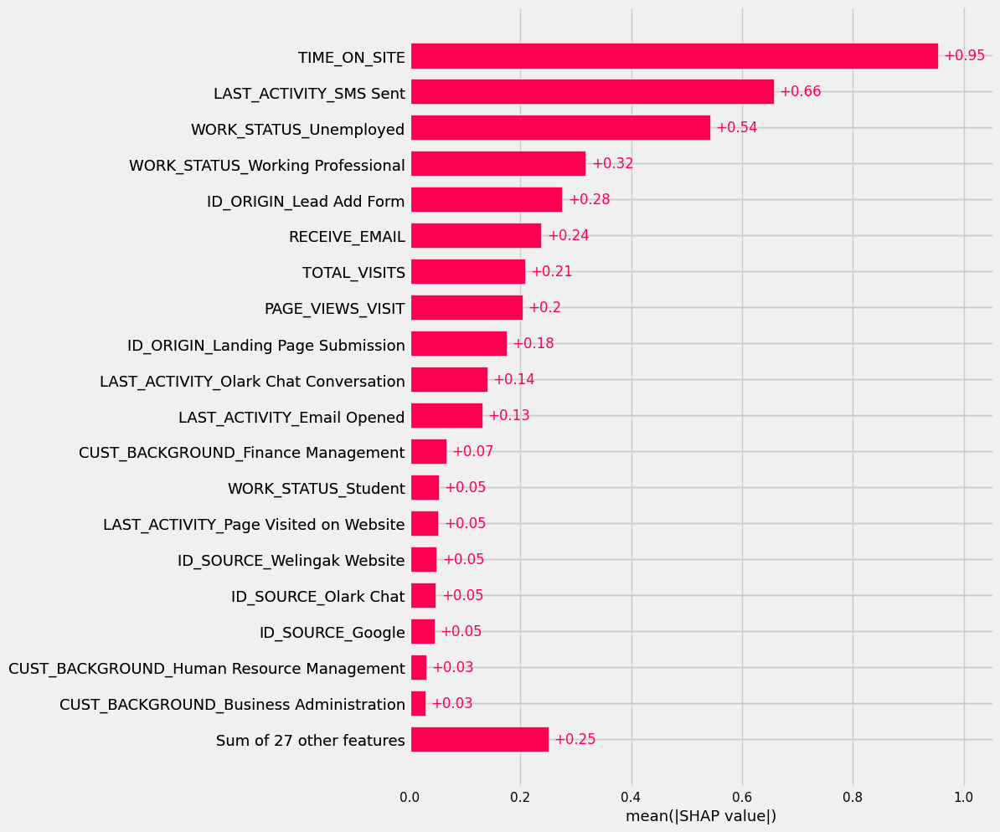

In [28]:
shap.plots.bar(shap_values_cb, max_display= len(features_shap_cb.index)+1)

In [29]:
# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train_cb_shap, X_test_cb_shap, y_train_cb_shap, y_test_cb_shap = train_test_split(X[features_shap_cb.index], Y, test_size=0.2, random_state=42)

cb_model_shap = CatBoostClassifier(verbose= 0)
evaluate_model(cb_model_shap, X_train_cb_shap, y_train_cb_shap, X_test_cb_shap, y_test_cb_shap)

**Accuracy Score**
Train Accuracy is: 0.8691829004329005

Test Accuracy is: 0.8338744588744589
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.13081709956709953

Test Error: 0.16612554112554112
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.884    0.843     0.869      0.864         0.869
recall       0.907    0.807     0.869      0.857         0.869
f1-score     0.896    0.825     0.869      0.860         0.869
support   4572.000 2820.000     0.869   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.847   0.813     0.834      0.830         0.833
recall       0.883   0.761     0.834      0.822         0.834
f1-score     0.864   0.786     0.834      0.825         0.833
support   1107.000 741.000     0.834   1848.000      18

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            XGBoost
            </span>   
        </font>    
</h3>

In [30]:
xg_model = models_shap['XGBoost'].fit(X_train, y_train)

# Khởi tạo SHAP Explainer
explainer_xg = shap.TreeExplainer(xg_model, X_train)

# Tính toán SHAP values cho tập kiểm tra
shap_values_xg = explainer_xg(X_test, check_additivity= False)

features_shap_xg = summarize_shap_values(shap_values_xg, percentile= 60, class_index = 1)
features_shap_xg

,SHAP Value
TIME_ON_SITE,1.104
LAST_ACTIVITY_SMS Sent,0.738
WORK_STATUS_Unemployed,0.614
WORK_STATUS_Working Professional,0.407
ID_ORIGIN_Lead Add Form,0.352
PAGE_VIEWS_VISIT,0.334
TOTAL_VISITS,0.312
RECEIVE_EMAIL,0.281
ID_ORIGIN_Landing Page Submission,0.239
LAST_ACTIVITY_Email Opened,0.169


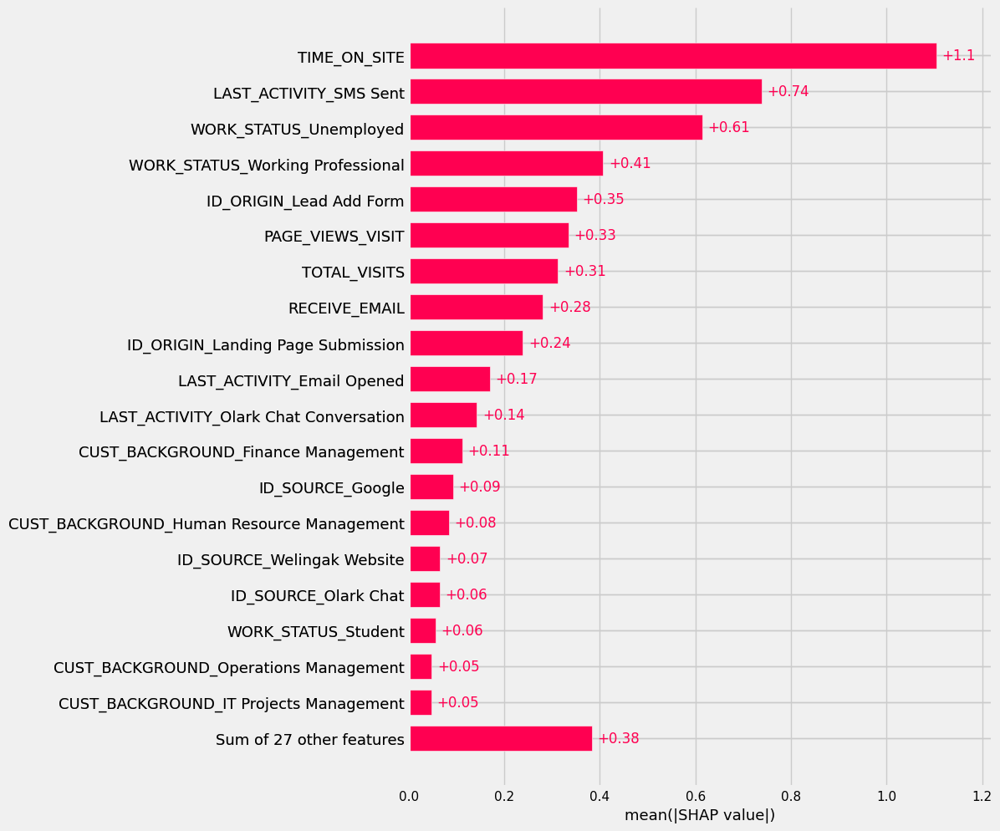

In [31]:
shap.plots.bar(shap_values_xg, max_display= len(features_shap_xg.index)+1)

In [32]:
# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train_xg_shap, X_test_xg_shap, y_train_xg_shap, y_test_xg_shap = train_test_split(X[features_shap_xg.index], Y, test_size=0.2, random_state=42)

xg_model_shap = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
evaluate_model(xg_model_shap, X_train_xg_shap, y_train_xg_shap, X_test_xg_shap, y_test_xg_shap)

**Accuracy Score**
Train Accuracy is: 0.896780303030303

Test Accuracy is: 0.8187229437229437
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.10321969696969702

Test Error: 0.18127705627705626
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.905    0.883     0.897      0.894         0.896
recall       0.931    0.841     0.897      0.886         0.897
f1-score     0.918    0.861     0.897      0.890         0.896
support   4572.000 2820.000     0.897   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.835   0.792     0.819      0.813         0.818
recall       0.869   0.744     0.819      0.806         0.819
f1-score     0.852   0.767     0.819      0.809         0.818
support   1107.000 741.000     0.819   1848.000      184

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            LightGBM
            </span>   
        </font>    
</h3>

In [33]:
lgb_model = models_shap['LightGBM'].fit(X_train, y_train)

# Khởi tạo SHAP Explainer
explainer_lgb = shap.TreeExplainer(lgb_model, X_train)

# Tính toán SHAP values cho tập kiểm tra
shap_values_lgb = explainer_lgb(X_test, check_additivity= False)

features_shap_lgb = summarize_shap_values(shap_values_lgb, percentile= 60, class_index = 1)
features_shap_lgb

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2820, number of negative: 4572
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 396
[LightGBM] [Info] Number of data points in the train set: 7392, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381494 -> initscore=-0.483214
[LightGBM] [Info] Start training from score -0.483214


,SHAP Value
TIME_ON_SITE,0.971
LAST_ACTIVITY_SMS Sent,0.687
WORK_STATUS_Unemployed,0.551
WORK_STATUS_Working Professional,0.359
ID_ORIGIN_Lead Add Form,0.329
RECEIVE_EMAIL,0.272
PAGE_VIEWS_VISIT,0.267
TOTAL_VISITS,0.222
LAST_ACTIVITY_Email Opened,0.169
ID_ORIGIN_Landing Page Submission,0.124


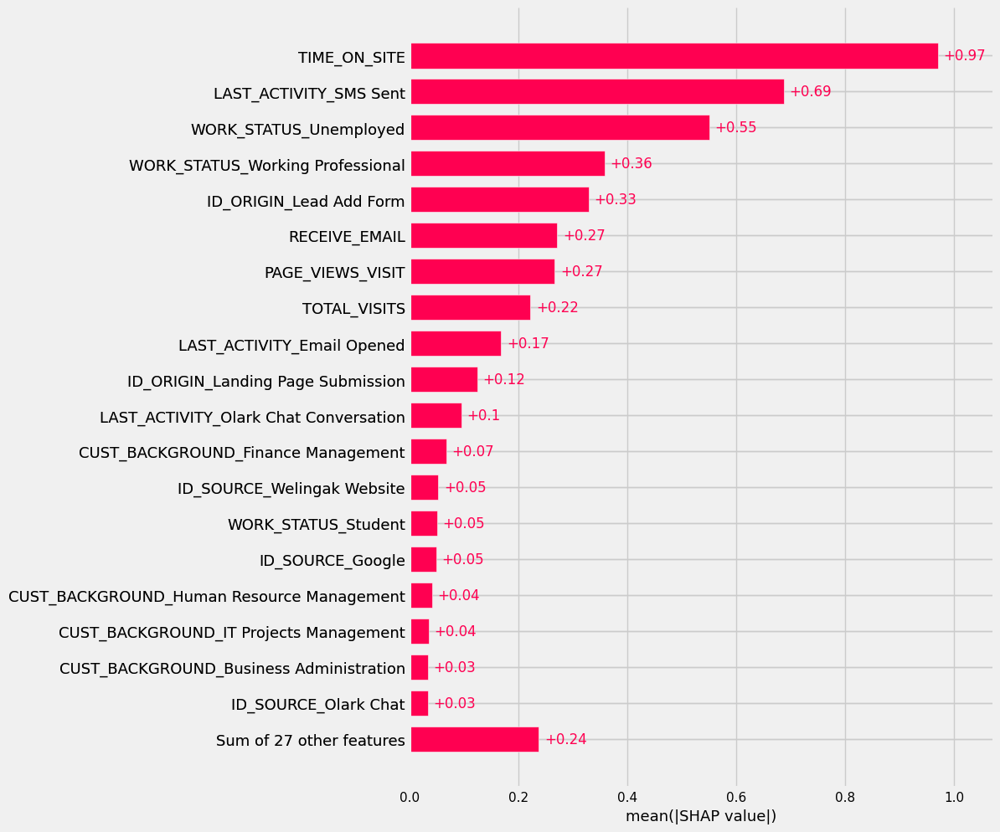

In [34]:
shap.plots.bar(shap_values_lgb, max_display= len(features_shap_lgb.index)+1)

In [35]:
# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train_lgb_shap, X_test_lgb_shap, y_train_lgb_shap, y_test_lgb_shap = train_test_split(X[features_shap_lgb.index], Y, test_size=0.2, random_state=42)

lgb_model_shap = LGBMClassifier()
evaluate_model(lgb_model_shap, X_train_lgb_shap, y_train_lgb_shap, X_test_lgb_shap, y_test_lgb_shap)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2820, number of negative: 4572
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 7392, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381494 -> initscore=-0.483214
[LightGBM] [Info] Start training from score -0.483214
**Accuracy Score**
Train Accuracy is: 0.8626893939393939

Test Accuracy is: 0.829004329004329
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.13731060606060608

Test Error: 0.17099567099567103
---------------------------------------------------------

**Classification Report**
Train Classification Report:
              

<a id="ROC"></a>
<h2>   
      <font color = yellow >
            <span style='font-family:Georgia'>
            Hyperparameter Turning
            </span>   
        </font>    
</h2>

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            LightGBM
            </span>   
        </font>    
</h3>

In [36]:
def objective_lgbm(trial):
    params = {
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.35),
        'num_leaves': trial.suggest_int('num_leaves', 2, 256),
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.15, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_lambda': trial.suggest_loguniform('lambda', 1e-6, 10.0),
        'reg_alpha': trial.suggest_loguniform('alpha', 1e-8, 10.0),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 100),
        'metric': 'auc'
    }
    
    # Tạo và huấn luyện mô hình với các tham số được lựa chọn bởi Optuna
    model = LGBMClassifier(**params)
    #model.fit(X_train_lgb_shap, y_train_lgb_shap, eval_set=[(X_test_lgb_shap, y_test_lgb_shap)])
    
    # Đánh giá mô hình
    #preds = model.predict(X_test_lgb_shap)
    #gini_index = 2 * roc_auc_score(y_test_lgb_shap, preds) - 1
    scores = cross_val_score(model, X_train_lgb_shap, y_train_lgb_shap, cv=5, scoring='roc_auc')
    return scores.mean()

# Tạo một study object của Optuna và bắt đầu quá trình tối ưu hóa
study_lgb = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
study_lgb.optimize(objective_lgbm, n_trials=100)

# In ra tham số tốt nhất được tìm thấy
print('Best trial:', study_lgb.best_trial.params)

[I 2024-04-01 22:11:33,997] A new study created in memory with name: no-name-d8027949-d9eb-4d53-bc6c-66fb67559a50


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:34,449] Trial 0 finished with value: 0.8768109476778735 and parameters: {'max_depth': 5, 'learning_rate': 0.33279929293706073, 'num_leaves': 188, 'n_estimators': 200, 'min_child_weight': 2, 'subsample': 0.2825953422857722, 'colsample_bytree': 0.5290418060840998, 'lambda': 1.156732719914599, 'alpha': 0.002570603566117598, 'scale_pos_weight': 71.09918520180851}. Best is trial 0 with value: 0.8768109476778735.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:34,579] Trial 1 finished with value: 0.8938242247627646 and parameters: {'max_depth': 2, 'learning_rate': 0.339498538404536, 'num_leaves': 214, 'n_estimators': 103, 'min_child_weight': 2, 'subsample': 0.30589383337541876, 'colsample_bytree': 0.6521211214797689, 'lambda': 0.004712973756110786, 'alpha': 7.71800699380605e-05, 'scale_pos_weight': 29.83168487960615}. Best is trial 1 with value: 0.8938242247627646.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to r

[I 2024-04-01 22:11:35,127] Trial 2 finished with value: 0.895859561348989 and parameters: {'max_depth': 7, 'learning_rate': 0.049683357367562596, 'num_leaves': 76, 'n_estimators': 141, 'min_child_weight': 5, 'subsample': 0.8173995671840616, 'colsample_bytree': 0.5998368910791798, 'lambda': 0.003977782830811193, 'alpha': 0.0021465011216654484, 'scale_pos_weight': 5.598590859279775}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 22:11:35,732] Trial 3 finished with value: 0.8928543578507784 and parameters: {'max_depth': 7, 'learning_rate': 0.06051291916686474, 'num_leaves': 18, 'n_estimators': 288, 'min_child_weight': 10, 'subsample': 0.8371377458989919, 'colsample_bytree': 0.6523068845866853, 'lambda': 4.827305651975704e-06, 'alpha': 0.014391207615728067, 'scale_pos_weight': 44.57509688022053}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:36,076] Trial 4 finished with value: 0.8916404816887693 and parameters: {'max_depth': 3, 'learning_rate': 0.1738167416288333, 'num_leaves': 10, 'n_estimators': 278, 'min_child_weight': 3, 'subsample': 0.7131439417008847, 'colsample_bytree': 0.6558555380447055, 'lambda': 0.004369946783595583, 'alpha': 0.0008325158565947976, 'scale_pos_weight': 19.300591097027176}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:37,506] Trial 5 finished with value: 0.855966710951036 and parameters: {'max_depth': 10, 'learning_rate': 0.27152135535302896, 'num_leaves': 241, 'n_estimators': 274, 'min_child_weight': 6, 'subsample': 0.9335930997696493, 'colsample_bytree': 0.5442462510259598, 'lambda': 2.354398849850489e-05, 'alpha': 2.5529693461039728e-08, 'scale_pos_weight': 33.20770274556317}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:37,847] Trial 6 finished with value: 0.8927874542771518 and parameters: {'max_depth': 5, 'learning_rate': 0.09570081208908966, 'num_leaves': 213, 'n_estimators': 139, 'min_child_weight': 3, 'subsample': 0.6112916706845112, 'colsample_bytree': 0.5704621124873813, 'lambda': 0.41245717727594217, 'alpha': 4.6876566400928895e-08, 'scale_pos_weight': 98.70180672345121}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:38,066] Trial 7 finished with value: 0.8940597882236989 and parameters: {'max_depth': 8, 'learning_rate': 0.07035177285542617, 'num_leaves': 3, 'n_estimators': 254, 'min_child_weight': 8, 'subsample': 0.7696560928348393, 'colsample_bytree': 0.8856351733429728, 'lambda': 3.298470179752566e-06, 'alpha': 1.683416412018213e-05, 'scale_pos_weight': 12.471036892987842}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:38,391] Trial 8 finished with value: 0.8807467693483982 and parameters: {'max_depth': 9, 'learning_rate': 0.2185310462628177, 'num_leaves': 86, 'n_estimators': 65, 'min_child_weight': 4, 'subsample': 0.42640582372273494, 'colsample_bytree': 0.864803089169032, 'lambda': 0.02903369428128565, 'alpha': 0.9658611176861268, 'scale_pos_weight': 47.74927759103298}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:38,634] Trial 9 finished with value: 0.8922214348220496 and parameters: {'max_depth': 3, 'learning_rate': 0.24992243074082524, 'num_leaves': 196, 'n_estimators': 190, 'min_child_weight': 8, 'subsample': 0.5697262569097321, 'colsample_bytree': 0.7613664146909971, 'lambda': 0.0009835289062589984, 'alpha': 1.6934490731313353e-08, 'scale_pos_weight': 11.681251272337141}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:39,006] Trial 10 finished with value: 0.8827929279168003 and parameters: {'max_depth': 6, 'learning_rate': 0.0030930168515801992, 'num_leaves': 111, 'n_estimators': 137, 'min_child_weight': 6, 'subsample': 0.9215150759901403, 'colsample_bytree': 0.9798853729727102, 'lambda': 0.0001894610700445665, 'alpha': 3.3316309468938505, 'scale_pos_weight': 2.2188057869288116}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:39,767] Trial 11 finished with value: 0.8855168166967168 and parameters: {'max_depth': 8, 'learning_rate': 0.1231120456015535, 'num_leaves': 52, 'n_estimators': 226, 'min_child_weight': 8, 'subsample': 0.7483333541282251, 'colsample_bytree': 0.8533870437262304, 'lambda': 1.1349407813370756e-06, 'alpha': 1.8484284551913724e-05, 'scale_pos_weight': 1.6650720329346989}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:41,367] Trial 12 finished with value: 0.8895656627293267 and parameters: {'max_depth': 8, 'learning_rate': 0.0060856009880966705, 'num_leaves': 63, 'n_estimators': 240, 'min_child_weight': 8, 'subsample': 0.9872246579572784, 'colsample_bytree': 0.9307980094059525, 'lambda': 8.79326184891175e-05, 'alpha': 1.970339994227758e-06, 'scale_pos_weight': 67.05731543738487}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:42,278] Trial 13 finished with value: 0.891971222834588 and parameters: {'max_depth': 7, 'learning_rate': 0.06575574823998584, 'num_leaves': 150, 'n_estimators': 152, 'min_child_weight': 5, 'subsample': 0.7692939085247532, 'colsample_bytree': 0.7689231819425726, 'lambda': 0.06758301568047269, 'alpha': 0.058674306712737684, 'scale_pos_weight': 21.832513385728785}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:43,005] Trial 14 finished with value: 0.8899367550598623 and parameters: {'max_depth': 10, 'learning_rate': 0.1305078178857805, 'num_leaves': 47, 'n_estimators': 101, 'min_child_weight': 7, 'subsample': 0.6093917731555221, 'colsample_bytree': 0.8308851073086486, 'lambda': 6.093810774387969, 'alpha': 4.644950991223319e-06, 'scale_pos_weight': 12.460933950545051}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:44,068] Trial 15 finished with value: 0.8927089396251059 and parameters: {'max_depth': 6, 'learning_rate': 0.059579298763041216, 'num_leaves': 131, 'n_estimators': 219, 'min_child_weight': 10, 'subsample': 0.85361917053891, 'colsample_bytree': 0.6934262427827522, 'lambda': 0.0003888775491031297, 'alpha': 9.005542285138934e-07, 'scale_pos_weight': 36.35434572135562}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:44,332] Trial 16 finished with value: 0.89135324896067 and parameters: {'max_depth': 8, 'learning_rate': 0.16034958199148733, 'num_leaves': 5, 'n_estimators': 169, 'min_child_weight': 5, 'subsample': 0.48773936428910497, 'colsample_bytree': 0.9257586930950283, 'lambda': 2.5847028063272556e-05, 'alpha': 0.0002471178877944872, 'scale_pos_weight': 63.1145628348818}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 22:11:45,525] Trial 17 finished with value: 0.8908850182891392 and parameters: {'max_depth': 9, 'learning_rate': 0.03628187810629803, 'num_leaves': 96, 'n_estimators': 249, 'min_child_weight': 9, 'subsample': 0.18076618281735723, 'colsample_bytree': 0.5906453756958359, 'lambda': 0.03911171331671268, 'alpha': 0.11784486003308484, 'scale_pos_weight': 81.75725389364473}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:45,838] Trial 18 finished with value: 0.8946115036663507 and parameters: {'max_depth': 5, 'learning_rate': 0.0964172946618151, 'num_leaves': 73, 'n_estimators': 110, 'min_child_weight': 7, 'subsample': 0.6650590883077234, 'colsample_bytree': 0.7169334145801249, 'lambda': 0.0014749280835566897, 'alpha': 0.0060938125428109235, 'scale_pos_weight': 20.20492001994643}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:46,028] Trial 19 finished with value: 0.8954351443876517 and parameters: {'max_depth': 4, 'learning_rate': 0.11280418037366005, 'num_leaves': 151, 'n_estimators': 51, 'min_child_weight': 1, 'subsample': 0.6513401221185852, 'colsample_bytree': 0.7142878222680447, 'lambda': 0.0010676387344481211, 'alpha': 0.007232896124595565, 'scale_pos_weight': 24.899718941033377}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:46,193] Trial 20 finished with value: 0.8949998225487494 and parameters: {'max_depth': 4, 'learning_rate': 0.20936859158876456, 'num_leaves': 169, 'n_estimators': 50, 'min_child_weight': 1, 'subsample': 0.49759707442356305, 'colsample_bytree': 0.5943266937372478, 'lambda': 0.008705943322478637, 'alpha': 0.578532941539833, 'scale_pos_weight': 42.088492276266734}. Best is trial 2 with value: 0.895859561348989.
[I 2024-04-01 22:11:46,370] Trial 21 finished with value: 0.8941271533401837 and parameters: {'max_depth': 4, 'learning_rate': 0.21410547138020114, 'num_leaves': 152, 'n_estimators': 57, 'min_child_weight': 1, 'subsample': 0.5495469379291512, 'colsample_bytree': 0.6179135976457437, 'lambda': 0.010905667752908467, 'alpha': 0.3008442994177752, 'scale_pos_weight': 56.657905161830136}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:46,564] Trial 22 finished with value: 0.8953726128566633 and parameters: {'max_depth': 4, 'learning_rate': 0.139992218874943, 'num_leaves': 165, 'n_estimators': 74, 'min_child_weight': 1, 'subsample': 0.45630839718094984, 'colsample_bytree': 0.5114371860526318, 'lambda': 0.11815969257157147, 'alpha': 5.12600774980234, 'scale_pos_weight': 40.050526659657706}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:46,734] Trial 23 finished with value: 0.8939366851818071 and parameters: {'max_depth': 2, 'learning_rate': 0.1375907416304509, 'num_leaves': 129, 'n_estimators': 81, 'min_child_weight': 2, 'subsample': 0.32064534905549386, 'colsample_bytree': 0.5008068626685681, 'lambda': 0.10798674373624721, 'alpha': 0.04279649543775715, 'scale_pos_weight': 26.641762861153623}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overh

[I 2024-04-01 22:11:46,925] Trial 24 finished with value: 0.8955246588971428 and parameters: {'max_depth': 4, 'learning_rate': 0.10315704085330979, 'num_leaves': 108, 'n_estimators': 81, 'min_child_weight': 3, 'subsample': 0.39935260283571655, 'colsample_bytree': 0.5110021684815567, 'lambda': 0.2595802599748276, 'alpha': 2.996370228878413, 'scale_pos_weight': 54.268409585162686}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:47,225] Trial 25 finished with value: 0.8926284492643342 and parameters: {'max_depth': 6, 'learning_rate': 0.1059140611110868, 'num_leaves': 110, 'n_estimators': 86, 'min_child_weight': 4, 'subsample': 0.37504964085400433, 'colsample_bytree': 0.804185936321064, 'lambda': 0.7817712897803829, 'alpha': 0.0015222192586195969, 'scale_pos_weight': 55.459292751810416}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:47,450] Trial 26 finished with value: 0.886707325475953 and parameters: {'max_depth': 3, 'learning_rate': 0.0393539805801722, 'num_leaves': 35, 'n_estimators': 127, 'min_child_weight': 4, 'subsample': 0.6591836382647891, 'colsample_bytree': 0.7034373799795172, 'lambda': 6.253109727914683, 'alpha': 0.011295174748055893, 'scale_pos_weight': 78.92513331995852}. Best is trial 2 with value: 0.895859561348989.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:47,800] Trial 27 finished with value: 0.8967478799769776 and parameters: {'max_depth': 5, 'learning_rate': 0.03315734928363079, 'num_leaves': 115, 'n_estimators': 115, 'min_child_weight': 3, 'subsample': 0.8388218329801364, 'colsample_bytree': 0.5531659036410352, 'lambda': 0.0008920047458768995, 'alpha': 0.00017522862089164995, 'scale_pos_weight': 7.550129172448367}. Best is trial 27 with value: 0.8967478799769776.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:48,369] Trial 28 finished with value: 0.8963730726186487 and parameters: {'max_depth': 7, 'learning_rate': 0.032967716358732344, 'num_leaves': 103, 'n_estimators': 117, 'min_child_weight': 3, 'subsample': 0.8399529496845108, 'colsample_bytree': 0.5605349199861517, 'lambda': 0.00035466608899839785, 'alpha': 0.00020272097997555465, 'scale_pos_weight': 6.084958972094929}. Best is trial 27 with value: 0.8967478799769776.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:49,100] Trial 29 finished with value: 0.8961364260054575 and parameters: {'max_depth': 7, 'learning_rate': 0.02501647572122742, 'num_leaves': 81, 'n_estimators': 161, 'min_child_weight': 5, 'subsample': 0.8690429487270708, 'colsample_bytree': 0.5467731930568646, 'lambda': 5.9328922414146874e-05, 'alpha': 0.00013098681166429427, 'scale_pos_weight': 6.447045460302837}. Best is trial 27 with value: 0.8967478799769776.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:49,752] Trial 30 finished with value: 0.8947404271940627 and parameters: {'max_depth': 6, 'learning_rate': 0.015363443062890548, 'num_leaves': 129, 'n_estimators': 176, 'min_child_weight': 3, 'subsample': 0.9021366340550621, 'colsample_bytree': 0.5490085408330301, 'lambda': 5.950140453793111e-05, 'alpha': 0.00021367935875846227, 'scale_pos_weight': 9.25042323152124}. Best is trial 27 with value: 0.8967478799769776.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:50,471] Trial 31 finished with value: 0.8960026782206298 and parameters: {'max_depth': 7, 'learning_rate': 0.028639095299720176, 'num_leaves': 83, 'n_estimators': 157, 'min_child_weight': 5, 'subsample': 0.8412157098015705, 'colsample_bytree': 0.6116206820450295, 'lambda': 0.0004402344296913165, 'alpha': 7.326733980110154e-05, 'scale_pos_weight': 5.242311798012447}. Best is trial 27 with value: 0.8967478799769776.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:51,049] Trial 32 finished with value: 0.8955725923596658 and parameters: {'max_depth': 7, 'learning_rate': 0.02722505022716405, 'num_leaves': 93, 'n_estimators': 122, 'min_child_weight': 4, 'subsample': 0.9818852832335638, 'colsample_bytree': 0.553592472971766, 'lambda': 0.0002707884645150045, 'alpha': 4.777876654296373e-05, 'scale_pos_weight': 13.959554844479118}. Best is trial 27 with value: 0.8967478799769776.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:51,711] Trial 33 finished with value: 0.892039186451527 and parameters: {'max_depth': 7, 'learning_rate': 0.08225945109560388, 'num_leaves': 75, 'n_estimators': 161, 'min_child_weight': 2, 'subsample': 0.8675547328413041, 'colsample_bytree': 0.6282733387466523, 'lambda': 0.0005344705737597196, 'alpha': 6.921832114821544e-05, 'scale_pos_weight': 6.6648843022299005}. Best is trial 27 with value: 0.8967478799769776.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:52,229] Trial 34 finished with value: 0.8977324939995188 and parameters: {'max_depth': 5, 'learning_rate': 0.031301862444285275, 'num_leaves': 113, 'n_estimators': 188, 'min_child_weight': 5, 'subsample': 0.8095912796049692, 'colsample_bytree': 0.5633862729668964, 'lambda': 9.076051271157662e-05, 'alpha': 0.00041085361088241733, 'scale_pos_weight': 1.1249517989958537}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:52,760] Trial 35 finished with value: 0.8957449170287137 and parameters: {'max_depth': 5, 'learning_rate': 0.04438946476485397, 'num_leaves': 118, 'n_estimators': 198, 'min_child_weight': 6, 'subsample': 0.8027991579526867, 'colsample_bytree': 0.5668037340070584, 'lambda': 1.2371674499545402e-05, 'alpha': 0.0006403801975424538, 'scale_pos_weight': 30.299676410237158}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:53,399] Trial 36 finished with value: 0.8916576914919483 and parameters: {'max_depth': 6, 'learning_rate': 0.08150896960174683, 'num_leaves': 100, 'n_estimators': 183, 'min_child_weight': 3, 'subsample': 0.7133569787190659, 'colsample_bytree': 0.6469990486255549, 'lambda': 0.0001044937072969479, 'alpha': 3.334053402100213e-07, 'scale_pos_weight': 17.246008302137476}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:53,907] Trial 37 finished with value: 0.8796897639080015 and parameters: {'max_depth': 5, 'learning_rate': 0.34723143604190765, 'num_leaves': 138, 'n_estimators': 210, 'min_child_weight': 4, 'subsample': 0.9037748999117503, 'colsample_bytree': 0.5343920398035649, 'lambda': 3.718018926929803e-05, 'alpha': 0.0003762594821510781, 'scale_pos_weight': 6.827209049811169}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total B

[I 2024-04-01 22:11:54,423] Trial 38 finished with value: 0.8942015068982107 and parameters: {'max_depth': 6, 'learning_rate': 0.018384307402572492, 'num_leaves': 66, 'n_estimators': 101, 'min_child_weight': 2, 'subsample': 0.8104671812329758, 'colsample_bytree': 0.667124604621604, 'lambda': 1.0687368643414188e-05, 'alpha': 1.87219497565435e-05, 'scale_pos_weight': 16.664809163657097}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:54,984] Trial 39 finished with value: 0.8839437300176535 and parameters: {'max_depth': 9, 'learning_rate': 0.318878789515203, 'num_leaves': 22, 'n_estimators': 126, 'min_child_weight': 5, 'subsample': 0.9560832190367862, 'colsample_bytree': 0.5777686824402828, 'lambda': 0.0028937480682928508, 'alpha': 7.88788713477617e-06, 'scale_pos_weight': 1.8619272821189528}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to r

[I 2024-04-01 22:11:55,469] Trial 40 finished with value: 0.8965175094562225 and parameters: {'max_depth': 5, 'learning_rate': 0.04439307859001308, 'num_leaves': 50, 'n_estimators': 111, 'min_child_weight': 7, 'subsample': 0.8847381422492117, 'colsample_bytree': 0.529952097737734, 'lambda': 0.00019748982646305502, 'alpha': 0.0025156178224178603, 'scale_pos_weight': 8.509645050860623}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:56,029] Trial 41 finished with value: 0.896883061364381 and parameters: {'max_depth': 5, 'learning_rate': 0.05554395073823595, 'num_leaves': 52, 'n_estimators': 117, 'min_child_weight': 7, 'subsample': 0.8711297757379685, 'colsample_bytree': 0.5296793415056616, 'lambda': 0.0001489923930336657, 'alpha': 0.0024915023948579623, 'scale_pos_weight': 9.090216962859799}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:56,563] Trial 42 finished with value: 0.8969239451148583 and parameters: {'max_depth': 5, 'learning_rate': 0.05000620114436634, 'num_leaves': 37, 'n_estimators': 113, 'min_child_weight': 7, 'subsample': 0.7304803997296265, 'colsample_bytree': 0.5282921927164845, 'lambda': 0.00019383866463796074, 'alpha': 0.0018324595593359318, 'scale_pos_weight': 11.989855626824086}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:57,136] Trial 43 finished with value: 0.8959822098443085 and parameters: {'max_depth': 5, 'learning_rate': 0.0851442770068299, 'num_leaves': 45, 'n_estimators': 140, 'min_child_weight': 7, 'subsample': 0.7490806601392171, 'colsample_bytree': 0.5243186773165992, 'lambda': 0.00019758172024535156, 'alpha': 0.00382670955631927, 'scale_pos_weight': 14.444919222039404}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:57,523] Trial 44 finished with value: 0.8957521622127462 and parameters: {'max_depth': 5, 'learning_rate': 0.05495407864622632, 'num_leaves': 25, 'n_estimators': 97, 'min_child_weight': 7, 'subsample': 0.7003884404266763, 'colsample_bytree': 0.5857918911092225, 'lambda': 0.0018791579163647022, 'alpha': 0.0014985263573449128, 'scale_pos_weight': 25.60662596990949}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:57,903] Trial 45 finished with value: 0.890676991573334 and parameters: {'max_depth': 5, 'learning_rate': 0.0018385399780009408, 'num_leaves': 34, 'n_estimators': 93, 'min_child_weight': 9, 'subsample': 0.7885684600895616, 'colsample_bytree': 0.5292294976641165, 'lambda': 0.00013203438611496542, 'alpha': 0.029164542864409428, 'scale_pos_weight': 11.038158084116922}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-cho

[I 2024-04-01 22:11:58,285] Trial 46 finished with value: 0.8975347026379221 and parameters: {'max_depth': 4, 'learning_rate': 0.06906253788897762, 'num_leaves': 250, 'n_estimators': 110, 'min_child_weight': 6, 'subsample': 0.933782689213787, 'colsample_bytree': 0.5024006039966449, 'lambda': 0.0007184713771480479, 'alpha': 0.0008548765584203195, 'scale_pos_weight': 1.4121802077579497}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:11:58,663] Trial 47 finished with value: 0.8969913799821929 and parameters: {'max_depth': 3, 'learning_rate': 0.07321754467416552, 'num_leaves': 227, 'n_estimators': 145, 'min_child_weight': 6, 'subsample': 0.9428808937795492, 'colsample_bytree': 0.6320537905202414, 'lambda': 0.000777012422126474, 'alpha': 0.0006724703513108428, 'scale_pos_weight': 1.9314656087294326}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:59,005] Trial 48 finished with value: 0.897440040134088 and parameters: {'max_depth': 3, 'learning_rate': 0.07517023004621035, 'num_leaves': 253, 'n_estimators': 148, 'min_child_weight': 6, 'subsample': 0.9360040260511466, 'colsample_bytree': 0.6330286654139391, 'lambda': 6.417415540010094e-06, 'alpha': 0.0007805659305906337, 'scale_pos_weight': 1.2981671705718751}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:59,266] Trial 49 finished with value: 0.8921837608827226 and parameters: {'max_depth': 2, 'learning_rate': 0.07695394453088852, 'num_leaves': 256, 'n_estimators': 145, 'min_child_weight': 6, 'subsample': 0.9277285968183305, 'colsample_bytree': 0.6748233638745087, 'lambda': 2.1748854863286833e-06, 'alpha': 0.0004975695075461814, 'scale_pos_weight': 98.99827084553134}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 22:11:59,637] Trial 50 finished with value: 0.8967942350350082 and parameters: {'max_depth': 3, 'learning_rate': 0.15390201215640437, 'num_leaves': 228, 'n_estimators': 133, 'min_child_weight': 6, 'subsample': 0.9968488125662021, 'colsample_bytree': 0.6287757479024365, 'lambda': 1.1446070008888889e-05, 'alpha': 0.0009088680976181514, 'scale_pos_weight': 1.061007613694048}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:11:59,948] Trial 51 finished with value: 0.8967899759929872 and parameters: {'max_depth': 3, 'learning_rate': 0.06382030705343816, 'num_leaves': 238, 'n_estimators': 147, 'min_child_weight': 6, 'subsample': 0.9610522064743917, 'colsample_bytree': 0.7414038012926762, 'lambda': 5.394235481254022e-06, 'alpha': 0.0036959720730485035, 'scale_pos_weight': 1.8742567182206615}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.

[I 2024-04-01 22:12:00,330] Trial 52 finished with value: 0.8960583474552303 and parameters: {'max_depth': 3, 'learning_rate': 0.05207943809599675, 'num_leaves': 209, 'n_estimators': 170, 'min_child_weight': 7, 'subsample': 0.933767837091563, 'colsample_bytree': 0.6077625390776722, 'lambda': 0.0007040399034690266, 'alpha': 0.020367724763719362, 'scale_pos_weight': 20.70590196777443}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 second

[I 2024-04-01 22:12:00,841] Trial 53 finished with value: 0.8959350408850225 and parameters: {'max_depth': 4, 'learning_rate': 0.06941507633298483, 'num_leaves': 256, 'n_estimators': 195, 'min_child_weight': 8, 'subsample': 0.9547586174831478, 'colsample_bytree': 0.5712095623510768, 'lambda': 0.00698322763167251, 'alpha': 0.0010872220478687828, 'scale_pos_weight': 11.304640929511583}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:01,093] Trial 54 finished with value: 0.8941516320723653 and parameters: {'max_depth': 2, 'learning_rate': 0.08969710770272675, 'num_leaves': 226, 'n_estimators': 134, 'min_child_weight': 6, 'subsample': 0.9017479972595408, 'colsample_bytree': 0.5084198084491907, 'lambda': 2.7848451612075957e-05, 'alpha': 0.010275128812976467, 'scale_pos_weight': 16.430525424676752}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 22:12:01,443] Trial 55 finished with value: 0.896206264414999 and parameters: {'max_depth': 4, 'learning_rate': 0.11518249511863285, 'num_leaves': 195, 'n_estimators': 179, 'min_child_weight': 6, 'subsample': 0.778280404047506, 'colsample_bytree': 0.6367987353277813, 'lambda': 5.979468868882531e-05, 'alpha': 0.10431538327827888, 'scale_pos_weight': 1.0542300999739256}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:01,690] Trial 56 finished with value: 0.8952166565284123 and parameters: {'max_depth': 3, 'learning_rate': 0.18284209090431602, 'num_leaves': 248, 'n_estimators': 152, 'min_child_weight': 7, 'subsample': 0.7318514497667991, 'colsample_bytree': 0.5904692273802501, 'lambda': 0.0026024953386554893, 'alpha': 3.541730093030988e-05, 'scale_pos_weight': 4.490997871108238}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:01,947] Trial 57 finished with value: 0.8962659777148365 and parameters: {'max_depth': 4, 'learning_rate': 0.05737821692210939, 'num_leaves': 231, 'n_estimators': 109, 'min_child_weight': 8, 'subsample': 0.8188959567495161, 'colsample_bytree': 0.6754601315492132, 'lambda': 1.7342180109310788e-05, 'alpha': 0.0043933052329640275, 'scale_pos_weight': 10.981683956760182}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:02,233] Trial 58 finished with value: 0.8963469202900856 and parameters: {'max_depth': 3, 'learning_rate': 0.07001784703587384, 'num_leaves': 217, 'n_estimators': 187, 'min_child_weight': 5, 'subsample': 0.9340772102795695, 'colsample_bytree': 0.5001335019867053, 'lambda': 0.00012790124370822234, 'alpha': 0.0006302795091062235, 'scale_pos_weight': 22.705726803324964}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:02,667] Trial 59 finished with value: 0.8881369215121035 and parameters: {'max_depth': 4, 'learning_rate': 0.01488754339551085, 'num_leaves': 179, 'n_estimators': 206, 'min_child_weight': 9, 'subsample': 0.8858199604375157, 'colsample_bytree': 0.5255132702893175, 'lambda': 0.0014403073066483162, 'alpha': 0.0025428392817195325, 'scale_pos_weight': 92.56053997589443}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:02,970] Trial 60 finished with value: 0.8961137256019371 and parameters: {'max_depth': 2, 'learning_rate': 0.0961978018883689, 'num_leaves': 204, 'n_estimators': 299, 'min_child_weight': 5, 'subsample': 0.9795219670606893, 'colsample_bytree': 0.5730299726004452, 'lambda': 6.3042556597704266e-06, 'alpha': 0.00011134753264426302, 'scale_pos_weight': 14.3646517558142}. Best is trial 34 with value: 0.8977324939995188.
[I 2024-04-01 22:12:03,227] Trial 61 finished with value: 0.894847107408931 and parameters: {'max_depth': 3, 'learning_rate': 0.2532015052529387, 'num_leaves': 222, 'n_estimators': 126, 'min_child_weight': 6, 'subsample': 0.9610536866286734, 'colsample_bytree': 0.6537614726918243, 'lambda': 1.0213451907306065e-06, 'alpha': 0.000847014202904281, 'scale_pos_weight': 3.9677928741420443}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:03,622] Trial 62 finished with value: 0.8965898866694975 and parameters: {'max_depth': 3, 'learning_rate': 0.18451866335383654, 'num_leaves': 238, 'n_estimators': 132, 'min_child_weight': 7, 'subsample': 0.9965956754144691, 'colsample_bytree': 0.6260013284148167, 'lambda': 2.2656344823205633e-06, 'alpha': 0.0015142147827461286, 'scale_pos_weight': 1.352990174165818}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002459 second

[I 2024-04-01 22:12:04,107] Trial 63 finished with value: 0.8958186888349708 and parameters: {'max_depth': 4, 'learning_rate': 0.12910090782036582, 'num_leaves': 248, 'n_estimators': 136, 'min_child_weight': 6, 'subsample': 0.9991444868620877, 'colsample_bytree': 0.605926080733966, 'lambda': 9.32748864112262e-06, 'alpha': 0.00037815244117498086, 'scale_pos_weight': 9.219644206976763}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:04,475] Trial 64 finished with value: 0.8975990154656927 and parameters: {'max_depth': 4, 'learning_rate': 0.15417669716446772, 'num_leaves': 231, 'n_estimators': 90, 'min_child_weight': 6, 'subsample': 0.9192189217509275, 'colsample_bytree': 0.5441047543091176, 'lambda': 4.316831130856399e-05, 'alpha': 0.015524451472738126, 'scale_pos_weight': 4.048410386132644}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:04,784] Trial 65 finished with value: 0.8947415472358268 and parameters: {'max_depth': 5, 'learning_rate': 0.04924111728925827, 'num_leaves': 59, 'n_estimators': 64, 'min_child_weight': 8, 'subsample': 0.9185274953173805, 'colsample_bytree': 0.5399679437144432, 'lambda': 5.125630859596181e-05, 'alpha': 0.01698910055984069, 'scale_pos_weight': 5.062668237389193}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:05,084] Trial 66 finished with value: 0.8961525914539648 and parameters: {'max_depth': 4, 'learning_rate': 0.11543095219374519, 'num_leaves': 247, 'n_estimators': 86, 'min_child_weight': 6, 'subsample': 0.864523809910272, 'colsample_bytree': 0.5166405449598385, 'lambda': 0.00028908180204690264, 'alpha': 0.007685802558228334, 'scale_pos_weight': 17.887494411165537}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:05,528] Trial 67 finished with value: 0.8927047030560032 and parameters: {'max_depth': 5, 'learning_rate': 0.19841266293606788, 'num_leaves': 237, 'n_estimators': 106, 'min_child_weight': 7, 'subsample': 0.15854585949600353, 'colsample_bytree': 0.5604611299606624, 'lambda': 2.0468119882760407e-05, 'alpha': 0.07523919904987467, 'scale_pos_weight': 10.710236613326902}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:06,072] Trial 68 finished with value: 0.8908068962771363 and parameters: {'max_depth': 6, 'learning_rate': 0.14926070650888837, 'num_leaves': 200, 'n_estimators': 120, 'min_child_weight': 5, 'subsample': 0.8220846671917821, 'colsample_bytree': 0.9923834344614579, 'lambda': 8.549752233377287e-05, 'alpha': 0.25371893508268084, 'scale_pos_weight': 4.327934772491028}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:06,363] Trial 69 finished with value: 0.896834212024436 and parameters: {'max_depth': 4, 'learning_rate': 0.07789434897279096, 'num_leaves': 10, 'n_estimators': 94, 'min_child_weight': 7, 'subsample': 0.8761759908089213, 'colsample_bytree': 0.5411576080286976, 'lambda': 0.015851829394969083, 'alpha': 0.002129136224534554, 'scale_pos_weight': 8.600152347552914}. Best is trial 34 with value: 0.8977324939995188.
[I 2024-04-01 22:12:06,645] Trial 70 finished with value: 0.895064962210304 and parameters: {'max_depth': 4, 'learning_rate': 0.23563302735277086, 'num_leaves': 219, 'n_estimators': 71, 'min_child_weight': 6, 'subsample': 0.905451135306719, 'colsample_bytree': 0.5975183369240787, 'lambda': 3.417580570725605e-05, 'alpha': 0.00028365792801781346, 'scale_pos_weight': 15.282283917391883}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:06,923] Trial 71 finished with value: 0.8966990658304705 and parameters: {'max_depth': 4, 'learning_rate': 0.07627155472952299, 'num_leaves': 9, 'n_estimators': 91, 'min_child_weight': 7, 'subsample': 0.8710877846752605, 'colsample_bytree': 0.5438865282050669, 'lambda': 0.027860256428974762, 'alpha': 0.0019353011919589123, 'scale_pos_weight': 7.284610251283229}. Best is trial 34 with value: 0.8977324939995188.
[I 2024-04-01 22:12:07,105] Trial 72 finished with value: 0.8927137390772077 and parameters: {'max_depth': 3, 'learning_rate': 0.062489391308436004, 'num_leaves': 16, 'n_estimators': 76, 'min_child_weight': 7, 'subsample': 0.8370467286425686, 'colsample_bytree': 0.538913129540792, 'lambda': 0.0006373745475234129, 'alpha': 0.004652468346230204, 'scale_pos_weight': 12.691334433069258}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:07,413] Trial 73 finished with value: 0.8961648686636018 and parameters: {'max_depth': 5, 'learning_rate': 0.10262502100032861, 'num_leaves': 36, 'n_estimators': 102, 'min_child_weight': 8, 'subsample': 0.9450727215890605, 'colsample_bytree': 0.5010509845462857, 'lambda': 0.004672469727753234, 'alpha': 0.010958185946339037, 'scale_pos_weight': 8.794312694192712}. Best is trial 34 with value: 0.8977324939995188.
[I 2024-04-01 22:12:07,585] Trial 74 finished with value: 0.8663819827067079 and parameters: {'max_depth': 4, 'learning_rate': 0.0395067325271506, 'num_leaves': 2, 'n_estimators': 116, 'min_child_weight': 6, 'subsample': 0.8881793207040196, 'colsample_bytree': 0.5152186172081229, 'lambda': 0.013962820720627185, 'alpha': 0.036081494686776856, 'scale_pos_weight': 4.40084870328889}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 22:12:07,989] Trial 75 finished with value: 0.8916727436829687 and parameters: {'max_depth': 4, 'learning_rate': 0.021134017813311576, 'num_leaves': 27, 'n_estimators': 170, 'min_child_weight': 5, 'subsample': 0.6189147237832278, 'colsample_bytree': 0.5812518933587019, 'lambda': 0.0011002726779350167, 'alpha': 0.0010035387759353372, 'scale_pos_weight': 35.423913032788036}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:08,313] Trial 76 finished with value: 0.8962243332772782 and parameters: {'max_depth': 6, 'learning_rate': 0.0919140797316797, 'num_leaves': 15, 'n_estimators': 94, 'min_child_weight': 7, 'subsample': 0.7596765777936405, 'colsample_bytree': 0.780349225972533, 'lambda': 0.0001941541878535058, 'alpha': 0.0004346265712017479, 'scale_pos_weight': 3.820022235984888}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overh

[I 2024-04-01 22:12:08,561] Trial 77 finished with value: 0.865862107997043 and parameters: {'max_depth': 2, 'learning_rate': 0.009437348526031786, 'num_leaves': 143, 'n_estimators': 155, 'min_child_weight': 5, 'subsample': 0.7903766829372506, 'colsample_bytree': 0.5562154215905848, 'lambda': 8.37229356201211e-05, 'alpha': 0.00011805095206633598, 'scale_pos_weight': 18.66395465925811}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 22:12:08,921] Trial 78 finished with value: 0.8964715953762099 and parameters: {'max_depth': 5, 'learning_rate': 0.07535979953587191, 'num_leaves': 164, 'n_estimators': 87, 'min_child_weight': 6, 'subsample': 0.8536858108383737, 'colsample_bytree': 0.7312249599567398, 'lambda': 0.0003526443632426458, 'alpha': 0.002930095496184165, 'scale_pos_weight': 8.41190266695538}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:09,213] Trial 79 finished with value: 0.8946762436915762 and parameters: {'max_depth': 3, 'learning_rate': 0.04220242675846268, 'num_leaves': 43, 'n_estimators': 147, 'min_child_weight': 4, 'subsample': 0.6889766825903759, 'colsample_bytree': 0.523590332768812, 'lambda': 3.1074162046734877, 'alpha': 0.019950156593421923, 'scale_pos_weight': 12.45028728073989}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:09,575] Trial 80 finished with value: 0.8960800783431371 and parameters: {'max_depth': 4, 'learning_rate': 0.060652234595080165, 'num_leaves': 245, 'n_estimators': 113, 'min_child_weight': 7, 'subsample': 0.9162730148278072, 'colsample_bytree': 0.5493366027297991, 'lambda': 0.021518269610711675, 'alpha': 0.006500329680199396, 'scale_pos_weight': 72.34957285793112}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:09,816] Trial 81 finished with value: 0.8973352222033111 and parameters: {'max_depth': 3, 'learning_rate': 0.15335117997961156, 'num_leaves': 228, 'n_estimators': 126, 'min_child_weight': 6, 'subsample': 0.9740539325772869, 'colsample_bytree': 0.6199975676219165, 'lambda': 1.57419503572309e-05, 'alpha': 0.0010974842733469559, 'scale_pos_weight': 1.2499104352026749}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:10,056] Trial 82 finished with value: 0.8947598747486744 and parameters: {'max_depth': 3, 'learning_rate': 0.16930634600284528, 'num_leaves': 231, 'n_estimators': 123, 'min_child_weight': 6, 'subsample': 0.9698687023220213, 'colsample_bytree': 0.5648679682580415, 'lambda': 3.976772196388208e-05, 'alpha': 0.0015460956761811529, 'scale_pos_weight': 48.22090811961904}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:10,338] Trial 83 finished with value: 0.8944958376763308 and parameters: {'max_depth': 3, 'learning_rate': 0.29723733672685215, 'num_leaves': 211, 'n_estimators': 108, 'min_child_weight': 6, 'subsample': 0.9453414001505208, 'colsample_bytree': 0.6910958651633092, 'lambda': 1.5343515287830453e-05, 'alpha': 0.0001960330638849682, 'scale_pos_weight': 6.90949804901563}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:10,652] Trial 84 finished with value: 0.8957803050906417 and parameters: {'max_depth': 5, 'learning_rate': 0.14377824741076803, 'num_leaves': 187, 'n_estimators': 100, 'min_child_weight': 5, 'subsample': 0.8844841620065136, 'colsample_bytree': 0.5801978491030679, 'lambda': 7.589224939426973e-06, 'alpha': 0.000615473220865551, 'scale_pos_weight': 5.046900056807548}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:10,983] Trial 85 finished with value: 0.8962924535686188 and parameters: {'max_depth': 4, 'learning_rate': 0.1619455639846765, 'num_leaves': 254, 'n_estimators': 129, 'min_child_weight': 7, 'subsample': 0.2438502751474878, 'colsample_bytree': 0.5347598301985147, 'lambda': 0.0005138121166118561, 'alpha': 0.002133314093841802, 'scale_pos_weight': 3.6284202980054383}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:11,237] Trial 86 finished with value: 0.8956017168376686 and parameters: {'max_depth': 2, 'learning_rate': 0.12258209120563404, 'num_leaves': 56, 'n_estimators': 143, 'min_child_weight': 6, 'subsample': 0.973847394186449, 'colsample_bytree': 0.6105794574019485, 'lambda': 3.788328165621046e-06, 'alpha': 0.00032713729847703136, 'scale_pos_weight': 9.449253904404282}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negativ

[I 2024-04-01 22:12:11,572] Trial 87 finished with value: 0.8974309761277398 and parameters: {'max_depth': 3, 'learning_rate': 0.08617323856988686, 'num_leaves': 123, 'n_estimators': 229, 'min_child_weight': 7, 'subsample': 0.921031108152232, 'colsample_bytree': 0.6361311225938932, 'lambda': 0.00012826279306680282, 'alpha': 3.6735502120243286e-05, 'scale_pos_weight': 1.0325801642803856}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:11,923] Trial 88 finished with value: 0.8966132303072998 and parameters: {'max_depth': 3, 'learning_rate': 0.031874617456656235, 'num_leaves': 87, 'n_estimators': 233, 'min_child_weight': 8, 'subsample': 0.9262960491153398, 'colsample_bytree': 0.6459434802085653, 'lambda': 0.0001395156126676581, 'alpha': 1.529604017549946e-05, 'scale_pos_weight': 2.6347793795193515}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:12,221] Trial 89 finished with value: 0.8960549037985253 and parameters: {'max_depth': 2, 'learning_rate': 0.049552830894653344, 'num_leaves': 120, 'n_estimators': 268, 'min_child_weight': 5, 'subsample': 0.8454770266857292, 'colsample_bytree': 0.6681780237739391, 'lambda': 0.0002501751201250709, 'alpha': 4.1739454130382104e-05, 'scale_pos_weight': 1.0073004679938704}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-cho

[I 2024-04-01 22:12:12,601] Trial 90 finished with value: 0.8932982634964078 and parameters: {'max_depth': 3, 'learning_rate': 0.10110877977638869, 'num_leaves': 233, 'n_estimators': 242, 'min_child_weight': 6, 'subsample': 0.901009953245278, 'colsample_bytree': 0.6376365629682531, 'lambda': 7.587627517467913e-05, 'alpha': 3.9506564046169474e-06, 'scale_pos_weight': 61.237721401958204}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:14,241] Trial 91 finished with value: 0.8933723458953555 and parameters: {'max_depth': 5, 'learning_rate': 0.08638316777291512, 'num_leaves': 125, 'n_estimators': 256, 'min_child_weight': 7, 'subsample': 0.9367585233936316, 'colsample_bytree': 0.6169463342613629, 'lambda': 0.07179908483873632, 'alpha': 0.0008813604896790346, 'scale_pos_weight': 6.326250342123943}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:14,761] Trial 92 finished with value: 0.8965960105397139 and parameters: {'max_depth': 4, 'learning_rate': 0.07023339174759029, 'num_leaves': 224, 'n_estimators': 213, 'min_child_weight': 7, 'subsample': 0.8725938536776102, 'colsample_bytree': 0.5917907826838695, 'lambda': 2.596209691416717e-05, 'alpha': 0.00015086597486273513, 'scale_pos_weight': 3.2820537146484434}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:15,086] Trial 93 finished with value: 0.8967581337759396 and parameters: {'max_depth': 3, 'learning_rate': 0.05392152006531022, 'num_leaves': 69, 'n_estimators': 161, 'min_child_weight': 8, 'subsample': 0.8246221536050761, 'colsample_bytree': 0.5178779924868185, 'lambda': 0.00014076361489884608, 'alpha': 6.692255705770749e-05, 'scale_pos_weight': 7.1577478342853285}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3657
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5913, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381532 -> initscore=-0.483050
[LightGBM] [Info] Start training from score -0.483050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:15,403] Trial 94 finished with value: 0.8965813760057586 and parameters: {'max_depth': 3, 'learning_rate': 0.08374956067803299, 'num_leaves': 242, 'n_estimators': 223, 'min_child_weight': 6, 'subsample': 0.914203186250936, 'colsample_bytree': 0.5543762005607054, 'lambda': 0.000754897895750387, 'alpha': 0.0012595658638651056, 'scale_pos_weight': 10.717165951640107}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:15,731] Trial 95 finished with value: 0.8967992068501525 and parameters: {'max_depth': 4, 'learning_rate': 0.06327095652353609, 'num_leaves': 135, 'n_estimators': 118, 'min_child_weight': 7, 'subsample': 0.5329998298709152, 'colsample_bytree': 0.9208879666161474, 'lambda': 0.006473874106691448, 'alpha': 0.0005947194880888511, 'scale_pos_weight': 13.492955746679296}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-04-01 22:12:16,119] Trial 96 finished with value: 0.8961631456692014 and parameters: {'max_depth': 5, 'learning_rate': 0.10952828408460878, 'num_leaves': 252, 'n_estimators': 139, 'min_child_weight': 7, 'subsample': 0.8007859865277206, 'colsample_bytree': 0.6008913206006551, 'lambda': 4.780191595185958e-05, 'alpha': 0.005404038708789748, 'scale_pos_weight': 1.077585842930636}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:16,549] Trial 97 finished with value: 0.8956200462585941 and parameters: {'max_depth': 6, 'learning_rate': 0.07376000520686041, 'num_leaves': 108, 'n_estimators': 106, 'min_child_weight': 6, 'subsample': 0.9524993640334536, 'colsample_bytree': 0.5734069803667571, 'lambda': 0.0016012270020827868, 'alpha': 2.77749853187579e-07, 'scale_pos_weight': 9.56772567376041}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-01 22:12:16,785] Trial 98 finished with value: 0.8948711156938904 and parameters: {'max_depth': 2, 'learning_rate': 0.13188694119924085, 'num_leaves': 93, 'n_estimators': 97, 'min_child_weight': 6, 'subsample': 0.9767700531615624, 'colsample_bytree': 0.6235612886838229, 'lambda': 0.0021742803000907307, 'alpha': 0.003327210585104994, 'scale_pos_weight': 29.049915066021697}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

[I 2024-04-01 22:12:16,986] Trial 99 finished with value: 0.8896683781701974 and parameters: {'max_depth': 3, 'learning_rate': 0.03548356981434232, 'num_leaves': 41, 'n_estimators': 82, 'min_child_weight': 7, 'subsample': 0.8881851774975413, 'colsample_bytree': 0.6598250575095035, 'lambda': 0.003571912746576327, 'alpha': 0.00024035739684869536, 'scale_pos_weight': 5.326210909199553}. Best is trial 34 with value: 0.8977324939995188.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 5914, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381468 -> initscore=-0.483323
[LightGBM] [Info] Start training from score -0.483323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2256, number of negative: 3658
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overh

In [37]:
best_params = study_lgb.best_trial.params
lgb_hyperturn = LGBMClassifier(**best_params)
evaluate_model(lgb_hyperturn, X_train_lgb_shap, y_train_lgb_shap, X_test_lgb_shap, y_test_lgb_shap)

[LightGBM] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=9.076051271157662e-05. Current value: lambda_l2=9.076051271157662e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=9.076051271157662e-05. Current value: lambda_l2=9.076051271157662e-05
[LightGBM] [Info] Number of positive: 2820, number of negative: 4572
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 7392, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381494 -> initscore=-0.483214
[LightGBM] [Info] Start training from score -0.483214
[LightGBM] [Warning] No further splits with positi

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            CatBoost
            </span>   
        </font>    
</h3>

In [38]:
def objective_catboost(trial):
    params = {
        'depth': trial.suggest_int('depth', 2, 10),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.35),
        'iterations': trial.suggest_int('iterations', 50, 300),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-6, 10.0),
        'subsample': trial.suggest_float('subsample', 0.15, 1.0),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 100),
        'eval_metric': 'AUC'
    }
    
    model = CatBoostClassifier(**params)
    #model.fit(X_train_cb_shap, y_train_cb_shap, eval_set=[(X_test_cb_shap, y_test_cb_shap)])
    
    #preds = model.predict(X_test_lgb_shap)
    #gini_index = 2 * roc_auc_score(y_test_lgb_shap, preds) - 1
    scores = cross_val_score(model, X_train_cb_shap, y_train_cb_shap, cv=5, scoring='roc_auc')
    return scores.mean()

# Tạo một study object của Optuna và bắt đầu quá trình tối ưu hóa
study_cb = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
study_cb.optimize(objective_catboost, n_trials=100, show_progress_bar=True)  # Bạn có thể điều chỉnh số lần thử (n_trials) cho phù hợp

# In ra tham số tốt nhất được tìm thấy
print('Best trial:', study_cb.best_trial.params)

[I 2024-04-01 22:12:17,262] A new study created in memory with name: no-name-3c28b4e1-baa2-49c9-ba72-49620e470462
  0%|          | 0/100 [00:00<?, ?it/s]

0:	total: 2.15ms	remaining: 498ms
1:	total: 4.16ms	remaining: 480ms
2:	total: 6.06ms	remaining: 464ms
3:	total: 8ms	remaining: 458ms
4:	total: 9.84ms	remaining: 449ms
5:	total: 11.7ms	remaining: 441ms
6:	total: 13.7ms	remaining: 441ms
7:	total: 15.8ms	remaining: 445ms
8:	total: 17.9ms	remaining: 444ms
9:	total: 20ms	remaining: 446ms
10:	total: 22ms	remaining: 443ms
11:	total: 24.2ms	remaining: 446ms
12:	total: 25.9ms	remaining: 439ms
13:	total: 27.9ms	remaining: 436ms
14:	total: 30.1ms	remaining: 438ms
15:	total: 32.1ms	remaining: 435ms
16:	total: 34.1ms	remaining: 433ms
17:	total: 36.1ms	remaining: 431ms
18:	total: 37.9ms	remaining: 427ms
19:	total: 39.8ms	remaining: 424ms
20:	total: 41.6ms	remaining: 420ms
21:	total: 43.5ms	remaining: 417ms
22:	total: 45.4ms	remaining: 415ms
23:	total: 47.5ms	remaining: 413ms
24:	total: 49.2ms	remaining: 410ms
25:	total: 51.1ms	remaining: 407ms
26:	total: 53.1ms	remaining: 405ms
27:	total: 55ms	remaining: 402ms
28:	total: 56.9ms	remaining: 401ms
29:	

Best trial: 0. Best value: 0.874046:   1%|          | 1/100 [00:03<06:02,  3.66s/it]

[I 2024-04-01 22:12:20,918] Trial 0 finished with value: 0.8740462624950485 and parameters: {'depth': 5, 'learning_rate': 0.33279929293706073, 'iterations': 233, 'l2_leaf_reg': 0.015509913987594319, 'subsample': 0.282615844376071, 'scale_pos_weight': 16.443457513284063}. Best is trial 0 with value: 0.8740462624950485.
0:	total: 2.45ms	remaining: 488ms
1:	total: 4.69ms	remaining: 464ms
2:	total: 6.89ms	remaining: 452ms
3:	total: 9.78ms	remaining: 479ms
4:	total: 12ms	remaining: 467ms
5:	total: 14ms	remaining: 454ms
6:	total: 16.3ms	remaining: 449ms
7:	total: 18.3ms	remaining: 440ms
8:	total: 20.5ms	remaining: 434ms
9:	total: 22.5ms	remaining: 427ms
10:	total: 25ms	remaining: 429ms
11:	total: 27.3ms	remaining: 428ms
12:	total: 29.4ms	remaining: 422ms
13:	total: 31.2ms	remaining: 415ms
14:	total: 33.5ms	remaining: 413ms
15:	total: 35.4ms	remaining: 408ms
16:	total: 37.6ms	remaining: 404ms
17:	total: 40.7ms	remaining: 411ms
18:	total: 42.8ms	remaining: 408ms
19:	total: 44.8ms	remaining: 40

Best trial: 1. Best value: 0.890325:   2%|▏         | 2/100 [00:06<04:58,  3.05s/it]

[I 2024-04-01 22:12:23,536] Trial 1 finished with value: 0.8903245350162411 and parameters: {'depth': 2, 'learning_rate': 0.30329547487545233, 'iterations': 200, 'l2_leaf_reg': 0.090470719575684, 'subsample': 0.16749682015143208, 'scale_pos_weight': 97.02107536403744}. Best is trial 1 with value: 0.8903245350162411.
0:	total: 5.11ms	remaining: 480ms
1:	total: 18ms	remaining: 836ms
2:	total: 27.7ms	remaining: 850ms
3:	total: 34.7ms	remaining: 789ms
4:	total: 36.8ms	remaining: 663ms
5:	total: 43.1ms	remaining: 640ms
6:	total: 48.8ms	remaining: 614ms
7:	total: 50.4ms	remaining: 548ms
8:	total: 55.1ms	remaining: 526ms
9:	total: 61.3ms	remaining: 521ms
10:	total: 62.5ms	remaining: 477ms
11:	total: 64.3ms	remaining: 445ms
12:	total: 69ms	remaining: 435ms
13:	total: 73.8ms	remaining: 427ms
14:	total: 79.5ms	remaining: 424ms
15:	total: 81.7ms	remaining: 403ms
16:	total: 86.4ms	remaining: 396ms
17:	total: 91.5ms	remaining: 392ms
18:	total: 92.5ms	remaining: 370ms
19:	total: 93.9ms	remaining: 35

Best trial: 1. Best value: 0.890325:   3%|▎         | 3/100 [00:09<05:10,  3.20s/it]

[I 2024-04-01 22:12:26,925] Trial 2 finished with value: 0.874381184239683 and parameters: {'depth': 9, 'learning_rate': 0.07510634962671837, 'iterations': 95, 'l2_leaf_reg': 1.922346047064365e-05, 'subsample': 0.408605906515607, 'scale_pos_weight': 52.950886731591545}. Best is trial 1 with value: 0.8903245350162411.
0:	total: 2.05ms	remaining: 414ms
1:	total: 3.96ms	remaining: 398ms
2:	total: 6ms	remaining: 400ms
3:	total: 7.95ms	remaining: 396ms
4:	total: 9.81ms	remaining: 389ms
5:	total: 11.7ms	remaining: 385ms
6:	total: 13.2ms	remaining: 370ms
7:	total: 15.2ms	remaining: 371ms
8:	total: 16.6ms	remaining: 359ms
9:	total: 18.5ms	remaining: 356ms
10:	total: 21.1ms	remaining: 368ms
11:	total: 23.1ms	remaining: 368ms
12:	total: 25.1ms	remaining: 366ms
13:	total: 26.8ms	remaining: 362ms
14:	total: 28.7ms	remaining: 360ms
15:	total: 30.6ms	remaining: 358ms
16:	total: 32.3ms	remaining: 354ms
17:	total: 34.2ms	remaining: 352ms
18:	total: 36.8ms	remaining: 357ms
19:	total: 38.9ms	remaining: 

Best trial: 1. Best value: 0.890325:   4%|▍         | 4/100 [00:13<05:13,  3.27s/it]

[I 2024-04-01 22:12:30,277] Trial 3 finished with value: 0.884464721800961 and parameters: {'depth': 5, 'learning_rate': 0.10263896992911663, 'iterations': 203, 'l2_leaf_reg': 9.472334467618552e-06, 'subsample': 0.39832295125493544, 'scale_pos_weight': 37.269822486075476}. Best is trial 1 with value: 0.8903245350162411.
0:	total: 2.02ms	remaining: 200ms
1:	total: 4ms	remaining: 196ms
2:	total: 5.93ms	remaining: 192ms
3:	total: 8.74ms	remaining: 210ms
4:	total: 10.9ms	remaining: 207ms
5:	total: 12.7ms	remaining: 198ms
6:	total: 14.2ms	remaining: 189ms
7:	total: 15.7ms	remaining: 181ms
8:	total: 17.2ms	remaining: 174ms
9:	total: 18.7ms	remaining: 168ms
10:	total: 20.1ms	remaining: 163ms
11:	total: 21.6ms	remaining: 159ms
12:	total: 23.4ms	remaining: 156ms
13:	total: 25ms	remaining: 154ms
14:	total: 26.5ms	remaining: 150ms
15:	total: 28.1ms	remaining: 148ms
16:	total: 29.6ms	remaining: 145ms
17:	total: 31.1ms	remaining: 142ms
18:	total: 32.6ms	remaining: 139ms
19:	total: 34.1ms	remaining:

Best trial: 1. Best value: 0.890325:   5%|▌         | 5/100 [00:15<04:29,  2.83s/it]

94:	total: 205ms	remaining: 10.8ms
95:	total: 206ms	remaining: 8.6ms
96:	total: 208ms	remaining: 6.42ms
97:	total: 210ms	remaining: 4.28ms
98:	total: 211ms	remaining: 2.13ms
99:	total: 213ms	remaining: 0us
[I 2024-04-01 22:12:32,345] Trial 4 finished with value: 0.8859090742760477 and parameters: {'depth': 6, 'learning_rate': 0.2750264105261617, 'iterations': 100, 'l2_leaf_reg': 0.003977782830811193, 'subsample': 0.6535523835327361, 'scale_pos_weight': 5.598590859279775}. Best is trial 1 with value: 0.8903245350162411.
0:	total: 6.92ms	remaining: 450ms
1:	total: 17ms	remaining: 543ms
2:	total: 28.6ms	remaining: 600ms
3:	total: 39.4ms	remaining: 611ms
4:	total: 46.8ms	remaining: 571ms
5:	total: 51.1ms	remaining: 511ms
6:	total: 56.4ms	remaining: 476ms
7:	total: 60.6ms	remaining: 439ms
8:	total: 64.3ms	remaining: 407ms
9:	total: 67.7ms	remaining: 379ms
10:	total: 71.6ms	remaining: 358ms
11:	total: 74.5ms	remaining: 335ms
12:	total: 77.4ms	remaining: 316ms
13:	total: 80.4ms	remaining: 299

Best trial: 1. Best value: 0.890325:   6%|▌         | 6/100 [00:17<03:58,  2.54s/it]

[I 2024-04-01 22:12:34,313] Trial 5 finished with value: 0.8373805422350513 and parameters: {'depth': 7, 'learning_rate': 0.06051291916686474, 'iterations': 66, 'l2_leaf_reg': 4.387314432435407, 'subsample': 0.9707872281133755, 'scale_pos_weight': 81.03133746352965}. Best is trial 1 with value: 0.8903245350162411.
0:	total: 5.25ms	remaining: 1.15s
1:	total: 9.34ms	remaining: 1.02s
2:	total: 13.4ms	remaining: 976ms
3:	total: 17.2ms	remaining: 934ms
4:	total: 20.9ms	remaining: 904ms
5:	total: 24.5ms	remaining: 876ms
6:	total: 29.2ms	remaining: 892ms
7:	total: 33.3ms	remaining: 888ms
8:	total: 36.6ms	remaining: 863ms
9:	total: 39.8ms	remaining: 839ms
10:	total: 42.6ms	remaining: 814ms
11:	total: 45.4ms	remaining: 791ms
12:	total: 47.9ms	remaining: 766ms
13:	total: 50.1ms	remaining: 740ms
14:	total: 52.1ms	remaining: 716ms
15:	total: 54.2ms	remaining: 695ms
16:	total: 56.3ms	remaining: 675ms
17:	total: 58.2ms	remaining: 657ms
18:	total: 60.9ms	remaining: 648ms
19:	total: 63ms	remaining: 63

Best trial: 6. Best value: 0.890403:   7%|▋         | 7/100 [00:20<04:12,  2.71s/it]

214:	total: 418ms	remaining: 11.7ms
215:	total: 419ms	remaining: 9.71ms
216:	total: 421ms	remaining: 7.75ms
217:	total: 422ms	remaining: 5.81ms
218:	total: 424ms	remaining: 3.87ms
219:	total: 425ms	remaining: 1.93ms
220:	total: 427ms	remaining: 0us
[I 2024-04-01 22:12:37,380] Trial 6 finished with value: 0.8904034512126937 and parameters: {'depth': 4, 'learning_rate': 0.03508756778822797, 'iterations': 221, 'l2_leaf_reg': 0.0012052231254145623, 'subsample': 0.253732499618062, 'scale_pos_weight': 50.02251410101575}. Best is trial 6 with value: 0.8904034512126937.
0:	total: 771us	remaining: 87.2ms
1:	total: 1.53ms	remaining: 85.8ms
2:	total: 2.13ms	remaining: 78.9ms
3:	total: 2.72ms	remaining: 74.7ms
4:	total: 3.76ms	remaining: 82ms
5:	total: 4.45ms	remaining: 80.2ms
6:	total: 5.07ms	remaining: 77.5ms
7:	total: 5.66ms	remaining: 75ms
8:	total: 6.31ms	remaining: 73.6ms
9:	total: 6.89ms	remaining: 71.7ms
10:	total: 7.49ms	remaining: 70.2ms
11:	total: 8.09ms	remaining: 68.7ms
12:	total: 8.7

Best trial: 7. Best value: 0.891377:   8%|▊         | 8/100 [00:21<03:35,  2.34s/it]

[I 2024-04-01 22:12:38,926] Trial 7 finished with value: 0.8913769271481418 and parameters: {'depth': 2, 'learning_rate': 0.31835282032549495, 'iterations': 114, 'l2_leaf_reg': 0.0434166180036174, 'subsample': 0.41495441467599925, 'scale_pos_weight': 52.48673409660327}. Best is trial 7 with value: 0.8913769271481418.
0:	total: 10.3ms	remaining: 3.01s
1:	total: 18.5ms	remaining: 2.69s
2:	total: 22.4ms	remaining: 2.16s
3:	total: 26.6ms	remaining: 1.92s
4:	total: 32.2ms	remaining: 1.85s
5:	total: 35.7ms	remaining: 1.71s
6:	total: 38.7ms	remaining: 1.58s
7:	total: 41.3ms	remaining: 1.47s
8:	total: 44ms	remaining: 1.39s
9:	total: 47.4ms	remaining: 1.34s
10:	total: 49.3ms	remaining: 1.26s
11:	total: 51.3ms	remaining: 1.2s
12:	total: 53.8ms	remaining: 1.16s
13:	total: 56.3ms	remaining: 1.12s
14:	total: 58.8ms	remaining: 1.09s
15:	total: 61.3ms	remaining: 1.06s
16:	total: 63.9ms	remaining: 1.04s
17:	total: 65.7ms	remaining: 1s
18:	total: 68.2ms	remaining: 983ms
19:	total: 70.6ms	remaining: 964

Best trial: 7. Best value: 0.891377:   9%|▉         | 9/100 [00:26<04:54,  3.23s/it]

[I 2024-04-01 22:12:44,123] Trial 8 finished with value: 0.890049763945315 and parameters: {'depth': 6, 'learning_rate': 0.06551420497840893, 'iterations': 293, 'l2_leaf_reg': 0.2666427400467688, 'subsample': 0.9485741003295608, 'scale_pos_weight': 89.58790769233724}. Best is trial 7 with value: 0.8913769271481418.
0:	total: 2.71ms	remaining: 193ms
1:	total: 7.08ms	remaining: 248ms
2:	total: 10.4ms	remaining: 240ms
3:	total: 13.4ms	remaining: 228ms
4:	total: 16.5ms	remaining: 221ms
5:	total: 19.6ms	remaining: 215ms
6:	total: 23.3ms	remaining: 217ms
7:	total: 26.4ms	remaining: 211ms
8:	total: 29.4ms	remaining: 206ms
9:	total: 32.6ms	remaining: 202ms
10:	total: 35.7ms	remaining: 198ms
11:	total: 39.8ms	remaining: 199ms
12:	total: 42.7ms	remaining: 194ms
13:	total: 43.8ms	remaining: 181ms
14:	total: 46.8ms	remaining: 178ms
15:	total: 47.9ms	remaining: 168ms
16:	total: 50.8ms	remaining: 164ms
17:	total: 54.8ms	remaining: 164ms
18:	total: 57.9ms	remaining: 162ms
19:	total: 61.2ms	remaining:

Best trial: 7. Best value: 0.891377:  10%|█         | 10/100 [00:28<04:15,  2.84s/it]

[I 2024-04-01 22:12:46,071] Trial 9 finished with value: 0.8720692289270386 and parameters: {'depth': 7, 'learning_rate': 0.32273410802306773, 'iterations': 72, 'l2_leaf_reg': 2.354398849850489e-05, 'subsample': 0.18844319557395733, 'scale_pos_weight': 33.20770274556317}. Best is trial 7 with value: 0.8913769271481418.
0:	total: 1.43ms	remaining: 202ms
1:	total: 2.75ms	remaining: 192ms
2:	total: 4.05ms	remaining: 188ms
3:	total: 5.32ms	remaining: 183ms
4:	total: 7.32ms	remaining: 201ms
5:	total: 8.67ms	remaining: 197ms
6:	total: 9.94ms	remaining: 192ms
7:	total: 11.1ms	remaining: 187ms
8:	total: 12.5ms	remaining: 184ms
9:	total: 13.7ms	remaining: 181ms
10:	total: 15ms	remaining: 179ms
11:	total: 16.3ms	remaining: 176ms
12:	total: 17.5ms	remaining: 174ms
13:	total: 18.8ms	remaining: 172ms
14:	total: 20.2ms	remaining: 171ms
15:	total: 21.5ms	remaining: 169ms
16:	total: 23.9ms	remaining: 176ms
17:	total: 25.2ms	remaining: 173ms
18:	total: 26.4ms	remaining: 171ms
19:	total: 27.7ms	remainin

Best trial: 7. Best value: 0.891377:  11%|█         | 11/100 [00:30<03:42,  2.50s/it]

[I 2024-04-01 22:12:47,822] Trial 10 finished with value: 0.8904675681444605 and parameters: {'depth': 2, 'learning_rate': 0.1997802569299142, 'iterations': 142, 'l2_leaf_reg': 0.00026788983814604486, 'subsample': 0.669185973163985, 'scale_pos_weight': 69.33446028334538}. Best is trial 7 with value: 0.8913769271481418.
0:	total: 837us	remaining: 116ms
1:	total: 1.57ms	remaining: 108ms
2:	total: 2.16ms	remaining: 98.6ms
3:	total: 2.78ms	remaining: 94.4ms
4:	total: 3.44ms	remaining: 93ms
5:	total: 4.04ms	remaining: 90.2ms
6:	total: 4.64ms	remaining: 88.2ms
7:	total: 5.68ms	remaining: 93.7ms
8:	total: 6.42ms	remaining: 93.4ms
9:	total: 7.07ms	remaining: 92ms
10:	total: 7.69ms	remaining: 90.2ms
11:	total: 8.41ms	remaining: 89.7ms
12:	total: 9.04ms	remaining: 88.3ms
13:	total: 9.68ms	remaining: 87.1ms
14:	total: 10.3ms	remaining: 85.5ms
15:	total: 10.8ms	remaining: 83.6ms
16:	total: 11.4ms	remaining: 82.2ms
17:	total: 11.9ms	remaining: 80.7ms
18:	total: 12.5ms	remaining: 79.7ms
19:	total: 1

Best trial: 11. Best value: 0.891426:  12%|█▏        | 12/100 [00:32<03:20,  2.27s/it]

[I 2024-04-01 22:12:49,570] Trial 11 finished with value: 0.8914262713163049 and parameters: {'depth': 2, 'learning_rate': 0.21880515098315556, 'iterations': 140, 'l2_leaf_reg': 0.00031440068708750055, 'subsample': 0.6395542880141165, 'scale_pos_weight': 70.01843393566935}. Best is trial 11 with value: 0.8914262713163049.
0:	total: 1.35ms	remaining: 186ms
1:	total: 2.51ms	remaining: 172ms
2:	total: 4.97ms	remaining: 225ms
3:	total: 6.11ms	remaining: 206ms
4:	total: 7.27ms	remaining: 195ms
5:	total: 8.4ms	remaining: 186ms
6:	total: 9.53ms	remaining: 180ms
7:	total: 10.8ms	remaining: 176ms
8:	total: 11.9ms	remaining: 172ms
9:	total: 13ms	remaining: 168ms
10:	total: 14.1ms	remaining: 164ms
11:	total: 15.1ms	remaining: 160ms
12:	total: 16.1ms	remaining: 156ms
13:	total: 17.2ms	remaining: 153ms
14:	total: 18.2ms	remaining: 150ms
15:	total: 19.7ms	remaining: 151ms
16:	total: 20.9ms	remaining: 150ms
17:	total: 22ms	remaining: 148ms
18:	total: 23.2ms	remaining: 146ms
19:	total: 24.2ms	remainin

Best trial: 11. Best value: 0.891426:  13%|█▎        | 13/100 [00:34<03:07,  2.16s/it]

[I 2024-04-01 22:12:51,462] Trial 12 finished with value: 0.8870086296430003 and parameters: {'depth': 3, 'learning_rate': 0.22465043031579918, 'iterations': 139, 'l2_leaf_reg': 0.0003105928003550249, 'subsample': 0.5130454597883323, 'scale_pos_weight': 66.7098005240364}. Best is trial 11 with value: 0.8914262713163049.
0:	total: 1.32ms	remaining: 191ms
1:	total: 2.34ms	remaining: 168ms
2:	total: 4.16ms	remaining: 197ms
3:	total: 5.26ms	remaining: 185ms
4:	total: 6.21ms	remaining: 174ms
5:	total: 7.09ms	remaining: 164ms
6:	total: 7.96ms	remaining: 157ms
7:	total: 8.86ms	remaining: 152ms
8:	total: 9.72ms	remaining: 147ms
9:	total: 10.6ms	remaining: 143ms
10:	total: 11.4ms	remaining: 139ms
11:	total: 12.3ms	remaining: 136ms
12:	total: 13.1ms	remaining: 134ms
13:	total: 14ms	remaining: 131ms
14:	total: 14.9ms	remaining: 129ms
15:	total: 15.8ms	remaining: 127ms
16:	total: 16.7ms	remaining: 125ms
17:	total: 17.5ms	remaining: 124ms
18:	total: 18.4ms	remaining: 122ms
19:	total: 20.3ms	remaini

Best trial: 11. Best value: 0.891426:  14%|█▍        | 14/100 [00:36<02:58,  2.07s/it]

[I 2024-04-01 22:12:53,335] Trial 13 finished with value: 0.8912240496096878 and parameters: {'depth': 3, 'learning_rate': 0.13627037721832236, 'iterations': 145, 'l2_leaf_reg': 1.5295954773930162e-06, 'subsample': 0.8059145217683977, 'scale_pos_weight': 65.06792949361302}. Best is trial 11 with value: 0.8914262713163049.
0:	total: 1.78ms	remaining: 301ms
1:	total: 3.44ms	remaining: 289ms
2:	total: 5.08ms	remaining: 283ms
3:	total: 7.24ms	remaining: 300ms
4:	total: 9.38ms	remaining: 310ms
5:	total: 11.6ms	remaining: 316ms
6:	total: 16.5ms	remaining: 384ms
7:	total: 18.9ms	remaining: 384ms
8:	total: 21.1ms	remaining: 377ms
9:	total: 23.2ms	remaining: 371ms
10:	total: 25.2ms	remaining: 365ms
11:	total: 28.2ms	remaining: 372ms
12:	total: 31.7ms	remaining: 382ms
13:	total: 34ms	remaining: 379ms
14:	total: 36ms	remaining: 372ms
15:	total: 37.8ms	remaining: 364ms
16:	total: 39.6ms	remaining: 357ms
17:	total: 41.8ms	remaining: 353ms
18:	total: 46.2ms	remaining: 368ms
19:	total: 48.2ms	remaini

Best trial: 14. Best value: 0.892364:  15%|█▌        | 15/100 [00:37<02:45,  1.94s/it]

[I 2024-04-01 22:12:54,986] Trial 14 finished with value: 0.8923640502932036 and parameters: {'depth': 2, 'learning_rate': 0.2508382180334836, 'iterations': 170, 'l2_leaf_reg': 1.150036688250588, 'subsample': 0.5576157027152846, 'scale_pos_weight': 47.47436237850898}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 1.4ms	remaining: 242ms
1:	total: 11.8ms	remaining: 1.02s
2:	total: 21.7ms	remaining: 1.24s
3:	total: 31.6ms	remaining: 1.34s
4:	total: 35.1ms	remaining: 1.19s
5:	total: 45.5ms	remaining: 1.27s
6:	total: 50.8ms	remaining: 1.21s
7:	total: 61.2ms	remaining: 1.27s
8:	total: 72.2ms	remaining: 1.32s
9:	total: 74.2ms	remaining: 1.22s
10:	total: 84.1ms	remaining: 1.25s
11:	total: 94ms	remaining: 1.27s
12:	total: 104ms	remaining: 1.29s
13:	total: 114ms	remaining: 1.3s
14:	total: 125ms	remaining: 1.32s
15:	total: 136ms	remaining: 1.34s
16:	total: 146ms	remaining: 1.35s
17:	total: 150ms	remaining: 1.3s
18:	total: 160ms	remaining: 1.3s
19:	total: 169ms	remaining: 1.3s
20:	tot

Best trial: 14. Best value: 0.892364:  16%|█▌        | 16/100 [00:47<05:54,  4.22s/it]

[I 2024-04-01 22:13:04,496] Trial 15 finished with value: 0.8889303071132044 and parameters: {'depth': 10, 'learning_rate': 0.24453079965026395, 'iterations': 174, 'l2_leaf_reg': 4.796544258782739, 'subsample': 0.7874434114830225, 'scale_pos_weight': 31.693685483454555}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 1.94ms	remaining: 500ms
1:	total: 3.6ms	remaining: 463ms
2:	total: 5.37ms	remaining: 458ms
3:	total: 7.18ms	remaining: 458ms
4:	total: 8.94ms	remaining: 454ms
5:	total: 10.6ms	remaining: 449ms
6:	total: 12.3ms	remaining: 445ms
7:	total: 14.4ms	remaining: 451ms
8:	total: 16.6ms	remaining: 461ms
9:	total: 18.4ms	remaining: 458ms
10:	total: 20.1ms	remaining: 453ms
11:	total: 21.8ms	remaining: 449ms
12:	total: 23.5ms	remaining: 445ms
13:	total: 25.3ms	remaining: 443ms
14:	total: 27ms	remaining: 439ms
15:	total: 28.7ms	remaining: 435ms
16:	total: 30.5ms	remaining: 435ms
17:	total: 32.4ms	remaining: 434ms
18:	total: 34.2ms	remaining: 432ms
19:	total: 35.9ms	remaining

Best trial: 14. Best value: 0.892364:  17%|█▋        | 17/100 [00:50<05:32,  4.00s/it]

[I 2024-04-01 22:13:07,985] Trial 16 finished with value: 0.8905067999234395 and parameters: {'depth': 4, 'learning_rate': 0.16173730867310337, 'iterations': 259, 'l2_leaf_reg': 0.7043972894869458, 'subsample': 0.570795917707622, 'scale_pos_weight': 78.35598567646059}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 1.04ms	remaining: 180ms
1:	total: 1.84ms	remaining: 159ms
2:	total: 2.58ms	remaining: 147ms
3:	total: 3.36ms	remaining: 143ms
4:	total: 4.05ms	remaining: 137ms
5:	total: 4.78ms	remaining: 134ms
6:	total: 5.5ms	remaining: 131ms
7:	total: 6.26ms	remaining: 130ms
8:	total: 7.07ms	remaining: 130ms
9:	total: 7.76ms	remaining: 127ms
10:	total: 8.53ms	remaining: 126ms
11:	total: 9.27ms	remaining: 125ms
12:	total: 10.7ms	remaining: 132ms
13:	total: 11.5ms	remaining: 131ms
14:	total: 12.3ms	remaining: 130ms
15:	total: 13ms	remaining: 128ms
16:	total: 13.8ms	remaining: 127ms
17:	total: 14.5ms	remaining: 126ms
18:	total: 15.2ms	remaining: 124ms
19:	total: 15.9ms	remaining: 

Best trial: 14. Best value: 0.892364:  18%|█▊        | 18/100 [00:52<04:35,  3.37s/it]

[I 2024-04-01 22:13:09,862] Trial 17 finished with value: 0.8883170277471002 and parameters: {'depth': 3, 'learning_rate': 0.27110897544733, 'iterations': 174, 'l2_leaf_reg': 0.00515087470972158, 'subsample': 0.7172340786229312, 'scale_pos_weight': 46.82515824731012}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 1.13ms	remaining: 172ms
1:	total: 1.99ms	remaining: 150ms
2:	total: 2.9ms	remaining: 145ms
3:	total: 3.77ms	remaining: 141ms
4:	total: 4.67ms	remaining: 138ms
5:	total: 5.5ms	remaining: 135ms
6:	total: 6.31ms	remaining: 132ms
7:	total: 7.19ms	remaining: 130ms
8:	total: 7.98ms	remaining: 128ms
9:	total: 8.83ms	remaining: 126ms
10:	total: 9.63ms	remaining: 124ms
11:	total: 10.5ms	remaining: 123ms
12:	total: 11.2ms	remaining: 121ms
13:	total: 11.9ms	remaining: 118ms
14:	total: 12.6ms	remaining: 116ms
15:	total: 13.4ms	remaining: 115ms
16:	total: 14.2ms	remaining: 114ms
17:	total: 15.5ms	remaining: 116ms
18:	total: 16.5ms	remaining: 116ms
19:	total: 17.4ms	remaining: 

Best trial: 14. Best value: 0.892364:  19%|█▉        | 19/100 [00:54<03:58,  2.94s/it]

[I 2024-04-01 22:13:11,834] Trial 18 finished with value: 0.8870044486201671 and parameters: {'depth': 4, 'learning_rate': 0.1860397892432341, 'iterations': 153, 'l2_leaf_reg': 0.00014138593568800405, 'subsample': 0.48691553516069036, 'scale_pos_weight': 21.538230871892107}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 1.86ms	remaining: 209ms
1:	total: 6.09ms	remaining: 338ms
2:	total: 9.96ms	remaining: 365ms
3:	total: 13.7ms	remaining: 374ms
4:	total: 17.7ms	remaining: 382ms
5:	total: 22ms	remaining: 392ms
6:	total: 24.8ms	remaining: 375ms
7:	total: 28.4ms	remaining: 373ms
8:	total: 32.3ms	remaining: 373ms
9:	total: 33.8ms	remaining: 348ms
10:	total: 38.5ms	remaining: 357ms
11:	total: 42.4ms	remaining: 357ms
12:	total: 43.7ms	remaining: 336ms
13:	total: 47.1ms	remaining: 333ms
14:	total: 51.1ms	remaining: 334ms
15:	total: 55.7ms	remaining: 338ms
16:	total: 57.4ms	remaining: 324ms
17:	total: 60.9ms	remaining: 322ms
18:	total: 64.5ms	remaining: 319ms
19:	total: 68.2ms	rema

Best trial: 14. Best value: 0.892364:  20%|██        | 20/100 [00:57<03:59,  2.99s/it]

[I 2024-04-01 22:13:14,925] Trial 19 finished with value: 0.8905972228900495 and parameters: {'depth': 8, 'learning_rate': 0.22417449472853634, 'iterations': 113, 'l2_leaf_reg': 0.712048709120384, 'subsample': 0.8644566129690654, 'scale_pos_weight': 58.11796821507811}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 951us	remaining: 185ms
1:	total: 1.74ms	remaining: 168ms
2:	total: 2.5ms	remaining: 160ms
3:	total: 3.29ms	remaining: 157ms
4:	total: 4.07ms	remaining: 155ms
5:	total: 4.85ms	remaining: 153ms
6:	total: 5.64ms	remaining: 151ms
7:	total: 6.45ms	remaining: 151ms
8:	total: 7.23ms	remaining: 149ms
9:	total: 8ms	remaining: 148ms
10:	total: 11.9ms	remaining: 199ms
11:	total: 12.7ms	remaining: 194ms
12:	total: 13.5ms	remaining: 189ms
13:	total: 14.3ms	remaining: 185ms
14:	total: 15.1ms	remaining: 181ms
15:	total: 15.9ms	remaining: 178ms
16:	total: 16.7ms	remaining: 175ms
17:	total: 17.6ms	remaining: 173ms
18:	total: 18.4ms	remaining: 170ms
19:	total: 19.2ms	remaining: 16

Best trial: 14. Best value: 0.892364:  21%|██        | 21/100 [00:59<03:30,  2.66s/it]

[I 2024-04-01 22:13:16,826] Trial 20 finished with value: 0.891576565741215 and parameters: {'depth': 2, 'learning_rate': 0.1366804489804488, 'iterations': 195, 'l2_leaf_reg': 0.0011572840664184952, 'subsample': 0.6313821589656655, 'scale_pos_weight': 78.16488093578161}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 875us	remaining: 173ms
1:	total: 1.73ms	remaining: 170ms
2:	total: 2.57ms	remaining: 168ms
3:	total: 3.43ms	remaining: 167ms
4:	total: 4.28ms	remaining: 166ms
5:	total: 5.16ms	remaining: 166ms
6:	total: 6.01ms	remaining: 165ms
7:	total: 6.82ms	remaining: 163ms
8:	total: 7.67ms	remaining: 162ms
9:	total: 8.53ms	remaining: 161ms
10:	total: 9.41ms	remaining: 161ms
11:	total: 10.6ms	remaining: 164ms
12:	total: 11.6ms	remaining: 167ms
13:	total: 12.6ms	remaining: 166ms
14:	total: 13.5ms	remaining: 165ms
15:	total: 14.4ms	remaining: 164ms
16:	total: 15.3ms	remaining: 163ms
17:	total: 16.1ms	remaining: 162ms
18:	total: 16.9ms	remaining: 161ms
19:	total: 17.8ms	remaini

Best trial: 14. Best value: 0.892364:  22%|██▏       | 22/100 [01:01<03:07,  2.41s/it]

[I 2024-04-01 22:13:18,641] Trial 21 finished with value: 0.8906665130451898 and parameters: {'depth': 2, 'learning_rate': 0.13483109705578203, 'iterations': 199, 'l2_leaf_reg': 0.00098684861307746, 'subsample': 0.5825943326609287, 'scale_pos_weight': 78.65765687636406}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 840us	remaining: 140ms
1:	total: 1.55ms	remaining: 129ms
2:	total: 2.26ms	remaining: 124ms
3:	total: 2.96ms	remaining: 122ms
4:	total: 3.65ms	remaining: 119ms
5:	total: 4.33ms	remaining: 117ms
6:	total: 5.05ms	remaining: 116ms
7:	total: 5.7ms	remaining: 114ms
8:	total: 6.35ms	remaining: 112ms
9:	total: 7.01ms	remaining: 111ms
10:	total: 7.67ms	remaining: 110ms
11:	total: 8.36ms	remaining: 109ms
12:	total: 9.01ms	remaining: 107ms
13:	total: 9.7ms	remaining: 107ms
14:	total: 10.4ms	remaining: 106ms
15:	total: 11.1ms	remaining: 105ms
16:	total: 11.8ms	remaining: 105ms
17:	total: 12.5ms	remaining: 104ms
18:	total: 13.2ms	remaining: 104ms
19:	total: 14.2ms	remaining

Best trial: 14. Best value: 0.892364:  23%|██▎       | 23/100 [01:03<02:55,  2.28s/it]

[I 2024-04-01 22:13:20,613] Trial 22 finished with value: 0.8890629713217578 and parameters: {'depth': 3, 'learning_rate': 0.16126967328834346, 'iterations': 168, 'l2_leaf_reg': 0.00012954802987638031, 'subsample': 0.5905799205792197, 'scale_pos_weight': 73.03692108776845}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 2.41ms	remaining: 571ms
1:	total: 4.6ms	remaining: 543ms
2:	total: 6.47ms	remaining: 507ms
3:	total: 8.35ms	remaining: 488ms
4:	total: 10ms	remaining: 467ms
5:	total: 11.8ms	remaining: 455ms
6:	total: 13.6ms	remaining: 448ms
7:	total: 16ms	remaining: 459ms
8:	total: 17.6ms	remaining: 449ms
9:	total: 19.2ms	remaining: 437ms
10:	total: 20.6ms	remaining: 424ms
11:	total: 21.9ms	remaining: 413ms
12:	total: 23.3ms	remaining: 404ms
13:	total: 24.9ms	remaining: 398ms
14:	total: 26.3ms	remaining: 391ms
15:	total: 27.9ms	remaining: 387ms
16:	total: 29.4ms	remaining: 382ms
17:	total: 31.3ms	remaining: 382ms
18:	total: 32.8ms	remaining: 378ms
19:	total: 34.1ms	remainin

Best trial: 14. Best value: 0.892364:  24%|██▍       | 24/100 [01:06<03:10,  2.51s/it]

[I 2024-04-01 22:13:23,676] Trial 23 finished with value: 0.8913915061358274 and parameters: {'depth': 2, 'learning_rate': 0.2730945278373845, 'iterations': 238, 'l2_leaf_reg': 0.014258056792691433, 'subsample': 0.7277077055262658, 'scale_pos_weight': 88.07057879291895}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 865us	remaining: 107ms
1:	total: 1.67ms	remaining: 103ms
2:	total: 2.52ms	remaining: 103ms
3:	total: 3.37ms	remaining: 102ms
4:	total: 4.21ms	remaining: 101ms
5:	total: 5.03ms	remaining: 99.7ms
6:	total: 5.83ms	remaining: 98.3ms
7:	total: 6.65ms	remaining: 97.3ms
8:	total: 7.42ms	remaining: 95.7ms
9:	total: 8.22ms	remaining: 94.6ms
10:	total: 8.94ms	remaining: 92.6ms
11:	total: 9.69ms	remaining: 91.2ms
12:	total: 10.4ms	remaining: 89.8ms
13:	total: 11.2ms	remaining: 88.4ms
14:	total: 11.9ms	remaining: 87ms
15:	total: 12.6ms	remaining: 86ms
16:	total: 14.3ms	remaining: 90.8ms
17:	total: 15.1ms	remaining: 89.8ms
18:	total: 15.8ms	remaining: 88.3ms
19:	total: 16.6

Best trial: 14. Best value: 0.892364:  25%|██▌       | 25/100 [01:08<02:50,  2.28s/it]

[I 2024-04-01 22:13:25,409] Trial 24 finished with value: 0.8899657516966417 and parameters: {'depth': 3, 'learning_rate': 0.21713049227153686, 'iterations': 125, 'l2_leaf_reg': 0.0010233715421039753, 'subsample': 0.48897145875271913, 'scale_pos_weight': 42.939837367296875}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 1.39ms	remaining: 263ms
1:	total: 2.43ms	remaining: 228ms
2:	total: 3.72ms	remaining: 232ms
3:	total: 5.12ms	remaining: 238ms
4:	total: 6.51ms	remaining: 241ms
5:	total: 7.78ms	remaining: 239ms
6:	total: 10.3ms	remaining: 269ms
7:	total: 11.8ms	remaining: 269ms
8:	total: 13.1ms	remaining: 264ms
9:	total: 14.5ms	remaining: 261ms
10:	total: 15.9ms	remaining: 258ms
11:	total: 17.3ms	remaining: 257ms
12:	total: 18.5ms	remaining: 252ms
13:	total: 19.8ms	remaining: 249ms
14:	total: 20.9ms	remaining: 244ms
15:	total: 22.3ms	remaining: 242ms
16:	total: 23.6ms	remaining: 240ms
17:	total: 25.7ms	remaining: 246ms
18:	total: 27.1ms	remaining: 244ms
19:	total: 28.5ms	re

Best trial: 14. Best value: 0.892364:  26%|██▌       | 26/100 [01:10<02:52,  2.33s/it]

[I 2024-04-01 22:13:27,837] Trial 25 finished with value: 0.8815809309995759 and parameters: {'depth': 5, 'learning_rate': 0.11432876954663587, 'iterations': 190, 'l2_leaf_reg': 5.206748167057544e-05, 'subsample': 0.6364450063826953, 'scale_pos_weight': 90.44738128719013}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 3.64ms	remaining: 585ms
1:	total: 7.18ms	remaining: 574ms
2:	total: 11ms	remaining: 581ms
3:	total: 14.6ms	remaining: 578ms
4:	total: 18.1ms	remaining: 569ms
5:	total: 21.5ms	remaining: 559ms
6:	total: 29.5ms	remaining: 653ms
7:	total: 32.8ms	remaining: 632ms
8:	total: 36.1ms	remaining: 614ms
9:	total: 41.5ms	remaining: 632ms
10:	total: 44ms	remaining: 604ms
11:	total: 46.2ms	remaining: 578ms
12:	total: 48.2ms	remaining: 552ms
13:	total: 50ms	remaining: 528ms
14:	total: 52ms	remaining: 509ms
15:	total: 54.7ms	remaining: 499ms
16:	total: 56.7ms	remaining: 484ms
17:	total: 58.6ms	remaining: 469ms
18:	total: 60.1ms	remaining: 453ms
19:	total: 61.4ms	remaining: 4

Best trial: 14. Best value: 0.892364:  27%|██▋       | 27/100 [01:12<02:48,  2.30s/it]

[I 2024-04-01 22:13:30,094] Trial 26 finished with value: 0.847320685405349 and parameters: {'depth': 4, 'learning_rate': 0.005055715608015987, 'iterations': 162, 'l2_leaf_reg': 5.316231702083459e-06, 'subsample': 0.7319197675571467, 'scale_pos_weight': 60.10742282890457}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 1.95ms	remaining: 511ms
1:	total: 4.01ms	remaining: 524ms
2:	total: 6.03ms	remaining: 522ms
3:	total: 8.25ms	remaining: 534ms
4:	total: 12ms	remaining: 621ms
5:	total: 14.4ms	remaining: 617ms
6:	total: 16.5ms	remaining: 604ms
7:	total: 18.4ms	remaining: 588ms
8:	total: 20.4ms	remaining: 576ms
9:	total: 22.3ms	remaining: 564ms
10:	total: 24.3ms	remaining: 558ms
11:	total: 26.6ms	remaining: 556ms
12:	total: 28.8ms	remaining: 553ms
13:	total: 30.8ms	remaining: 548ms
14:	total: 32.7ms	remaining: 540ms
15:	total: 34.5ms	remaining: 533ms
16:	total: 36.4ms	remaining: 526ms
17:	total: 38.3ms	remaining: 521ms
18:	total: 40.1ms	remaining: 515ms
19:	total: 42.8ms	remain

Best trial: 14. Best value: 0.892364:  28%|██▊       | 28/100 [01:15<03:03,  2.54s/it]

[I 2024-04-01 22:13:33,195] Trial 27 finished with value: 0.8907514019496825 and parameters: {'depth': 2, 'learning_rate': 0.24540045380417835, 'iterations': 263, 'l2_leaf_reg': 0.012548638461177, 'subsample': 0.5388047347793479, 'scale_pos_weight': 60.108084579570786}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 2.25ms	remaining: 479ms
1:	total: 4.57ms	remaining: 484ms
2:	total: 6.83ms	remaining: 480ms
3:	total: 8.98ms	remaining: 472ms
4:	total: 11.2ms	remaining: 468ms
5:	total: 13.3ms	remaining: 462ms
6:	total: 15.4ms	remaining: 457ms
7:	total: 17.6ms	remaining: 454ms
8:	total: 19.7ms	remaining: 448ms
9:	total: 22.6ms	remaining: 461ms
10:	total: 24.6ms	remaining: 454ms
11:	total: 26.6ms	remaining: 449ms
12:	total: 28.5ms	remaining: 441ms
13:	total: 30.4ms	remaining: 435ms
14:	total: 32.3ms	remaining: 429ms
15:	total: 34.3ms	remaining: 424ms
16:	total: 36.3ms	remaining: 420ms
17:	total: 38.5ms	remaining: 419ms
18:	total: 40.4ms	remaining: 414ms
19:	total: 41.7ms	remaini

Best trial: 14. Best value: 0.892364:  29%|██▉       | 29/100 [01:18<03:10,  2.68s/it]

[I 2024-04-01 22:13:36,214] Trial 28 finished with value: 0.8857894649249053 and parameters: {'depth': 3, 'learning_rate': 0.18680691103216865, 'iterations': 214, 'l2_leaf_reg': 0.0018004948873992916, 'subsample': 0.8788544174475088, 'scale_pos_weight': 98.23115508930108}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 2.82ms	remaining: 679ms
1:	total: 6ms	remaining: 720ms
2:	total: 9.02ms	remaining: 719ms
3:	total: 11.8ms	remaining: 703ms
4:	total: 14.3ms	remaining: 676ms
5:	total: 16.9ms	remaining: 664ms
6:	total: 19.2ms	remaining: 644ms
7:	total: 23ms	remaining: 673ms
8:	total: 25.8ms	remaining: 667ms
9:	total: 28.4ms	remaining: 658ms
10:	total: 30.8ms	remaining: 647ms
11:	total: 33.5ms	remaining: 642ms
12:	total: 37ms	remaining: 652ms
13:	total: 39.8ms	remaining: 649ms
14:	total: 42.6ms	remaining: 645ms
15:	total: 45.2ms	remaining: 638ms
16:	total: 47.9ms	remaining: 634ms
17:	total: 50.3ms	remaining: 626ms
18:	total: 53.3ms	remaining: 626ms
19:	total: 56.5ms	remaining: 

Best trial: 14. Best value: 0.892364:  30%|███       | 30/100 [01:22<03:28,  2.97s/it]

[I 2024-04-01 22:13:39,853] Trial 29 finished with value: 0.8807817982676518 and parameters: {'depth': 4, 'learning_rate': 0.3491169701398598, 'iterations': 242, 'l2_leaf_reg': 0.10170509907650475, 'subsample': 0.4525286103429911, 'scale_pos_weight': 72.04703823007337}. Best is trial 14 with value: 0.8923640502932036.
0:	total: 948us	remaining: 181ms
1:	total: 1.77ms	remaining: 168ms
2:	total: 2.56ms	remaining: 162ms
3:	total: 3.4ms	remaining: 160ms
4:	total: 4.25ms	remaining: 159ms
5:	total: 5.09ms	remaining: 158ms
6:	total: 6.19ms	remaining: 164ms
7:	total: 6.95ms	remaining: 160ms
8:	total: 7.7ms	remaining: 157ms
9:	total: 8.47ms	remaining: 154ms
10:	total: 9.22ms	remaining: 152ms
11:	total: 10.2ms	remaining: 153ms
12:	total: 10.9ms	remaining: 150ms
13:	total: 11.6ms	remaining: 147ms
14:	total: 12.2ms	remaining: 144ms
15:	total: 12.9ms	remaining: 142ms
16:	total: 13.5ms	remaining: 139ms
17:	total: 14.1ms	remaining: 136ms
18:	total: 14.7ms	remaining: 134ms
19:	total: 15.3ms	remaining:

Best trial: 30. Best value: 0.893195:  31%|███       | 31/100 [01:24<03:05,  2.69s/it]

[I 2024-04-01 22:13:41,894] Trial 30 finished with value: 0.893194637266323 and parameters: {'depth': 2, 'learning_rate': 0.14422854836294532, 'iterations': 192, 'l2_leaf_reg': 0.005596915951197578, 'subsample': 0.6208721432247608, 'scale_pos_weight': 25.10749114851824}. Best is trial 30 with value: 0.893194637266323.
0:	total: 6.41ms	remaining: 1.38s
1:	total: 11.8ms	remaining: 1.26s
2:	total: 17.2ms	remaining: 1.22s
3:	total: 25.1ms	remaining: 1.33s
4:	total: 30.4ms	remaining: 1.28s
5:	total: 35.6ms	remaining: 1.25s
6:	total: 42.2ms	remaining: 1.26s
7:	total: 47.1ms	remaining: 1.22s
8:	total: 53.3ms	remaining: 1.23s
9:	total: 57.2ms	remaining: 1.18s
10:	total: 59.9ms	remaining: 1.12s
11:	total: 62.7ms	remaining: 1.06s
12:	total: 65ms	remaining: 1.01s
13:	total: 67.4ms	remaining: 973ms
14:	total: 69.8ms	remaining: 935ms
15:	total: 71.7ms	remaining: 896ms
16:	total: 73.6ms	remaining: 862ms
17:	total: 76.2ms	remaining: 838ms
18:	total: 78.2ms	remaining: 811ms
19:	total: 80.2ms	remaining

Best trial: 30. Best value: 0.893195:  32%|███▏      | 32/100 [01:27<03:09,  2.79s/it]

[I 2024-04-01 22:13:44,894] Trial 31 finished with value: 0.8930080196092748 and parameters: {'depth': 2, 'learning_rate': 0.1454811867325429, 'iterations': 216, 'l2_leaf_reg': 0.0003989308450856536, 'subsample': 0.6311833284832216, 'scale_pos_weight': 24.639014187149993}. Best is trial 30 with value: 0.893194637266323.
0:	total: 724us	remaining: 134ms
1:	total: 1.27ms	remaining: 117ms
2:	total: 1.76ms	remaining: 107ms
3:	total: 2.43ms	remaining: 111ms
4:	total: 3.16ms	remaining: 114ms
5:	total: 3.75ms	remaining: 113ms
6:	total: 4.32ms	remaining: 110ms
7:	total: 4.92ms	remaining: 109ms
8:	total: 5.49ms	remaining: 108ms
9:	total: 6.06ms	remaining: 107ms
10:	total: 6.78ms	remaining: 108ms
11:	total: 7.55ms	remaining: 109ms
12:	total: 8.15ms	remaining: 109ms
13:	total: 8.75ms	remaining: 107ms
14:	total: 9.35ms	remaining: 107ms
15:	total: 9.92ms	remaining: 105ms
16:	total: 10.5ms	remaining: 104ms
17:	total: 11.1ms	remaining: 103ms
18:	total: 11.7ms	remaining: 103ms
19:	total: 12.2ms	remain

Best trial: 30. Best value: 0.893195:  33%|███▎      | 33/100 [01:29<02:48,  2.52s/it]

[I 2024-04-01 22:13:46,777] Trial 32 finished with value: 0.8913433818655083 and parameters: {'depth': 2, 'learning_rate': 0.13812702144769262, 'iterations': 186, 'l2_leaf_reg': 9.864699999864456, 'subsample': 0.33093447558900035, 'scale_pos_weight': 22.16288388069062}. Best is trial 30 with value: 0.893194637266323.
0:	total: 2.69ms	remaining: 584ms
1:	total: 5.22ms	remaining: 563ms
2:	total: 8.6ms	remaining: 616ms
3:	total: 11.2ms	remaining: 600ms
4:	total: 14ms	remaining: 594ms
5:	total: 16.3ms	remaining: 577ms
6:	total: 18.9ms	remaining: 571ms
7:	total: 21.3ms	remaining: 559ms
8:	total: 24.5ms	remaining: 569ms
9:	total: 27.3ms	remaining: 568ms
10:	total: 29.7ms	remaining: 558ms
11:	total: 32ms	remaining: 549ms
12:	total: 34.5ms	remaining: 544ms
13:	total: 36.9ms	remaining: 538ms
14:	total: 39.8ms	remaining: 539ms
15:	total: 42.2ms	remaining: 532ms
16:	total: 44.2ms	remaining: 522ms
17:	total: 46.3ms	remaining: 515ms
18:	total: 48.8ms	remaining: 511ms
19:	total: 51.2ms	remaining: 50

Best trial: 33. Best value: 0.894208:  34%|███▍      | 34/100 [01:32<02:58,  2.70s/it]

[I 2024-04-01 22:13:49,927] Trial 33 finished with value: 0.8942084241048421 and parameters: {'depth': 3, 'learning_rate': 0.10239277206310313, 'iterations': 218, 'l2_leaf_reg': 0.04692541048269191, 'subsample': 0.6061527643560918, 'scale_pos_weight': 7.824875537192838}. Best is trial 33 with value: 0.8942084241048421.
0:	total: 2.89ms	remaining: 629ms
1:	total: 4.99ms	remaining: 541ms
2:	total: 6.67ms	remaining: 480ms
3:	total: 8.62ms	remaining: 464ms
4:	total: 10.6ms	remaining: 456ms
5:	total: 12.6ms	remaining: 449ms
6:	total: 15ms	remaining: 453ms
7:	total: 17.1ms	remaining: 451ms
8:	total: 19.1ms	remaining: 445ms
9:	total: 21.3ms	remaining: 445ms
10:	total: 23.4ms	remaining: 443ms
11:	total: 25.4ms	remaining: 439ms
12:	total: 27.5ms	remaining: 435ms
13:	total: 29.7ms	remaining: 434ms
14:	total: 32.3ms	remaining: 440ms
15:	total: 34.2ms	remaining: 434ms
16:	total: 36.3ms	remaining: 432ms
17:	total: 38.4ms	remaining: 428ms
18:	total: 40.3ms	remaining: 424ms
19:	total: 42.4ms	remainin

Best trial: 33. Best value: 0.894208:  35%|███▌      | 35/100 [01:36<03:17,  3.04s/it]

[I 2024-04-01 22:13:53,745] Trial 34 finished with value: 0.8915430552280021 and parameters: {'depth': 5, 'learning_rate': 0.10125824139484997, 'iterations': 219, 'l2_leaf_reg': 0.043280076998931674, 'subsample': 0.691974025513586, 'scale_pos_weight': 7.504739823895915}. Best is trial 33 with value: 0.8942084241048421.
0:	total: 2.96ms	remaining: 686ms
1:	total: 5.02ms	remaining: 580ms
2:	total: 6.89ms	remaining: 529ms
3:	total: 8.62ms	remaining: 493ms
4:	total: 11.6ms	remaining: 530ms
5:	total: 13.4ms	remaining: 508ms
6:	total: 15ms	remaining: 484ms
7:	total: 16.7ms	remaining: 469ms
8:	total: 18.3ms	remaining: 455ms
9:	total: 19.9ms	remaining: 443ms
10:	total: 21.3ms	remaining: 431ms
11:	total: 22.8ms	remaining: 420ms
12:	total: 24.3ms	remaining: 411ms
13:	total: 26.4ms	remaining: 412ms
14:	total: 28.1ms	remaining: 409ms
15:	total: 29.7ms	remaining: 403ms
16:	total: 31.4ms	remaining: 398ms
17:	total: 32.8ms	remaining: 392ms
18:	total: 34.1ms	remaining: 385ms
19:	total: 35.6ms	remainin

Best trial: 35. Best value: 0.894539:  36%|███▌      | 36/100 [01:39<03:12,  3.01s/it]

[I 2024-04-01 22:13:56,715] Trial 35 finished with value: 0.8945385016635472 and parameters: {'depth': 3, 'learning_rate': 0.08791169221017722, 'iterations': 233, 'l2_leaf_reg': 0.7205941391525766, 'subsample': 0.548005999277532, 'scale_pos_weight': 11.563615045660358}. Best is trial 35 with value: 0.8945385016635472.
0:	total: 1.56ms	remaining: 398ms
1:	total: 3.17ms	remaining: 403ms
2:	total: 4.66ms	remaining: 393ms
3:	total: 6.33ms	remaining: 399ms
4:	total: 8.18ms	remaining: 411ms
5:	total: 9.98ms	remaining: 416ms
6:	total: 11.5ms	remaining: 410ms
7:	total: 13.2ms	remaining: 409ms
8:	total: 14.7ms	remaining: 405ms
9:	total: 16.1ms	remaining: 397ms
10:	total: 17.6ms	remaining: 393ms
11:	total: 19.2ms	remaining: 391ms
12:	total: 20.9ms	remaining: 390ms
13:	total: 23.2ms	remaining: 401ms
14:	total: 24.7ms	remaining: 397ms
15:	total: 26.2ms	remaining: 392ms
16:	total: 27.6ms	remaining: 389ms
17:	total: 29.1ms	remaining: 385ms
18:	total: 30.6ms	remaining: 382ms
19:	total: 32.1ms	remaini

Best trial: 35. Best value: 0.894539:  37%|███▋      | 37/100 [01:42<03:16,  3.12s/it]

[I 2024-04-01 22:14:00,063] Trial 36 finished with value: 0.8943128576639138 and parameters: {'depth': 3, 'learning_rate': 0.09049446581006156, 'iterations': 256, 'l2_leaf_reg': 0.15256327284244514, 'subsample': 0.3429545373030878, 'scale_pos_weight': 12.886542450629964}. Best is trial 35 with value: 0.8945385016635472.
0:	total: 2.67ms	remaining: 679ms
1:	total: 4.84ms	remaining: 613ms
2:	total: 6.83ms	remaining: 574ms
3:	total: 8.87ms	remaining: 556ms
4:	total: 10.8ms	remaining: 539ms
5:	total: 12.7ms	remaining: 527ms
6:	total: 14.7ms	remaining: 520ms
7:	total: 16.7ms	remaining: 517ms
8:	total: 19.6ms	remaining: 536ms
9:	total: 21.7ms	remaining: 532ms
10:	total: 23.8ms	remaining: 527ms
11:	total: 25.8ms	remaining: 521ms
12:	total: 27.7ms	remaining: 516ms
13:	total: 29.6ms	remaining: 510ms
14:	total: 31.5ms	remaining: 504ms
15:	total: 34.1ms	remaining: 510ms
16:	total: 36.5ms	remaining: 511ms
17:	total: 38.5ms	remaining: 507ms
18:	total: 40.5ms	remaining: 503ms
19:	total: 42.5ms	remai

Best trial: 35. Best value: 0.894539:  38%|███▊      | 38/100 [01:46<03:30,  3.40s/it]

[I 2024-04-01 22:14:04,120] Trial 37 finished with value: 0.8928225942889446 and parameters: {'depth': 5, 'learning_rate': 0.08448383615259214, 'iterations': 255, 'l2_leaf_reg': 0.15069032162164453, 'subsample': 0.34478150637083993, 'scale_pos_weight': 11.581894034134223}. Best is trial 35 with value: 0.8945385016635472.
0:	total: 2.9ms	remaining: 817ms
1:	total: 5.65ms	remaining: 794ms
2:	total: 8.48ms	remaining: 792ms
3:	total: 11.3ms	remaining: 789ms
4:	total: 14ms	remaining: 778ms
5:	total: 16.7ms	remaining: 769ms
6:	total: 19.4ms	remaining: 767ms
7:	total: 22ms	remaining: 755ms
8:	total: 25.7ms	remaining: 783ms
9:	total: 28.4ms	remaining: 774ms
10:	total: 30.7ms	remaining: 758ms
11:	total: 33.2ms	remaining: 750ms
12:	total: 35.7ms	remaining: 742ms
13:	total: 38.3ms	remaining: 736ms
14:	total: 41.4ms	remaining: 739ms
15:	total: 43.8ms	remaining: 731ms
16:	total: 46ms	remaining: 720ms
17:	total: 48.7ms	remaining: 716ms
18:	total: 50.9ms	remaining: 708ms
19:	total: 53.3ms	remaining: 

Best trial: 38. Best value: 0.896685:  39%|███▉      | 39/100 [01:50<03:29,  3.44s/it]

[I 2024-04-01 22:14:07,654] Trial 38 finished with value: 0.8966846609018967 and parameters: {'depth': 3, 'learning_rate': 0.03916978112441563, 'iterations': 283, 'l2_leaf_reg': 0.033929417227740545, 'subsample': 0.252612555338333, 'scale_pos_weight': 2.2040124713130194}. Best is trial 38 with value: 0.8966846609018967.
0:	total: 1.99ms	remaining: 578ms
1:	total: 3.81ms	remaining: 551ms
2:	total: 5.64ms	remaining: 542ms
3:	total: 7.42ms	remaining: 532ms
4:	total: 10.6ms	remaining: 604ms
5:	total: 12.5ms	remaining: 594ms
6:	total: 14.4ms	remaining: 584ms
7:	total: 16.2ms	remaining: 574ms
8:	total: 18ms	remaining: 565ms
9:	total: 19.9ms	remaining: 558ms
10:	total: 21.8ms	remaining: 555ms
11:	total: 23.7ms	remaining: 550ms
12:	total: 26ms	remaining: 555ms
13:	total: 27.9ms	remaining: 552ms
14:	total: 29.7ms	remaining: 546ms
15:	total: 31.3ms	remaining: 538ms
16:	total: 32.9ms	remaining: 531ms
17:	total: 34.5ms	remaining: 524ms
18:	total: 36ms	remaining: 516ms
19:	total: 37.7ms	remaining: 

Best trial: 39. Best value: 0.89756:  40%|████      | 40/100 [01:54<03:35,  3.60s/it] 

[I 2024-04-01 22:14:11,612] Trial 39 finished with value: 0.8975601841710772 and parameters: {'depth': 4, 'learning_rate': 0.03817893484424796, 'iterations': 291, 'l2_leaf_reg': 0.037458663569675664, 'subsample': 0.24480765901847368, 'scale_pos_weight': 1.3288641001372652}. Best is trial 39 with value: 0.8975601841710772.
0:	total: 2.14ms	remaining: 635ms
1:	total: 3.97ms	remaining: 585ms
2:	total: 5.74ms	remaining: 563ms
3:	total: 7.78ms	remaining: 570ms
4:	total: 9.63ms	remaining: 562ms
5:	total: 11.8ms	remaining: 570ms
6:	total: 13.6ms	remaining: 564ms
7:	total: 15.4ms	remaining: 555ms
8:	total: 17.1ms	remaining: 549ms
9:	total: 18.9ms	remaining: 543ms
10:	total: 20.7ms	remaining: 539ms
11:	total: 22.6ms	remaining: 536ms
12:	total: 24.2ms	remaining: 529ms
13:	total: 26ms	remaining: 526ms
14:	total: 28.2ms	remaining: 531ms
15:	total: 30.1ms	remaining: 529ms
16:	total: 31.7ms	remaining: 523ms
17:	total: 33.4ms	remaining: 518ms
18:	total: 35.2ms	remaining: 514ms
19:	total: 36.9ms	remai

Best trial: 39. Best value: 0.89756:  41%|████      | 41/100 [01:58<03:40,  3.74s/it]

[I 2024-04-01 22:14:15,680] Trial 40 finished with value: 0.8971578818333255 and parameters: {'depth': 4, 'learning_rate': 0.03439102659532838, 'iterations': 297, 'l2_leaf_reg': 1.3571998961877911, 'subsample': 0.21330756938409837, 'scale_pos_weight': 1.837014694064022}. Best is trial 39 with value: 0.8975601841710772.
0:	total: 2.05ms	remaining: 610ms
1:	total: 3.83ms	remaining: 567ms
2:	total: 5.6ms	remaining: 551ms
3:	total: 7.4ms	remaining: 544ms
4:	total: 9.14ms	remaining: 535ms
5:	total: 10.7ms	remaining: 523ms
6:	total: 13ms	remaining: 540ms
7:	total: 14.8ms	remaining: 536ms
8:	total: 16.5ms	remaining: 531ms
9:	total: 18.3ms	remaining: 526ms
10:	total: 19.9ms	remaining: 519ms
11:	total: 21.6ms	remaining: 516ms
12:	total: 23.4ms	remaining: 512ms
13:	total: 25.1ms	remaining: 510ms
14:	total: 27.2ms	remaining: 514ms
15:	total: 29ms	remaining: 510ms
16:	total: 30.6ms	remaining: 506ms
17:	total: 32.1ms	remaining: 500ms
18:	total: 33.8ms	remaining: 497ms
19:	total: 35.6ms	remaining: 4

Best trial: 39. Best value: 0.89756:  42%|████▏     | 42/100 [02:02<03:42,  3.84s/it]

[I 2024-04-01 22:14:19,754] Trial 41 finished with value: 0.8971021046863159 and parameters: {'depth': 4, 'learning_rate': 0.03703818792637401, 'iterations': 298, 'l2_leaf_reg': 0.3124076393475634, 'subsample': 0.24303484220618962, 'scale_pos_weight': 2.4415958378708598}. Best is trial 39 with value: 0.8975601841710772.
0:	total: 2.48ms	remaining: 740ms
1:	total: 5ms	remaining: 746ms
2:	total: 8.44ms	remaining: 836ms
3:	total: 11.1ms	remaining: 819ms
4:	total: 13.6ms	remaining: 800ms
5:	total: 16ms	remaining: 786ms
6:	total: 18.5ms	remaining: 776ms
7:	total: 21.1ms	remaining: 769ms
8:	total: 24.3ms	remaining: 786ms
9:	total: 26.8ms	remaining: 777ms
10:	total: 29.3ms	remaining: 769ms
11:	total: 31.8ms	remaining: 763ms
12:	total: 34.2ms	remaining: 755ms
13:	total: 36.8ms	remaining: 751ms
14:	total: 39.9ms	remaining: 758ms
15:	total: 42.5ms	remaining: 754ms
16:	total: 45.1ms	remaining: 751ms
17:	total: 47.7ms	remaining: 747ms
18:	total: 50.1ms	remaining: 741ms
19:	total: 52.3ms	remaining:

Best trial: 42. Best value: 0.898092:  43%|████▎     | 43/100 [02:07<03:50,  4.04s/it]

[I 2024-04-01 22:14:24,265] Trial 42 finished with value: 0.898091931365842 and parameters: {'depth': 5, 'learning_rate': 0.04255826460847505, 'iterations': 300, 'l2_leaf_reg': 2.2484039815953807, 'subsample': 0.21458641726196373, 'scale_pos_weight': 1.1084423353385962}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.4ms	remaining: 982ms
1:	total: 6.8ms	remaining: 980ms
2:	total: 11ms	remaining: 1.05s
3:	total: 14.4ms	remaining: 1.03s
4:	total: 17.4ms	remaining: 990ms
5:	total: 20.1ms	remaining: 951ms
6:	total: 22.8ms	remaining: 923ms
7:	total: 25.7ms	remaining: 907ms
8:	total: 29.1ms	remaining: 907ms
9:	total: 31.5ms	remaining: 881ms
10:	total: 33.9ms	remaining: 860ms
11:	total: 36.4ms	remaining: 843ms
12:	total: 38.7ms	remaining: 824ms
13:	total: 40.9ms	remaining: 806ms
14:	total: 45ms	remaining: 825ms
15:	total: 47.3ms	remaining: 810ms
16:	total: 49.6ms	remaining: 796ms
17:	total: 51.8ms	remaining: 783ms
18:	total: 54.1ms	remaining: 772ms
19:	total: 56.4ms	remaining: 76

Best trial: 42. Best value: 0.898092:  44%|████▍     | 44/100 [02:11<04:01,  4.32s/it]

[I 2024-04-01 22:14:29,230] Trial 43 finished with value: 0.8967403871668272 and parameters: {'depth': 6, 'learning_rate': 0.04093406536295478, 'iterations': 290, 'l2_leaf_reg': 2.11501487833015, 'subsample': 0.21908478474479318, 'scale_pos_weight': 1.3613268693444533}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.1ms	remaining: 928ms
1:	total: 6.07ms	remaining: 904ms
2:	total: 8.93ms	remaining: 884ms
3:	total: 11.9ms	remaining: 879ms
4:	total: 16.3ms	remaining: 963ms
5:	total: 19.5ms	remaining: 958ms
6:	total: 22.4ms	remaining: 939ms
7:	total: 25.3ms	remaining: 923ms
8:	total: 28.2ms	remaining: 912ms
9:	total: 31.3ms	remaining: 907ms
10:	total: 34.7ms	remaining: 912ms
11:	total: 37.7ms	remaining: 904ms
12:	total: 40.6ms	remaining: 896ms
13:	total: 43.4ms	remaining: 887ms
14:	total: 46.3ms	remaining: 879ms
15:	total: 51.1ms	remaining: 907ms
16:	total: 54ms	remaining: 900ms
17:	total: 56.8ms	remaining: 891ms
18:	total: 59.8ms	remaining: 884ms
19:	total: 62.7ms	remaining: 

Best trial: 42. Best value: 0.898092:  45%|████▌     | 45/100 [02:17<04:09,  4.54s/it]

[I 2024-04-01 22:14:34,301] Trial 44 finished with value: 0.8915875753510587 and parameters: {'depth': 6, 'learning_rate': 0.00290504280668219, 'iterations': 300, 'l2_leaf_reg': 1.7233233950937286, 'subsample': 0.15199558159906795, 'scale_pos_weight': 1.7011508086368554}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.6ms	remaining: 1s
1:	total: 7.29ms	remaining: 1.01s
2:	total: 11.9ms	remaining: 1.1s
3:	total: 16.4ms	remaining: 1.13s
4:	total: 21.1ms	remaining: 1.16s
5:	total: 25.6ms	remaining: 1.17s
6:	total: 30.3ms	remaining: 1.18s
7:	total: 35.2ms	remaining: 1.2s
8:	total: 38.6ms	remaining: 1.16s
9:	total: 44.3ms	remaining: 1.2s
10:	total: 49ms	remaining: 1.2s
11:	total: 54.5ms	remaining: 1.22s
12:	total: 59.9ms	remaining: 1.23s
13:	total: 63.6ms	remaining: 1.21s
14:	total: 67ms	remaining: 1.18s
15:	total: 70.4ms	remaining: 1.16s
16:	total: 73.5ms	remaining: 1.14s
17:	total: 76.7ms	remaining: 1.12s
18:	total: 79.5ms	remaining: 1.09s
19:	total: 82.3ms	remaining: 1.07s
2

Best trial: 42. Best value: 0.898092:  46%|████▌     | 46/100 [02:22<04:25,  4.92s/it]

[I 2024-04-01 22:14:40,097] Trial 45 finished with value: 0.8923451249159278 and parameters: {'depth': 7, 'learning_rate': 0.04238264448964065, 'iterations': 280, 'l2_leaf_reg': 0.28786314621496145, 'subsample': 0.2048339528816775, 'scale_pos_weight': 15.74435297137237}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3ms	remaining: 824ms
1:	total: 5.91ms	remaining: 809ms
2:	total: 8.68ms	remaining: 790ms
3:	total: 11.6ms	remaining: 789ms
4:	total: 15.5ms	remaining: 837ms
5:	total: 18.5ms	remaining: 831ms
6:	total: 21.2ms	remaining: 815ms
7:	total: 24ms	remaining: 805ms
8:	total: 27ms	remaining: 800ms
9:	total: 30.5ms	remaining: 811ms
10:	total: 33.5ms	remaining: 808ms
11:	total: 36.4ms	remaining: 801ms
12:	total: 39.2ms	remaining: 792ms
13:	total: 41.9ms	remaining: 784ms
14:	total: 44.8ms	remaining: 779ms
15:	total: 48.2ms	remaining: 784ms
16:	total: 51.2ms	remaining: 780ms
17:	total: 54.1ms	remaining: 775ms
18:	total: 56.9ms	remaining: 770ms
19:	total: 59.7ms	remaining: 764

Best trial: 42. Best value: 0.898092:  47%|████▋     | 47/100 [02:27<04:11,  4.74s/it]

[I 2024-04-01 22:14:44,426] Trial 46 finished with value: 0.8962181097629903 and parameters: {'depth': 5, 'learning_rate': 0.05435179061292962, 'iterations': 276, 'l2_leaf_reg': 2.322793379684684, 'subsample': 0.23229964296549144, 'scale_pos_weight': 5.01731701550681}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.91ms	remaining: 845ms
1:	total: 5.79ms	remaining: 836ms
2:	total: 8.08ms	remaining: 776ms
3:	total: 10.9ms	remaining: 785ms
4:	total: 13.9ms	remaining: 793ms
5:	total: 17.9ms	remaining: 853ms
6:	total: 20.9ms	remaining: 847ms
7:	total: 23.7ms	remaining: 840ms
8:	total: 26.5ms	remaining: 831ms
9:	total: 29.4ms	remaining: 827ms
10:	total: 32.8ms	remaining: 834ms
11:	total: 35.8ms	remaining: 832ms
12:	total: 38.6ms	remaining: 826ms
13:	total: 41.4ms	remaining: 819ms
14:	total: 44.2ms	remaining: 813ms
15:	total: 47ms	remaining: 808ms
16:	total: 50.9ms	remaining: 820ms
17:	total: 53.4ms	remaining: 810ms
18:	total: 54.9ms	remaining: 786ms
19:	total: 56.7ms	remaining: 

Best trial: 42. Best value: 0.898092:  48%|████▊     | 48/100 [02:32<04:14,  4.90s/it]

[I 2024-04-01 22:14:49,683] Trial 47 finished with value: 0.8940353497731636 and parameters: {'depth': 6, 'learning_rate': 0.020920408963847496, 'iterations': 291, 'l2_leaf_reg': 0.2963538245121387, 'subsample': 0.2913691592050507, 'scale_pos_weight': 17.330414585135046}. Best is trial 42 with value: 0.898091931365842.
0:	total: 7.13ms	remaining: 1.93s
1:	total: 12.5ms	remaining: 1.69s
2:	total: 19.7ms	remaining: 1.76s
3:	total: 25.2ms	remaining: 1.68s
4:	total: 30.8ms	remaining: 1.64s
5:	total: 38ms	remaining: 1.68s
6:	total: 43.5ms	remaining: 1.64s
7:	total: 49.7ms	remaining: 1.63s
8:	total: 54.2ms	remaining: 1.58s
9:	total: 60.6ms	remaining: 1.58s
10:	total: 66.3ms	remaining: 1.57s
11:	total: 70.2ms	remaining: 1.51s
12:	total: 73.3ms	remaining: 1.46s
13:	total: 76.2ms	remaining: 1.4s
14:	total: 79.1ms	remaining: 1.35s
15:	total: 82.8ms	remaining: 1.32s
16:	total: 85.3ms	remaining: 1.27s
17:	total: 87.8ms	remaining: 1.23s
18:	total: 90.6ms	remaining: 1.2s
19:	total: 92.6ms	remaining:

Best trial: 42. Best value: 0.898092:  49%|████▉     | 49/100 [02:36<04:02,  4.75s/it]

[I 2024-04-01 22:14:54,075] Trial 48 finished with value: 0.8975044409454535 and parameters: {'depth': 5, 'learning_rate': 0.027129276948563305, 'iterations': 271, 'l2_leaf_reg': 4.450916439914283, 'subsample': 0.2987144761371595, 'scale_pos_weight': 1.4487595235651645}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.58ms	remaining: 693ms
1:	total: 4.94ms	remaining: 662ms
2:	total: 7.2ms	remaining: 641ms
3:	total: 9.57ms	remaining: 637ms
4:	total: 11.9ms	remaining: 632ms
5:	total: 14.4ms	remaining: 636ms
6:	total: 17ms	remaining: 637ms
7:	total: 19.3ms	remaining: 633ms
8:	total: 21.6ms	remaining: 627ms
9:	total: 23.9ms	remaining: 620ms
10:	total: 26.1ms	remaining: 615ms
11:	total: 28.5ms	remaining: 613ms
12:	total: 31.2ms	remaining: 616ms
13:	total: 34ms	remaining: 621ms
14:	total: 36.4ms	remaining: 619ms
15:	total: 39ms	remaining: 619ms
16:	total: 41.1ms	remaining: 612ms
17:	total: 43.3ms	remaining: 607ms
18:	total: 45.7ms	remaining: 604ms
19:	total: 49.6ms	remaining: 620

Best trial: 42. Best value: 0.898092:  50%|█████     | 50/100 [02:40<03:48,  4.56s/it]

[I 2024-04-01 22:14:58,213] Trial 49 finished with value: 0.8941623575906013 and parameters: {'depth': 5, 'learning_rate': 0.017311927481462458, 'iterations': 270, 'l2_leaf_reg': 4.89382214853546, 'subsample': 0.3033474884784589, 'scale_pos_weight': 7.363958546890763}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.14ms	remaining: 639ms
1:	total: 4.23ms	remaining: 630ms
2:	total: 6.59ms	remaining: 653ms
3:	total: 9.03ms	remaining: 668ms
4:	total: 11.1ms	remaining: 658ms
5:	total: 13.4ms	remaining: 655ms
6:	total: 15.3ms	remaining: 642ms
7:	total: 17.6ms	remaining: 643ms
8:	total: 19.8ms	remaining: 640ms
9:	total: 21.9ms	remaining: 636ms
10:	total: 25.2ms	remaining: 663ms
11:	total: 27.4ms	remaining: 657ms
12:	total: 29.6ms	remaining: 652ms
13:	total: 31.8ms	remaining: 649ms
14:	total: 33.9ms	remaining: 645ms
15:	total: 36.1ms	remaining: 642ms
16:	total: 38.1ms	remaining: 634ms
17:	total: 41.1ms	remaining: 645ms
18:	total: 43.4ms	remaining: 641ms
19:	total: 45.5ms	remaining

Best trial: 42. Best value: 0.898092:  51%|█████     | 51/100 [02:45<03:37,  4.44s/it]

[I 2024-04-01 22:15:02,350] Trial 50 finished with value: 0.8944862461924303 and parameters: {'depth': 4, 'learning_rate': 0.06942577231832905, 'iterations': 300, 'l2_leaf_reg': 9.781691295838872, 'subsample': 0.3826036678706475, 'scale_pos_weight': 16.696850736574046}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.16ms	remaining: 623ms
1:	total: 4.06ms	remaining: 583ms
2:	total: 5.86ms	remaining: 559ms
3:	total: 7.65ms	remaining: 545ms
4:	total: 9.5ms	remaining: 539ms
5:	total: 11.3ms	remaining: 532ms
6:	total: 25.3ms	remaining: 1.02s
7:	total: 27.1ms	remaining: 953ms
8:	total: 29.7ms	remaining: 925ms
9:	total: 31.6ms	remaining: 882ms
10:	total: 33.5ms	remaining: 847ms
11:	total: 35.3ms	remaining: 815ms
12:	total: 37.1ms	remaining: 787ms
13:	total: 39ms	remaining: 766ms
14:	total: 40.8ms	remaining: 746ms
15:	total: 42.6ms	remaining: 727ms
16:	total: 45ms	remaining: 720ms
17:	total: 47ms	remaining: 708ms
18:	total: 48.8ms	remaining: 694ms
19:	total: 50.7ms	remaining: 682m

Best trial: 42. Best value: 0.898092:  52%|█████▏    | 52/100 [02:49<03:33,  4.44s/it]

[I 2024-04-01 22:15:06,815] Trial 51 finished with value: 0.8976685803840597 and parameters: {'depth': 5, 'learning_rate': 0.05078774429070544, 'iterations': 289, 'l2_leaf_reg': 2.4905501766797236, 'subsample': 0.19526337775831845, 'scale_pos_weight': 1.3824839541738672}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.79ms	remaining: 750ms
1:	total: 5.25ms	remaining: 703ms
2:	total: 8.28ms	remaining: 737ms
3:	total: 10.6ms	remaining: 706ms
4:	total: 12.7ms	remaining: 672ms
5:	total: 14.6ms	remaining: 643ms
6:	total: 16.4ms	remaining: 617ms
7:	total: 18.3ms	remaining: 599ms
8:	total: 20.1ms	remaining: 584ms
9:	total: 22ms	remaining: 571ms
10:	total: 25.2ms	remaining: 594ms
11:	total: 27ms	remaining: 581ms
12:	total: 28.8ms	remaining: 569ms
13:	total: 30.6ms	remaining: 560ms
14:	total: 32.5ms	remaining: 552ms
15:	total: 34.3ms	remaining: 544ms
16:	total: 36.1ms	remaining: 537ms
17:	total: 37.9ms	remaining: 530ms
18:	total: 40.6ms	remaining: 537ms
19:	total: 42.6ms	remaining:

Best trial: 42. Best value: 0.898092:  53%|█████▎    | 53/100 [02:53<03:24,  4.35s/it]

[I 2024-04-01 22:15:10,937] Trial 52 finished with value: 0.8956990883881921 and parameters: {'depth': 5, 'learning_rate': 0.05697717236389054, 'iterations': 270, 'l2_leaf_reg': 3.3626289399521347, 'subsample': 0.1891883065713149, 'scale_pos_weight': 5.487037894776991}. Best is trial 42 with value: 0.898091931365842.
0:	total: 1.87ms	remaining: 533ms
1:	total: 4.37ms	remaining: 621ms
2:	total: 6.04ms	remaining: 570ms
3:	total: 7.66ms	remaining: 540ms
4:	total: 9.16ms	remaining: 515ms
5:	total: 10.8ms	remaining: 503ms
6:	total: 12.5ms	remaining: 497ms
7:	total: 14.1ms	remaining: 488ms
8:	total: 15.5ms	remaining: 478ms
9:	total: 17.1ms	remaining: 473ms
10:	total: 19ms	remaining: 476ms
11:	total: 21.1ms	remaining: 481ms
12:	total: 22.7ms	remaining: 477ms
13:	total: 24.3ms	remaining: 473ms
14:	total: 26ms	remaining: 469ms
15:	total: 27.6ms	remaining: 465ms
16:	total: 29.2ms	remaining: 462ms
17:	total: 30.8ms	remaining: 458ms
18:	total: 32.3ms	remaining: 454ms
19:	total: 33.8ms	remaining: 4

Best trial: 42. Best value: 0.898092:  54%|█████▍    | 54/100 [02:57<03:13,  4.21s/it]

[I 2024-04-01 22:15:14,846] Trial 53 finished with value: 0.8941637788966748 and parameters: {'depth': 4, 'learning_rate': 0.02344374025519287, 'iterations': 286, 'l2_leaf_reg': 0.41767693456989974, 'subsample': 0.2624580101602491, 'scale_pos_weight': 10.280315589348627}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.45ms	remaining: 850ms
1:	total: 6.74ms	remaining: 826ms
2:	total: 10.1ms	remaining: 823ms
3:	total: 24.7ms	remaining: 1.5s
4:	total: 28.4ms	remaining: 1.38s
5:	total: 31.8ms	remaining: 1.28s
6:	total: 35ms	remaining: 1.2s
7:	total: 38.3ms	remaining: 1.15s
8:	total: 41.6ms	remaining: 1.1s
9:	total: 46.1ms	remaining: 1.09s
10:	total: 49.5ms	remaining: 1.06s
11:	total: 52.9ms	remaining: 1.03s
12:	total: 56.1ms	remaining: 1.01s
13:	total: 60.2ms	remaining: 1s
14:	total: 63.9ms	remaining: 988ms
15:	total: 67.2ms	remaining: 970ms
16:	total: 70.6ms	remaining: 955ms
17:	total: 74.6ms	remaining: 949ms
18:	total: 79.9ms	remaining: 959ms
19:	total: 82.7ms	remaining: 939

Best trial: 42. Best value: 0.898092:  55%|█████▌    | 55/100 [03:01<03:05,  4.13s/it]

[I 2024-04-01 22:15:18,767] Trial 54 finished with value: 0.8972650312233638 and parameters: {'depth': 5, 'learning_rate': 0.029913927282293293, 'iterations': 247, 'l2_leaf_reg': 0.983356451231519, 'subsample': 0.15887564473832314, 'scale_pos_weight': 1.2906555335708751}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.17ms	remaining: 588ms
1:	total: 4.17ms	remaining: 563ms
2:	total: 6.49ms	remaining: 582ms
3:	total: 8.61ms	remaining: 577ms
4:	total: 10.7ms	remaining: 573ms
5:	total: 12.7ms	remaining: 561ms
6:	total: 14.2ms	remaining: 538ms
7:	total: 16.2ms	remaining: 535ms
8:	total: 18.2ms	remaining: 533ms
9:	total: 19.7ms	remaining: 516ms
10:	total: 21.9ms	remaining: 521ms
11:	total: 23.9ms	remaining: 519ms
12:	total: 26ms	remaining: 517ms
13:	total: 28ms	remaining: 515ms
14:	total: 30ms	remaining: 513ms
15:	total: 31.9ms	remaining: 511ms
16:	total: 33.9ms	remaining: 509ms
17:	total: 35.9ms	remaining: 506ms
18:	total: 38.4ms	remaining: 511ms
19:	total: 40.5ms	remaining: 5

Best trial: 42. Best value: 0.898092:  56%|█████▌    | 56/100 [03:05<03:00,  4.10s/it]

[I 2024-04-01 22:15:22,813] Trial 55 finished with value: 0.8952535015138692 and parameters: {'depth': 5, 'learning_rate': 0.05390063987451958, 'iterations': 272, 'l2_leaf_reg': 5.9892360372539315, 'subsample': 0.17039882900725534, 'scale_pos_weight': 14.405885019881753}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.61ms	remaining: 902ms
1:	total: 6.67ms	remaining: 830ms
2:	total: 9ms	remaining: 744ms
3:	total: 11.9ms	remaining: 737ms
4:	total: 15.5ms	remaining: 764ms
5:	total: 18.5ms	remaining: 755ms
6:	total: 21.6ms	remaining: 754ms
7:	total: 24.1ms	remaining: 732ms
8:	total: 27ms	remaining: 727ms
9:	total: 30.2ms	remaining: 728ms
10:	total: 33ms	remaining: 720ms
11:	total: 36ms	remaining: 717ms
12:	total: 38.2ms	remaining: 700ms
13:	total: 41.2ms	remaining: 697ms
14:	total: 44.1ms	remaining: 693ms
15:	total: 47.4ms	remaining: 696ms
16:	total: 50.3ms	remaining: 693ms
17:	total: 53.3ms	remaining: 689ms
18:	total: 56.2ms	remaining: 686ms
19:	total: 58.1ms	remaining: 671m

Best trial: 42. Best value: 0.898092:  57%|█████▋    | 57/100 [03:09<03:00,  4.20s/it]

[I 2024-04-01 22:15:27,246] Trial 56 finished with value: 0.8929520533505382 and parameters: {'depth': 6, 'learning_rate': 0.02713711042087987, 'iterations': 251, 'l2_leaf_reg': 1.0939183921476316, 'subsample': 0.15258660896659265, 'scale_pos_weight': 19.36883795456354}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.76ms	remaining: 729ms
1:	total: 5.69ms	remaining: 749ms
2:	total: 8.01ms	remaining: 699ms
3:	total: 10ms	remaining: 652ms
4:	total: 14.7ms	remaining: 763ms
5:	total: 18.4ms	remaining: 795ms
6:	total: 21ms	remaining: 775ms
7:	total: 24.7ms	remaining: 794ms
8:	total: 29ms	remaining: 824ms
9:	total: 32.9ms	remaining: 839ms
10:	total: 36.5ms	remaining: 843ms
11:	total: 40.3ms	remaining: 851ms
12:	total: 44.7ms	remaining: 867ms
13:	total: 48.6ms	remaining: 871ms
14:	total: 52.3ms	remaining: 872ms
15:	total: 55.7ms	remaining: 867ms
16:	total: 59ms	remaining: 861ms
17:	total: 62.8ms	remaining: 862ms
18:	total: 66ms	remaining: 855ms
19:	total: 69.4ms	remaining: 850ms


Best trial: 42. Best value: 0.898092:  58%|█████▊    | 58/100 [03:15<03:15,  4.66s/it]

[I 2024-04-01 22:15:32,981] Trial 57 finished with value: 0.892004067428592 and parameters: {'depth': 7, 'learning_rate': 0.07771988559721558, 'iterations': 265, 'l2_leaf_reg': 0.9263848265613691, 'subsample': 0.281830670267511, 'scale_pos_weight': 9.228232592458282}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.52ms	remaining: 707ms
1:	total: 4.58ms	remaining: 641ms
2:	total: 6.76ms	remaining: 629ms
3:	total: 8.76ms	remaining: 609ms
4:	total: 10.7ms	remaining: 594ms
5:	total: 12.6ms	remaining: 581ms
6:	total: 14.9ms	remaining: 587ms
7:	total: 17.1ms	remaining: 586ms
8:	total: 19.2ms	remaining: 582ms
9:	total: 21.1ms	remaining: 574ms
10:	total: 23.1ms	remaining: 570ms
11:	total: 25.3ms	remaining: 568ms
12:	total: 27.4ms	remaining: 568ms
13:	total: 29.6ms	remaining: 567ms
14:	total: 32.7ms	remaining: 582ms
15:	total: 34.8ms	remaining: 578ms
16:	total: 36.7ms	remaining: 573ms
17:	total: 38.8ms	remaining: 569ms
18:	total: 40.8ms	remaining: 564ms
19:	total: 42.7ms	remaining:

Best trial: 42. Best value: 0.898092:  59%|█████▉    | 59/100 [03:20<03:07,  4.57s/it]

[I 2024-04-01 22:15:37,327] Trial 58 finished with value: 0.8941814089010227 and parameters: {'depth': 5, 'learning_rate': 0.014761272353644675, 'iterations': 282, 'l2_leaf_reg': 2.6449607242302977, 'subsample': 0.19704235879204454, 'scale_pos_weight': 5.63461947084696}. Best is trial 42 with value: 0.898091931365842.
0:	total: 1.8ms	remaining: 522ms
1:	total: 4.01ms	remaining: 580ms
2:	total: 5.74ms	remaining: 551ms
3:	total: 7.45ms	remaining: 534ms
4:	total: 9.1ms	remaining: 521ms
5:	total: 10.7ms	remaining: 507ms
6:	total: 12.4ms	remaining: 503ms
7:	total: 14.1ms	remaining: 500ms
8:	total: 15.9ms	remaining: 499ms
9:	total: 17.6ms	remaining: 495ms
10:	total: 19.4ms	remaining: 493ms
11:	total: 21ms	remaining: 489ms
12:	total: 22.9ms	remaining: 489ms
13:	total: 24.7ms	remaining: 489ms
14:	total: 26.4ms	remaining: 487ms
15:	total: 28.2ms	remaining: 485ms
16:	total: 30ms	remaining: 483ms
17:	total: 31.7ms	remaining: 481ms
18:	total: 33.4ms	remaining: 479ms
19:	total: 35.9ms	remaining: 48

Best trial: 42. Best value: 0.898092:  60%|██████    | 60/100 [03:24<02:56,  4.41s/it]

[I 2024-04-01 22:15:41,393] Trial 59 finished with value: 0.8935803310574627 and parameters: {'depth': 4, 'learning_rate': 0.06588748661908629, 'iterations': 291, 'l2_leaf_reg': 1.5019651826539684, 'subsample': 0.3150941266935539, 'scale_pos_weight': 31.196881476737968}. Best is trial 42 with value: 0.898091931365842.
0:	total: 5.39ms	remaining: 1.33s
1:	total: 11.7ms	remaining: 1.44s
2:	total: 19.4ms	remaining: 1.58s
3:	total: 25.9ms	remaining: 1.58s
4:	total: 33.6ms	remaining: 1.63s
5:	total: 40.4ms	remaining: 1.63s
6:	total: 47.9ms	remaining: 1.65s
7:	total: 54.7ms	remaining: 1.64s
8:	total: 63.3ms	remaining: 1.68s
9:	total: 68.4ms	remaining: 1.63s
10:	total: 72.2ms	remaining: 1.55s
11:	total: 75.8ms	remaining: 1.49s
12:	total: 80.9ms	remaining: 1.46s
13:	total: 83.9ms	remaining: 1.4s
14:	total: 86.5ms	remaining: 1.34s
15:	total: 88.9ms	remaining: 1.29s
16:	total: 91.1ms	remaining: 1.24s
17:	total: 94.2ms	remaining: 1.2s
18:	total: 96.5ms	remaining: 1.16s
19:	total: 98.5ms	remaining

Best trial: 42. Best value: 0.898092:  61%|██████    | 61/100 [03:28<02:46,  4.28s/it]

[I 2024-04-01 22:15:45,336] Trial 60 finished with value: 0.8961216625702353 and parameters: {'depth': 5, 'learning_rate': 0.04883749572302476, 'iterations': 248, 'l2_leaf_reg': 0.628988998077869, 'subsample': 0.2735612279038105, 'scale_pos_weight': 3.922406473288513}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.12ms	remaining: 623ms
1:	total: 4.32ms	remaining: 633ms
2:	total: 6.54ms	remaining: 636ms
3:	total: 8.69ms	remaining: 632ms
4:	total: 11.5ms	remaining: 669ms
5:	total: 13.9ms	remaining: 669ms
6:	total: 16.1ms	remaining: 661ms
7:	total: 18.2ms	remaining: 653ms
8:	total: 20.3ms	remaining: 645ms
9:	total: 22.5ms	remaining: 641ms
10:	total: 24.7ms	remaining: 638ms
11:	total: 28.2ms	remaining: 666ms
12:	total: 30.3ms	remaining: 657ms
13:	total: 32.3ms	remaining: 649ms
14:	total: 34.4ms	remaining: 642ms
15:	total: 36.5ms	remaining: 636ms
16:	total: 38.6ms	remaining: 631ms
17:	total: 40.7ms	remaining: 626ms
18:	total: 43.5ms	remaining: 633ms
19:	total: 45.8ms	remaining

Best trial: 42. Best value: 0.898092:  62%|██████▏   | 62/100 [03:32<02:42,  4.27s/it]

[I 2024-04-01 22:15:49,582] Trial 61 finished with value: 0.8971359925749478 and parameters: {'depth': 4, 'learning_rate': 0.028587965453138898, 'iterations': 295, 'l2_leaf_reg': 4.9905849094421715, 'subsample': 0.23580970234558277, 'scale_pos_weight': 1.6029819941907353}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.6ms	remaining: 997ms
1:	total: 7.47ms	remaining: 1.03s
2:	total: 11ms	remaining: 1.01s
3:	total: 14.9ms	remaining: 1.02s
4:	total: 18.8ms	remaining: 1.02s
5:	total: 22.6ms	remaining: 1.03s
6:	total: 27.7ms	remaining: 1.07s
7:	total: 31.6ms	remaining: 1.06s
8:	total: 35.3ms	remaining: 1.05s
9:	total: 39.4ms	remaining: 1.05s
10:	total: 43.9ms	remaining: 1.07s
11:	total: 48ms	remaining: 1.06s
12:	total: 52ms	remaining: 1.06s
13:	total: 55.1ms	remaining: 1.04s
14:	total: 59.5ms	remaining: 1.04s
15:	total: 63.5ms	remaining: 1.04s
16:	total: 67.5ms	remaining: 1.04s
17:	total: 71.2ms	remaining: 1.03s
18:	total: 75.7ms	remaining: 1.03s
19:	total: 78.9ms	remaining: 1

Best trial: 42. Best value: 0.898092:  63%|██████▎   | 63/100 [03:37<02:44,  4.45s/it]

[I 2024-04-01 22:15:54,454] Trial 62 finished with value: 0.8906243426141398 and parameters: {'depth': 6, 'learning_rate': 0.009198739663660579, 'iterations': 278, 'l2_leaf_reg': 6.209630138784133, 'subsample': 0.2223429961008752, 'scale_pos_weight': 9.323697953554687}. Best is trial 42 with value: 0.898091931365842.
0:	total: 1.84ms	remaining: 529ms
1:	total: 3.71ms	remaining: 533ms
2:	total: 5.43ms	remaining: 518ms
3:	total: 7.59ms	remaining: 541ms
4:	total: 9.34ms	remaining: 530ms
5:	total: 11.3ms	remaining: 531ms
6:	total: 13ms	remaining: 525ms
7:	total: 14.7ms	remaining: 516ms
8:	total: 16.3ms	remaining: 508ms
9:	total: 18ms	remaining: 503ms
10:	total: 19.7ms	remaining: 498ms
11:	total: 21.4ms	remaining: 493ms
12:	total: 23.7ms	remaining: 504ms
13:	total: 25.6ms	remaining: 502ms
14:	total: 27.3ms	remaining: 498ms
15:	total: 29ms	remaining: 494ms
16:	total: 30.6ms	remaining: 490ms
17:	total: 32.4ms	remaining: 488ms
18:	total: 34.2ms	remaining: 485ms
19:	total: 35.9ms	remaining: 483

Best trial: 42. Best value: 0.898092:  64%|██████▍   | 64/100 [03:41<02:33,  4.27s/it]

[I 2024-04-01 22:15:58,305] Trial 63 finished with value: 0.8972998002199972 and parameters: {'depth': 4, 'learning_rate': 0.027539820682477855, 'iterations': 289, 'l2_leaf_reg': 3.1994314870644396, 'subsample': 0.3724720008028596, 'scale_pos_weight': 1.3166789586582288}. Best is trial 42 with value: 0.898091931365842.
0:	total: 1ms	remaining: 51.1ms
1:	total: 1.89ms	remaining: 47.2ms
2:	total: 3.13ms	remaining: 51.2ms
3:	total: 4ms	remaining: 48ms
4:	total: 4.82ms	remaining: 45.3ms
5:	total: 5.62ms	remaining: 43.1ms
6:	total: 6.38ms	remaining: 41ms
7:	total: 7.13ms	remaining: 39.2ms
8:	total: 7.91ms	remaining: 37.8ms
9:	total: 8.67ms	remaining: 36.4ms
10:	total: 9.44ms	remaining: 35.2ms
11:	total: 10.3ms	remaining: 34.3ms
12:	total: 11.1ms	remaining: 33.2ms
13:	total: 11.8ms	remaining: 32.1ms
14:	total: 12.7ms	remaining: 31.2ms
15:	total: 13.4ms	remaining: 30.3ms
16:	total: 14.2ms	remaining: 29.2ms
17:	total: 15ms	remaining: 28.4ms
18:	total: 15.8ms	remaining: 27.4ms
19:	total: 16.6ms

Best trial: 42. Best value: 0.898092:  65%|██████▌   | 65/100 [03:42<01:55,  3.31s/it]

24:	total: 20.3ms	remaining: 21.9ms
25:	total: 21.1ms	remaining: 21.1ms
26:	total: 22ms	remaining: 20.4ms
27:	total: 22.9ms	remaining: 19.6ms
28:	total: 23.8ms	remaining: 18.8ms
29:	total: 24.6ms	remaining: 18ms
30:	total: 25.4ms	remaining: 17.2ms
31:	total: 26.4ms	remaining: 16.5ms
32:	total: 27.8ms	remaining: 16ms
33:	total: 29.4ms	remaining: 15.5ms
34:	total: 30.6ms	remaining: 14.9ms
35:	total: 31.7ms	remaining: 14.1ms
36:	total: 32.6ms	remaining: 13.2ms
37:	total: 33.5ms	remaining: 12.4ms
38:	total: 34.4ms	remaining: 11.5ms
39:	total: 35.3ms	remaining: 10.6ms
40:	total: 36.1ms	remaining: 9.7ms
41:	total: 37.1ms	remaining: 8.84ms
42:	total: 38ms	remaining: 7.96ms
43:	total: 38.9ms	remaining: 7.07ms
44:	total: 39.7ms	remaining: 6.17ms
45:	total: 40.5ms	remaining: 5.29ms
46:	total: 41.4ms	remaining: 4.4ms
47:	total: 42.2ms	remaining: 3.52ms
48:	total: 43.8ms	remaining: 2.68ms
49:	total: 44.7ms	remaining: 1.79ms
50:	total: 45.7ms	remaining: 896us
51:	total: 46.6ms	remaining: 0us
[I 202

Best trial: 42. Best value: 0.898092:  66%|██████▌   | 66/100 [03:46<02:00,  3.53s/it]

[I 2024-04-01 22:16:03,443] Trial 65 finished with value: 0.8951282128746755 and parameters: {'depth': 5, 'learning_rate': 0.06475296720641935, 'iterations': 287, 'l2_leaf_reg': 1.4575947913355005, 'subsample': 0.18012542061577966, 'scale_pos_weight': 12.144618010951682}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.74ms	remaining: 714ms
1:	total: 4.32ms	remaining: 560ms
2:	total: 6.05ms	remaining: 521ms
3:	total: 7.72ms	remaining: 496ms
4:	total: 9.36ms	remaining: 479ms
5:	total: 11ms	remaining: 467ms
6:	total: 12.9ms	remaining: 469ms
7:	total: 14.6ms	remaining: 461ms
8:	total: 16.3ms	remaining: 458ms
9:	total: 18.5ms	remaining: 465ms
10:	total: 20.2ms	remaining: 459ms
11:	total: 22ms	remaining: 456ms
12:	total: 23.9ms	remaining: 455ms
13:	total: 25.5ms	remaining: 450ms
14:	total: 27.2ms	remaining: 446ms
15:	total: 28.7ms	remaining: 440ms
16:	total: 30.4ms	remaining: 436ms
17:	total: 32ms	remaining: 432ms
18:	total: 34ms	remaining: 433ms
19:	total: 35.7ms	remaining: 430

Best trial: 42. Best value: 0.898092:  67%|██████▋   | 67/100 [03:49<01:58,  3.61s/it]

[I 2024-04-01 22:16:07,203] Trial 66 finished with value: 0.8926625563699233 and parameters: {'depth': 4, 'learning_rate': 0.11686464936190531, 'iterations': 261, 'l2_leaf_reg': 0.47715845226835873, 'subsample': 0.4480865825878477, 'scale_pos_weight': 7.383025608193087}. Best is trial 42 with value: 0.898091931365842.
0:	total: 1.98ms	remaining: 546ms
1:	total: 3.73ms	remaining: 511ms
2:	total: 5.76ms	remaining: 525ms
3:	total: 7.52ms	remaining: 511ms
4:	total: 9.01ms	remaining: 488ms
5:	total: 10.6ms	remaining: 478ms
6:	total: 12.2ms	remaining: 468ms
7:	total: 13.9ms	remaining: 466ms
8:	total: 15.6ms	remaining: 464ms
9:	total: 17.6ms	remaining: 468ms
10:	total: 19.5ms	remaining: 469ms
11:	total: 21.5ms	remaining: 472ms
12:	total: 23.5ms	remaining: 476ms
13:	total: 25.3ms	remaining: 473ms
14:	total: 27ms	remaining: 469ms
15:	total: 28.7ms	remaining: 467ms
16:	total: 30.4ms	remaining: 463ms
17:	total: 32ms	remaining: 459ms
18:	total: 33.7ms	remaining: 456ms
19:	total: 35.3ms	remaining: 

Best trial: 42. Best value: 0.898092:  68%|██████▊   | 68/100 [03:53<01:57,  3.67s/it]

[I 2024-04-01 22:16:11,017] Trial 67 finished with value: 0.8957297022270494 and parameters: {'depth': 4, 'learning_rate': 0.04848843649960796, 'iterations': 276, 'l2_leaf_reg': 0.1887138923728907, 'subsample': 0.2063759971364208, 'scale_pos_weight': 4.851938013802277}. Best is trial 42 with value: 0.898091931365842.
0:	total: 5.05ms	remaining: 1.17s
1:	total: 9.71ms	remaining: 1.12s
2:	total: 15.4ms	remaining: 1.18s
3:	total: 20.3ms	remaining: 1.16s
4:	total: 25ms	remaining: 1.14s
5:	total: 30.2ms	remaining: 1.14s
6:	total: 35ms	remaining: 1.12s
7:	total: 39.7ms	remaining: 1.11s
8:	total: 44.9ms	remaining: 1.11s
9:	total: 49ms	remaining: 1.09s
10:	total: 52.3ms	remaining: 1.05s
11:	total: 55.6ms	remaining: 1.02s
12:	total: 59.6ms	remaining: 1s
13:	total: 62.7ms	remaining: 976ms
14:	total: 65.3ms	remaining: 945ms
15:	total: 67.8ms	remaining: 916ms
16:	total: 70.2ms	remaining: 888ms
17:	total: 72.5ms	remaining: 862ms
18:	total: 75.2ms	remaining: 844ms
19:	total: 77.7ms	remaining: 824ms


Best trial: 42. Best value: 0.898092:  69%|██████▉   | 69/100 [03:58<02:01,  3.91s/it]

[I 2024-04-01 22:16:15,498] Trial 68 finished with value: 0.8960523170808342 and parameters: {'depth': 6, 'learning_rate': 0.013778885926787124, 'iterations': 232, 'l2_leaf_reg': 0.0817774895650294, 'subsample': 0.3631456055235572, 'scale_pos_weight': 1.10638364420719}. Best is trial 42 with value: 0.898091931365842.
0:	total: 5.37ms	remaining: 1.41s
1:	total: 10.2ms	remaining: 1.34s
2:	total: 14.7ms	remaining: 1.28s
3:	total: 19.4ms	remaining: 1.26s
4:	total: 25ms	remaining: 1.29s
5:	total: 29.7ms	remaining: 1.28s
6:	total: 34.4ms	remaining: 1.26s
7:	total: 40.7ms	remaining: 1.3s
8:	total: 45.7ms	remaining: 1.29s
9:	total: 50.5ms	remaining: 1.28s
10:	total: 56.9ms	remaining: 1.31s
11:	total: 60.7ms	remaining: 1.27s
12:	total: 64.1ms	remaining: 1.24s
13:	total: 66.7ms	remaining: 1.19s
14:	total: 70.3ms	remaining: 1.17s
15:	total: 73.5ms	remaining: 1.14s
16:	total: 76ms	remaining: 1.1s
17:	total: 77.9ms	remaining: 1.06s
18:	total: 80.2ms	remaining: 1.03s
19:	total: 82.2ms	remaining: 1s


Best trial: 42. Best value: 0.898092:  70%|███████   | 70/100 [04:02<02:00,  4.02s/it]

[I 2024-04-01 22:16:19,768] Trial 69 finished with value: 0.8941432197806456 and parameters: {'depth': 5, 'learning_rate': 0.07401422677915806, 'iterations': 264, 'l2_leaf_reg': 2.7415945015848244, 'subsample': 0.40509881210261556, 'scale_pos_weight': 13.862021564467774}. Best is trial 42 with value: 0.898091931365842.
0:	total: 10.8ms	remaining: 3.08s
1:	total: 21.1ms	remaining: 2.98s
2:	total: 30.4ms	remaining: 2.86s
3:	total: 42.8ms	remaining: 3s
4:	total: 50.5ms	remaining: 2.83s
5:	total: 58.1ms	remaining: 2.7s
6:	total: 62.8ms	remaining: 2.49s
7:	total: 66.4ms	remaining: 2.3s
8:	total: 70.6ms	remaining: 2.17s
9:	total: 73.6ms	remaining: 2.02s
10:	total: 76.3ms	remaining: 1.9s
11:	total: 78.8ms	remaining: 1.79s
12:	total: 81.2ms	remaining: 1.7s
13:	total: 83.4ms	remaining: 1.61s
14:	total: 86.2ms	remaining: 1.55s
15:	total: 88.2ms	remaining: 1.48s
16:	total: 90.4ms	remaining: 1.42s
17:	total: 92.3ms	remaining: 1.37s
18:	total: 94.3ms	remaining: 1.32s
19:	total: 95.9ms	remaining: 1.

Best trial: 42. Best value: 0.898092:  71%|███████   | 71/100 [04:07<02:00,  4.17s/it]

[I 2024-04-01 22:16:24,277] Trial 70 finished with value: 0.8624263000646796 and parameters: {'depth': 5, 'learning_rate': 0.001701824363060267, 'iterations': 285, 'l2_leaf_reg': 7.860624655719746, 'subsample': 0.32144273906233733, 'scale_pos_weight': 40.35387093769094}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.19ms	remaining: 940ms
1:	total: 5.05ms	remaining: 742ms
2:	total: 6.85ms	remaining: 669ms
3:	total: 8.68ms	remaining: 633ms
4:	total: 10.5ms	remaining: 608ms
5:	total: 12.2ms	remaining: 591ms
6:	total: 14ms	remaining: 578ms
7:	total: 15.8ms	remaining: 571ms
8:	total: 18.6ms	remaining: 592ms
9:	total: 20.3ms	remaining: 581ms
10:	total: 22.1ms	remaining: 572ms
11:	total: 23.9ms	remaining: 566ms
12:	total: 25.7ms	remaining: 560ms
13:	total: 27.5ms	remaining: 553ms
14:	total: 29.2ms	remaining: 548ms
15:	total: 30.9ms	remaining: 541ms
16:	total: 33.1ms	remaining: 543ms
17:	total: 35.1ms	remaining: 542ms
18:	total: 36.9ms	remaining: 538ms
19:	total: 38.7ms	remaining

Best trial: 42. Best value: 0.898092:  72%|███████▏  | 72/100 [04:11<01:57,  4.21s/it]

[I 2024-04-01 22:16:28,578] Trial 71 finished with value: 0.897079273897468 and parameters: {'depth': 4, 'learning_rate': 0.030210344089914215, 'iterations': 296, 'l2_leaf_reg': 3.420541696606851, 'subsample': 0.24658635675007645, 'scale_pos_weight': 1.1217185808426076}. Best is trial 42 with value: 0.898091931365842.
0:	total: 1.9ms	remaining: 555ms
1:	total: 3.56ms	remaining: 518ms
2:	total: 5.17ms	remaining: 500ms
3:	total: 6.68ms	remaining: 483ms
4:	total: 8.31ms	remaining: 479ms
5:	total: 9.95ms	remaining: 476ms
6:	total: 12.2ms	remaining: 497ms
7:	total: 13.9ms	remaining: 494ms
8:	total: 15.6ms	remaining: 493ms
9:	total: 17.2ms	remaining: 488ms
10:	total: 18.9ms	remaining: 484ms
11:	total: 20.4ms	remaining: 478ms
12:	total: 22.1ms	remaining: 475ms
13:	total: 23.7ms	remaining: 473ms
14:	total: 25.2ms	remaining: 468ms
15:	total: 26.8ms	remaining: 463ms
16:	total: 29.3ms	remaining: 476ms
17:	total: 30.9ms	remaining: 472ms
18:	total: 32.4ms	remaining: 467ms
19:	total: 34.1ms	remainin

Best trial: 42. Best value: 0.898092:  73%|███████▎  | 73/100 [04:15<01:52,  4.18s/it]

[I 2024-04-01 22:16:32,700] Trial 72 finished with value: 0.8946923959955464 and parameters: {'depth': 4, 'learning_rate': 0.02844093301084869, 'iterations': 293, 'l2_leaf_reg': 1.2158332623568657, 'subsample': 0.26640147506194706, 'scale_pos_weight': 9.62614894473312}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.78ms	remaining: 1.02s
1:	total: 6.8ms	remaining: 915ms
2:	total: 20.2ms	remaining: 1.8s
3:	total: 30.7ms	remaining: 2.05s
4:	total: 41.1ms	remaining: 2.18s
5:	total: 43.1ms	remaining: 1.9s
6:	total: 54.7ms	remaining: 2.06s
7:	total: 65ms	remaining: 2.14s
8:	total: 75.2ms	remaining: 2.19s
9:	total: 85.4ms	remaining: 2.23s
10:	total: 95.3ms	remaining: 2.25s
11:	total: 106ms	remaining: 2.29s
12:	total: 116ms	remaining: 2.31s
13:	total: 128ms	remaining: 2.34s
14:	total: 160ms	remaining: 2.73s
15:	total: 174ms	remaining: 2.77s
16:	total: 184ms	remaining: 2.75s
17:	total: 194ms	remaining: 2.72s
18:	total: 205ms	remaining: 2.72s
19:	total: 216ms	remaining: 2.71s
20:	t

Best trial: 42. Best value: 0.898092:  74%|███████▍  | 74/100 [04:30<03:14,  7.48s/it]

[I 2024-04-01 22:16:47,893] Trial 73 finished with value: 0.8886047334665257 and parameters: {'depth': 10, 'learning_rate': 0.04471619015209755, 'iterations': 271, 'l2_leaf_reg': 4.474454482306057, 'subsample': 0.17721483140415137, 'scale_pos_weight': 3.8302612860622256}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.08ms	remaining: 622ms
1:	total: 4ms	remaining: 596ms
2:	total: 5.71ms	remaining: 566ms
3:	total: 7.41ms	remaining: 548ms
4:	total: 9.01ms	remaining: 532ms
5:	total: 10.7ms	remaining: 522ms
6:	total: 12.4ms	remaining: 517ms
7:	total: 13.9ms	remaining: 507ms
8:	total: 15.5ms	remaining: 501ms
9:	total: 17ms	remaining: 494ms
10:	total: 18.9ms	remaining: 497ms
11:	total: 20.6ms	remaining: 494ms
12:	total: 22.3ms	remaining: 492ms
13:	total: 23.9ms	remaining: 488ms
14:	total: 25.5ms	remaining: 485ms
15:	total: 27.1ms	remaining: 481ms
16:	total: 28.7ms	remaining: 478ms
17:	total: 30.3ms	remaining: 475ms
18:	total: 31.9ms	remaining: 472ms
19:	total: 33.9ms	remaining: 

Best trial: 42. Best value: 0.898092:  75%|███████▌  | 75/100 [04:34<02:40,  6.41s/it]

[I 2024-04-01 22:16:51,809] Trial 74 finished with value: 0.8940937956852165 and parameters: {'depth': 4, 'learning_rate': 0.01981994662171322, 'iterations': 300, 'l2_leaf_reg': 1.9574084997131347, 'subsample': 0.22847383086085649, 'scale_pos_weight': 7.1962497395538625}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.06ms	remaining: 860ms
1:	total: 6.28ms	remaining: 879ms
2:	total: 10.3ms	remaining: 957ms
3:	total: 14ms	remaining: 972ms
4:	total: 17.8ms	remaining: 985ms
5:	total: 21.6ms	remaining: 993ms
6:	total: 26.4ms	remaining: 1.04s
7:	total: 30.2ms	remaining: 1.03s
8:	total: 34.2ms	remaining: 1.04s
9:	total: 38.2ms	remaining: 1.04s
10:	total: 42.7ms	remaining: 1.05s
11:	total: 46.7ms	remaining: 1.05s
12:	total: 50.6ms	remaining: 1.05s
13:	total: 54.3ms	remaining: 1.04s
14:	total: 58.2ms	remaining: 1.04s
15:	total: 61.9ms	remaining: 1.03s
16:	total: 65ms	remaining: 1.01s
17:	total: 68.3ms	remaining: 1s
18:	total: 71ms	remaining: 983ms
19:	total: 74ms	remaining: 969ms


Best trial: 42. Best value: 0.898092:  76%|███████▌  | 76/100 [04:38<02:18,  5.78s/it]

[I 2024-04-01 22:16:56,120] Trial 75 finished with value: 0.896138260516414 and parameters: {'depth': 5, 'learning_rate': 0.05709278304239105, 'iterations': 282, 'l2_leaf_reg': 0.7652297541790818, 'subsample': 0.2971074134902282, 'scale_pos_weight': 3.982409313479724}. Best is trial 42 with value: 0.898091931365842.
0:	total: 4.98ms	remaining: 1.45s
1:	total: 12ms	remaining: 1.74s
2:	total: 17.7ms	remaining: 1.7s
3:	total: 23.6ms	remaining: 1.7s
4:	total: 29.7ms	remaining: 1.7s
5:	total: 35.2ms	remaining: 1.68s
6:	total: 41.6ms	remaining: 1.7s
7:	total: 47.2ms	remaining: 1.68s
8:	total: 52.6ms	remaining: 1.66s
9:	total: 58.9ms	remaining: 1.66s
10:	total: 63.7ms	remaining: 1.63s
11:	total: 67.2ms	remaining: 1.57s
12:	total: 70.5ms	remaining: 1.51s
13:	total: 73.7ms	remaining: 1.46s
14:	total: 76.7ms	remaining: 1.42s
15:	total: 79.2ms	remaining: 1.37s
16:	total: 81.8ms	remaining: 1.32s
17:	total: 84.3ms	remaining: 1.28s
18:	total: 86.9ms	remaining: 1.25s
19:	total: 89.4ms	remaining: 1.22

Best trial: 42. Best value: 0.898092:  77%|███████▋  | 77/100 [04:42<02:01,  5.27s/it]

[I 2024-04-01 22:17:00,182] Trial 76 finished with value: 0.8896097982686694 and parameters: {'depth': 4, 'learning_rate': 0.28756111876932894, 'iterations': 292, 'l2_leaf_reg': 5.458846473559315, 'subsample': 0.20805566113824636, 'scale_pos_weight': 18.47944107466199}. Best is trial 42 with value: 0.898091931365842.
0:	total: 4.42ms	remaining: 1.21s
1:	total: 7.76ms	remaining: 1.06s
2:	total: 10.3ms	remaining: 940ms
3:	total: 16.2ms	remaining: 1.1s
4:	total: 24.3ms	remaining: 1.32s
5:	total: 33.6ms	remaining: 1.51s
6:	total: 41.7ms	remaining: 1.6s
7:	total: 51.1ms	remaining: 1.71s
8:	total: 59ms	remaining: 1.75s
9:	total: 68.1ms	remaining: 1.81s
10:	total: 76.4ms	remaining: 1.84s
11:	total: 84.9ms	remaining: 1.87s
12:	total: 91.6ms	remaining: 1.85s
13:	total: 98.9ms	remaining: 1.85s
14:	total: 106ms	remaining: 1.83s
15:	total: 113ms	remaining: 1.83s
16:	total: 120ms	remaining: 1.82s
17:	total: 126ms	remaining: 1.81s
18:	total: 133ms	remaining: 1.8s
19:	total: 140ms	remaining: 1.79s
20

Best trial: 42. Best value: 0.898092:  78%|███████▊  | 78/100 [04:52<02:25,  6.63s/it]

[I 2024-04-01 22:17:10,016] Trial 77 finished with value: 0.8836433442721322 and parameters: {'depth': 9, 'learning_rate': 0.03137302382903854, 'iterations': 276, 'l2_leaf_reg': 0.008506764262329762, 'subsample': 0.15211542011669, 'scale_pos_weight': 9.726562290808545}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.02ms	remaining: 537ms
1:	total: 3.85ms	remaining: 510ms
2:	total: 5.83ms	remaining: 513ms
3:	total: 8.11ms	remaining: 533ms
4:	total: 10ms	remaining: 527ms
5:	total: 11.9ms	remaining: 519ms
6:	total: 13.8ms	remaining: 513ms
7:	total: 15.7ms	remaining: 508ms
8:	total: 17.5ms	remaining: 503ms
9:	total: 19.4ms	remaining: 498ms
10:	total: 21.3ms	remaining: 495ms
11:	total: 24ms	remaining: 510ms
12:	total: 26ms	remaining: 508ms
13:	total: 27.9ms	remaining: 504ms
14:	total: 29.9ms	remaining: 503ms
15:	total: 31.9ms	remaining: 500ms
16:	total: 33.7ms	remaining: 496ms
17:	total: 35.7ms	remaining: 494ms
18:	total: 37.6ms	remaining: 491ms
19:	total: 40.1ms	remaining: 496

Best trial: 42. Best value: 0.898092:  79%|███████▉  | 79/100 [04:56<02:03,  5.89s/it]

[I 2024-04-01 22:17:14,166] Trial 78 finished with value: 0.894191242074798 and parameters: {'depth': 5, 'learning_rate': 0.00884930707757008, 'iterations': 267, 'l2_leaf_reg': 0.5379639816689034, 'subsample': 0.24509750257069865, 'scale_pos_weight': 1.103052663940471}. Best is trial 42 with value: 0.898091931365842.
0:	total: 4.07ms	remaining: 980ms
1:	total: 8.06ms	remaining: 967ms
2:	total: 12.7ms	remaining: 1.01s
3:	total: 17ms	remaining: 1.01s
4:	total: 21.6ms	remaining: 1.02s
5:	total: 26.5ms	remaining: 1.04s
6:	total: 31.4ms	remaining: 1.05s
7:	total: 35.8ms	remaining: 1.05s
8:	total: 40.2ms	remaining: 1.04s
9:	total: 45.1ms	remaining: 1.05s
10:	total: 49.7ms	remaining: 1.04s
11:	total: 54.1ms	remaining: 1.04s
12:	total: 59.7ms	remaining: 1.05s
13:	total: 64.5ms	remaining: 1.05s
14:	total: 69.1ms	remaining: 1.04s
15:	total: 73.9ms	remaining: 1.04s
16:	total: 77.7ms	remaining: 1.03s
17:	total: 81.9ms	remaining: 1.02s
18:	total: 85.4ms	remaining: 1s
19:	total: 89ms	remaining: 988m

Best trial: 42. Best value: 0.898092:  79%|███████▉  | 79/100 [05:01<02:03,  5.89s/it]

239:	total: 615ms	remaining: 5.12ms
240:	total: 618ms	remaining: 2.56ms
241:	total: 620ms	remaining: 0us
[I 2024-04-01 22:17:18,601] Trial 79 finished with value: 0.8941934293681693 and parameters: {'depth': 6, 'learning_rate': 0.04785489856332458, 'iterations': 242, 'l2_leaf_reg': 1.3641813218465089, 'subsample': 0.2780790625225748, 'scale_pos_weight': 13.149096665081196}. Best is trial 42 with value: 0.898091931365842.


Best trial: 42. Best value: 0.898092:  80%|████████  | 80/100 [05:01<01:49,  5.46s/it]

0:	total: 2.57ms	remaining: 729ms
1:	total: 5.03ms	remaining: 711ms
2:	total: 7.05ms	remaining: 663ms
3:	total: 9.07ms	remaining: 637ms
4:	total: 11ms	remaining: 617ms
5:	total: 13.1ms	remaining: 607ms
6:	total: 15ms	remaining: 597ms
7:	total: 17ms	remaining: 588ms
8:	total: 20.3ms	remaining: 623ms
9:	total: 22.3ms	remaining: 613ms
10:	total: 24ms	remaining: 598ms
11:	total: 26ms	remaining: 593ms
12:	total: 28ms	remaining: 586ms
13:	total: 30ms	remaining: 580ms
14:	total: 31.9ms	remaining: 574ms
15:	total: 34.1ms	remaining: 574ms
16:	total: 36.3ms	remaining: 572ms
17:	total: 38.3ms	remaining: 568ms
18:	total: 40.2ms	remaining: 563ms
19:	total: 42.1ms	remaining: 558ms
20:	total: 44.1ms	remaining: 554ms
21:	total: 46ms	remaining: 550ms
22:	total: 47.9ms	remaining: 546ms
23:	total: 50.1ms	remaining: 545ms
24:	total: 52.1ms	remaining: 542ms
25:	total: 54.1ms	remaining: 539ms
26:	total: 56ms	remaining: 535ms
27:	total: 58ms	remaining: 532ms
28:	total: 60ms	remaining: 530ms
29:	total: 62ms	r

Best trial: 42. Best value: 0.898092:  81%|████████  | 81/100 [05:05<01:35,  5.02s/it]

[I 2024-04-01 22:17:22,601] Trial 80 finished with value: 0.893489276517047 and parameters: {'depth': 4, 'learning_rate': 0.07920205565527609, 'iterations': 285, 'l2_leaf_reg': 7.761325707015081, 'subsample': 0.19368055528365044, 'scale_pos_weight': 28.243109934342588}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.17ms	remaining: 639ms
1:	total: 4.2ms	remaining: 617ms
2:	total: 6.14ms	remaining: 600ms
3:	total: 8.08ms	remaining: 590ms
4:	total: 10ms	remaining: 583ms
5:	total: 11.8ms	remaining: 569ms
6:	total: 13.9ms	remaining: 574ms
7:	total: 16.4ms	remaining: 590ms
8:	total: 18.4ms	remaining: 588ms
9:	total: 20.4ms	remaining: 583ms
10:	total: 22.2ms	remaining: 576ms
11:	total: 24ms	remaining: 567ms
12:	total: 25.8ms	remaining: 562ms
13:	total: 27.8ms	remaining: 559ms
14:	total: 29.8ms	remaining: 558ms
15:	total: 31.7ms	remaining: 554ms
16:	total: 33.7ms	remaining: 553ms
17:	total: 35.6ms	remaining: 550ms
18:	total: 37.4ms	remaining: 546ms
19:	total: 39.2ms	remaining: 54

Best trial: 42. Best value: 0.898092:  82%|████████▏ | 82/100 [05:09<01:25,  4.73s/it]

[I 2024-04-01 22:17:26,655] Trial 81 finished with value: 0.8962663050562115 and parameters: {'depth': 4, 'learning_rate': 0.0365757126855505, 'iterations': 296, 'l2_leaf_reg': 0.024553451638790722, 'subsample': 0.23712650701819102, 'scale_pos_weight': 3.4440622630324365}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.73ms	remaining: 1.11s
1:	total: 7.98ms	remaining: 1.19s
2:	total: 12.5ms	remaining: 1.23s
3:	total: 16.4ms	remaining: 1.21s
4:	total: 20.2ms	remaining: 1.19s
5:	total: 24.6ms	remaining: 1.2s
6:	total: 28.5ms	remaining: 1.19s
7:	total: 32.1ms	remaining: 1.17s
8:	total: 35.7ms	remaining: 1.15s
9:	total: 40.7ms	remaining: 1.18s
10:	total: 44.8ms	remaining: 1.17s
11:	total: 48.5ms	remaining: 1.16s
12:	total: 52.1ms	remaining: 1.15s
13:	total: 56.9ms	remaining: 1.16s
14:	total: 60.1ms	remaining: 1.14s
15:	total: 62.8ms	remaining: 1.11s
16:	total: 65.8ms	remaining: 1.09s
17:	total: 68.5ms	remaining: 1.07s
18:	total: 71.3ms	remaining: 1.05s
19:	total: 73.8ms	remain

Best trial: 42. Best value: 0.898092:  83%|████████▎ | 83/100 [05:13<01:15,  4.46s/it]

[I 2024-04-01 22:17:30,481] Trial 82 finished with value: 0.8955843389116206 and parameters: {'depth': 3, 'learning_rate': 0.0379382177702778, 'iterations': 299, 'l2_leaf_reg': 0.3656633048308903, 'subsample': 0.2549009126756023, 'scale_pos_weight': 6.921831743197108}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2ms	remaining: 579ms
1:	total: 3.75ms	remaining: 540ms
2:	total: 5.49ms	remaining: 526ms
3:	total: 8.53ms	remaining: 610ms
4:	total: 10.5ms	remaining: 596ms
5:	total: 12.1ms	remaining: 574ms
6:	total: 13.8ms	remaining: 560ms
7:	total: 15.4ms	remaining: 544ms
8:	total: 17.1ms	remaining: 534ms
9:	total: 18.8ms	remaining: 526ms
10:	total: 20.5ms	remaining: 520ms
11:	total: 22.2ms	remaining: 515ms
12:	total: 24.5ms	remaining: 521ms
13:	total: 26.2ms	remaining: 517ms
14:	total: 28ms	remaining: 513ms
15:	total: 29.7ms	remaining: 509ms
16:	total: 31.4ms	remaining: 504ms
17:	total: 33ms	remaining: 499ms
18:	total: 34.6ms	remaining: 493ms
19:	total: 36.4ms	remaining: 491ms

Best trial: 42. Best value: 0.898092:  84%|████████▍ | 84/100 [05:17<01:08,  4.30s/it]

[I 2024-04-01 22:17:34,406] Trial 83 finished with value: 0.8959377683764658 and parameters: {'depth': 4, 'learning_rate': 0.025650857868048826, 'iterations': 290, 'l2_leaf_reg': 0.07825212050723407, 'subsample': 0.22517496715504481, 'scale_pos_weight': 3.223905765630484}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.92ms	remaining: 1.08s
1:	total: 7.06ms	remaining: 968ms
2:	total: 10ms	remaining: 912ms
3:	total: 13.1ms	remaining: 891ms
4:	total: 16ms	remaining: 869ms
5:	total: 19.7ms	remaining: 886ms
6:	total: 22.8ms	remaining: 875ms
7:	total: 25.8ms	remaining: 864ms
8:	total: 28.8ms	remaining: 853ms
9:	total: 31.6ms	remaining: 840ms
10:	total: 34.5ms	remaining: 831ms
11:	total: 37ms	remaining: 815ms
12:	total: 39.5ms	remaining: 800ms
13:	total: 42.1ms	remaining: 788ms
14:	total: 44.7ms	remaining: 778ms
15:	total: 47.2ms	remaining: 767ms
16:	total: 50ms	remaining: 761ms
17:	total: 53ms	remaining: 759ms
18:	total: 55.6ms	remaining: 753ms
19:	total: 58.1ms	remaining: 744m

Best trial: 42. Best value: 0.898092:  85%|████████▌ | 85/100 [05:21<01:04,  4.32s/it]

[I 2024-04-01 22:17:38,794] Trial 84 finished with value: 0.8941876141825654 and parameters: {'depth': 5, 'learning_rate': 0.06448372456013121, 'iterations': 276, 'l2_leaf_reg': 0.20359968246884452, 'subsample': 0.3433045640307895, 'scale_pos_weight': 6.362496374230975}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.06ms	remaining: 530ms
1:	total: 3.82ms	remaining: 489ms
2:	total: 6.49ms	remaining: 551ms
3:	total: 8.25ms	remaining: 524ms
4:	total: 10ms	remaining: 508ms
5:	total: 11.6ms	remaining: 488ms
6:	total: 13.3ms	remaining: 476ms
7:	total: 14.9ms	remaining: 467ms
8:	total: 16.6ms	remaining: 459ms
9:	total: 18.2ms	remaining: 452ms
10:	total: 19.9ms	remaining: 446ms
11:	total: 21.9ms	remaining: 449ms
12:	total: 23.7ms	remaining: 446ms
13:	total: 25.3ms	remaining: 442ms
14:	total: 27ms	remaining: 438ms
15:	total: 28.7ms	remaining: 434ms
16:	total: 30.3ms	remaining: 430ms
17:	total: 31.9ms	remaining: 426ms
18:	total: 33.5ms	remaining: 421ms
19:	total: 35.1ms	remaining: 

Best trial: 42. Best value: 0.898092:  86%|████████▌ | 86/100 [05:25<00:57,  4.09s/it]

[I 2024-04-01 22:17:42,316] Trial 85 finished with value: 0.892333476523984 and parameters: {'depth': 3, 'learning_rate': 0.01606300419792555, 'iterations': 258, 'l2_leaf_reg': 2.028970711149389, 'subsample': 0.9987559957391534, 'scale_pos_weight': 3.1265550109255664}. Best is trial 42 with value: 0.898091931365842.
0:	total: 1.76ms	remaining: 363ms
1:	total: 3.38ms	remaining: 346ms
2:	total: 4.92ms	remaining: 334ms
3:	total: 6.42ms	remaining: 326ms
4:	total: 7.83ms	remaining: 316ms
5:	total: 9.34ms	remaining: 313ms
6:	total: 10.9ms	remaining: 312ms
7:	total: 12.5ms	remaining: 310ms
8:	total: 14ms	remaining: 307ms
9:	total: 15.5ms	remaining: 305ms
10:	total: 16.9ms	remaining: 302ms
11:	total: 18.4ms	remaining: 300ms
12:	total: 20.4ms	remaining: 304ms
13:	total: 21.9ms	remaining: 302ms
14:	total: 23.4ms	remaining: 300ms
15:	total: 24.9ms	remaining: 298ms
16:	total: 26.4ms	remaining: 295ms
17:	total: 27.8ms	remaining: 291ms
18:	total: 29.2ms	remaining: 289ms
19:	total: 30.6ms	remaining: 

Best trial: 42. Best value: 0.898092:  87%|████████▋ | 87/100 [05:28<00:49,  3.79s/it]

[I 2024-04-01 22:17:45,412] Trial 86 finished with value: 0.893755248804462 and parameters: {'depth': 3, 'learning_rate': 0.04333825135030078, 'iterations': 207, 'l2_leaf_reg': 3.4500146816313553, 'subsample': 0.30805802188726733, 'scale_pos_weight': 11.015251074073177}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.85ms	remaining: 835ms
1:	total: 5.59ms	remaining: 817ms
2:	total: 8.35ms	remaining: 810ms
3:	total: 12.2ms	remaining: 883ms
4:	total: 15ms	remaining: 869ms
5:	total: 17.8ms	remaining: 852ms
6:	total: 20.5ms	remaining: 841ms
7:	total: 23.3ms	remaining: 833ms
8:	total: 26.2ms	remaining: 830ms
9:	total: 29.1ms	remaining: 827ms
10:	total: 31.7ms	remaining: 816ms
11:	total: 34.3ms	remaining: 807ms
12:	total: 37ms	remaining: 799ms
13:	total: 39.6ms	remaining: 793ms
14:	total: 43.1ms	remaining: 802ms
15:	total: 45.9ms	remaining: 798ms
16:	total: 48.8ms	remaining: 795ms
17:	total: 51.5ms	remaining: 790ms
18:	total: 54.3ms	remaining: 786ms
19:	total: 57ms	remaining: 78

Best trial: 42. Best value: 0.898092:  88%|████████▊ | 88/100 [05:32<00:47,  3.98s/it]

277:	total: 587ms	remaining: 33.8ms
278:	total: 590ms	remaining: 31.7ms
279:	total: 592ms	remaining: 29.6ms
280:	total: 594ms	remaining: 27.5ms
281:	total: 596ms	remaining: 25.4ms
282:	total: 598ms	remaining: 23.2ms
283:	total: 600ms	remaining: 21.1ms
284:	total: 602ms	remaining: 19ms
285:	total: 604ms	remaining: 16.9ms
286:	total: 606ms	remaining: 14.8ms
287:	total: 608ms	remaining: 12.7ms
288:	total: 611ms	remaining: 10.6ms
289:	total: 613ms	remaining: 8.46ms
290:	total: 615ms	remaining: 6.34ms
291:	total: 617ms	remaining: 4.23ms
292:	total: 619ms	remaining: 2.11ms
293:	total: 621ms	remaining: 0us
[I 2024-04-01 22:17:49,841] Trial 87 finished with value: 0.8951950373690709 and parameters: {'depth': 5, 'learning_rate': 0.05726091014892108, 'iterations': 294, 'l2_leaf_reg': 0.8585716324448947, 'subsample': 0.17283751674434866, 'scale_pos_weight': 8.51764022683314}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.98ms	remaining: 852ms
1:	total: 4.92ms	remaining: 701ms
2:	tot

Best trial: 42. Best value: 0.898092:  89%|████████▉ | 89/100 [05:36<00:43,  3.95s/it]

[I 2024-04-01 22:17:53,732] Trial 88 finished with value: 0.8968624233811294 and parameters: {'depth': 4, 'learning_rate': 0.03346686756321063, 'iterations': 287, 'l2_leaf_reg': 0.002381734688730083, 'subsample': 0.28742707923226396, 'scale_pos_weight': 1.0115215990225999}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.51ms	remaining: 697ms
1:	total: 4.89ms	remaining: 677ms
2:	total: 8.14ms	remaining: 749ms
3:	total: 10.6ms	remaining: 725ms
4:	total: 12.9ms	remaining: 706ms
5:	total: 15.2ms	remaining: 691ms
6:	total: 17.6ms	remaining: 683ms
7:	total: 20ms	remaining: 678ms
8:	total: 22.8ms	remaining: 685ms
9:	total: 25.3ms	remaining: 681ms
10:	total: 27.7ms	remaining: 674ms
11:	total: 30.1ms	remaining: 669ms
12:	total: 32.5ms	remaining: 666ms
13:	total: 35.1ms	remaining: 664ms
14:	total: 37.7ms	remaining: 663ms
15:	total: 40.3ms	remaining: 662ms
16:	total: 43.2ms	remaining: 665ms
17:	total: 45.7ms	remaining: 663ms
18:	total: 48.1ms	remaining: 658ms
19:	total: 50.3ms	remain

Best trial: 42. Best value: 0.898092:  90%|█████████ | 90/100 [05:40<00:38,  3.88s/it]

[I 2024-04-01 22:17:57,435] Trial 89 finished with value: 0.8929681149148008 and parameters: {'depth': 4, 'learning_rate': 0.021345581449253782, 'iterations': 279, 'l2_leaf_reg': 2.114782469321398, 'subsample': 0.21056890892428076, 'scale_pos_weight': 14.322008757392755}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.35ms	remaining: 635ms
1:	total: 4.66ms	remaining: 627ms
2:	total: 6.98ms	remaining: 623ms
3:	total: 10.1ms	remaining: 673ms
4:	total: 12.7ms	remaining: 674ms
5:	total: 15ms	remaining: 663ms
6:	total: 17.3ms	remaining: 652ms
7:	total: 19.7ms	remaining: 647ms
8:	total: 22.1ms	remaining: 644ms
9:	total: 23.8ms	remaining: 622ms
10:	total: 26.7ms	remaining: 630ms
11:	total: 29.1ms	remaining: 628ms
12:	total: 31.4ms	remaining: 624ms
13:	total: 33.8ms	remaining: 621ms
14:	total: 36.2ms	remaining: 618ms
15:	total: 38.6ms	remaining: 616ms
16:	total: 41.3ms	remaining: 617ms
17:	total: 43.7ms	remaining: 614ms
18:	total: 46.2ms	remaining: 613ms
19:	total: 48.8ms	remainin

Best trial: 42. Best value: 0.898092:  91%|█████████ | 91/100 [05:45<00:37,  4.17s/it]

[I 2024-04-01 22:18:02,281] Trial 90 finished with value: 0.8917134629147239 and parameters: {'depth': 6, 'learning_rate': 0.09670137828402484, 'iterations': 271, 'l2_leaf_reg': 1.314281344323028, 'subsample': 0.4251183582112474, 'scale_pos_weight': 5.95754716110245}. Best is trial 42 with value: 0.898091931365842.
0:	total: 6.16ms	remaining: 1.81s
1:	total: 12.4ms	remaining: 1.82s
2:	total: 17.8ms	remaining: 1.74s
3:	total: 35.7ms	remaining: 2.6s
4:	total: 43.8ms	remaining: 2.54s
5:	total: 50.7ms	remaining: 2.44s
6:	total: 56.1ms	remaining: 2.31s
7:	total: 61.5ms	remaining: 2.21s
8:	total: 65.9ms	remaining: 2.09s
9:	total: 69.8ms	remaining: 1.99s
10:	total: 73.9ms	remaining: 1.91s
11:	total: 77ms	remaining: 1.82s
12:	total: 79.6ms	remaining: 1.73s
13:	total: 82ms	remaining: 1.65s
14:	total: 84.6ms	remaining: 1.58s
15:	total: 87.7ms	remaining: 1.53s
16:	total: 90.4ms	remaining: 1.48s
17:	total: 93ms	remaining: 1.43s
18:	total: 95.2ms	remaining: 1.38s
19:	total: 97.5ms	remaining: 1.34s


Best trial: 42. Best value: 0.898092:  92%|█████████▏| 92/100 [05:49<00:33,  4.15s/it]

[I 2024-04-01 22:18:06,389] Trial 91 finished with value: 0.8968238570973419 and parameters: {'depth': 4, 'learning_rate': 0.02883930252717946, 'iterations': 295, 'l2_leaf_reg': 4.205571845434475, 'subsample': 0.24353746510181382, 'scale_pos_weight': 1.2138416861398513}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.13ms	remaining: 928ms
1:	total: 6.22ms	remaining: 918ms
2:	total: 8.92ms	remaining: 874ms
3:	total: 12ms	remaining: 880ms
4:	total: 15.2ms	remaining: 885ms
5:	total: 17.6ms	remaining: 856ms
6:	total: 20.4ms	remaining: 845ms
7:	total: 22.8ms	remaining: 825ms
8:	total: 25.1ms	remaining: 803ms
9:	total: 28ms	remaining: 804ms
10:	total: 30.5ms	remaining: 792ms
11:	total: 32.5ms	remaining: 771ms
12:	total: 34.5ms	remaining: 755ms
13:	total: 36.6ms	remaining: 740ms
14:	total: 38.5ms	remaining: 724ms
15:	total: 40.4ms	remaining: 710ms
16:	total: 43.1ms	remaining: 710ms
17:	total: 45.2ms	remaining: 700ms
18:	total: 47.3ms	remaining: 692ms
19:	total: 49.5ms	remaining: 

Best trial: 42. Best value: 0.898092:  93%|█████████▎| 93/100 [05:53<00:29,  4.17s/it]

[I 2024-04-01 22:18:10,599] Trial 92 finished with value: 0.8933400981057366 and parameters: {'depth': 4, 'learning_rate': 0.010872219694809258, 'iterations': 297, 'l2_leaf_reg': 2.95604361318885, 'subsample': 0.2620783498704503, 'scale_pos_weight': 3.274670756935889}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.04ms	remaining: 909ms
1:	total: 5.16ms	remaining: 769ms
2:	total: 7.19ms	remaining: 712ms
3:	total: 8.98ms	remaining: 664ms
4:	total: 10.8ms	remaining: 637ms
5:	total: 12.7ms	remaining: 620ms
6:	total: 14.5ms	remaining: 607ms
7:	total: 16.4ms	remaining: 600ms
8:	total: 18.6ms	remaining: 602ms
9:	total: 20.5ms	remaining: 595ms
10:	total: 22.4ms	remaining: 590ms
11:	total: 24.3ms	remaining: 584ms
12:	total: 26.2ms	remaining: 579ms
13:	total: 28.1ms	remaining: 575ms
14:	total: 29.9ms	remaining: 569ms
15:	total: 31.7ms	remaining: 563ms
16:	total: 33.6ms	remaining: 559ms
17:	total: 36.1ms	remaining: 566ms
18:	total: 38ms	remaining: 561ms
19:	total: 39.9ms	remaining: 

Best trial: 42. Best value: 0.898092:  94%|█████████▍| 94/100 [05:57<00:25,  4.31s/it]

[I 2024-04-01 22:18:15,227] Trial 93 finished with value: 0.8959742440428322 and parameters: {'depth': 5, 'learning_rate': 0.05129090684714631, 'iterations': 300, 'l2_leaf_reg': 9.252787139954812, 'subsample': 0.19267756972106692, 'scale_pos_weight': 4.796535677380854}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.6ms	remaining: 747ms
1:	total: 4.9ms	remaining: 701ms
2:	total: 7.24ms	remaining: 687ms
3:	total: 10ms	remaining: 713ms
4:	total: 12.5ms	remaining: 707ms
5:	total: 15ms	remaining: 705ms
6:	total: 17ms	remaining: 683ms
7:	total: 19.2ms	remaining: 673ms
8:	total: 21.6ms	remaining: 669ms
9:	total: 23.9ms	remaining: 665ms
10:	total: 26.3ms	remaining: 661ms
11:	total: 28.6ms	remaining: 658ms
12:	total: 31ms	remaining: 655ms
13:	total: 33.2ms	remaining: 650ms
14:	total: 35.5ms	remaining: 646ms
15:	total: 37.8ms	remaining: 642ms
16:	total: 41.6ms	remaining: 663ms
17:	total: 44.5ms	remaining: 668ms
18:	total: 46.8ms	remaining: 663ms
19:	total: 49.1ms	remaining: 658ms
2

Best trial: 42. Best value: 0.898092:  95%|█████████▌| 95/100 [06:02<00:21,  4.27s/it]

[I 2024-04-01 22:18:19,398] Trial 94 finished with value: 0.8955666554810897 and parameters: {'depth': 4, 'learning_rate': 0.03945230988604432, 'iterations': 288, 'l2_leaf_reg': 6.008215240906608, 'subsample': 0.23964666269185408, 'scale_pos_weight': 8.509139375148235}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.48ms	remaining: 972ms
1:	total: 6.36ms	remaining: 884ms
2:	total: 8.47ms	remaining: 782ms
3:	total: 11.8ms	remaining: 811ms
4:	total: 14.3ms	remaining: 784ms
5:	total: 17.7ms	remaining: 806ms
6:	total: 20.9ms	remaining: 814ms
7:	total: 24.3ms	remaining: 827ms
8:	total: 27.7ms	remaining: 835ms
9:	total: 31.1ms	remaining: 839ms
10:	total: 34.7ms	remaining: 850ms
11:	total: 50ms	remaining: 1.12s
12:	total: 54.6ms	remaining: 1.12s
13:	total: 58ms	remaining: 1.1s
14:	total: 60ms	remaining: 1.06s
15:	total: 63.3ms	remaining: 1.04s
16:	total: 66.8ms	remaining: 1.03s
17:	total: 70.8ms	remaining: 1.03s
18:	total: 74.5ms	remaining: 1.02s
19:	total: 79.1ms	remaining: 1.03

Best trial: 42. Best value: 0.898092:  96%|█████████▌| 96/100 [06:07<00:18,  4.73s/it]

[I 2024-04-01 22:18:25,212] Trial 95 finished with value: 0.8944383527995446 and parameters: {'depth': 7, 'learning_rate': 0.02668621327003719, 'iterations': 280, 'l2_leaf_reg': 0.9859729578996946, 'subsample': 0.22013348687071552, 'scale_pos_weight': 10.990231126364701}. Best is trial 42 with value: 0.898091931365842.
0:	total: 8.14ms	remaining: 1.83s
1:	total: 15.1ms	remaining: 1.7s
2:	total: 24.8ms	remaining: 1.84s
3:	total: 32.1ms	remaining: 1.78s
4:	total: 41ms	remaining: 1.81s
5:	total: 48.2ms	remaining: 1.77s
6:	total: 55.3ms	remaining: 1.73s
7:	total: 59.9ms	remaining: 1.63s
8:	total: 64.7ms	remaining: 1.56s
9:	total: 68.1ms	remaining: 1.47s
10:	total: 71.6ms	remaining: 1.4s
11:	total: 74.3ms	remaining: 1.32s
12:	total: 77ms	remaining: 1.26s
13:	total: 79.5ms	remaining: 1.2s
14:	total: 81.8ms	remaining: 1.15s
15:	total: 84.1ms	remaining: 1.1s
16:	total: 86.8ms	remaining: 1.07s
17:	total: 89.1ms	remaining: 1.03s
18:	total: 91.3ms	remaining: 995ms
19:	total: 93.2ms	remaining: 960

Best trial: 42. Best value: 0.898092:  97%|█████████▋| 97/100 [06:11<00:13,  4.48s/it]

[I 2024-04-01 22:18:29,094] Trial 96 finished with value: 0.8830847705612574 and parameters: {'depth': 5, 'learning_rate': 0.001268671657131508, 'iterations': 226, 'l2_leaf_reg': 2.8410103346247992, 'subsample': 0.16598977232807943, 'scale_pos_weight': 3.3629138403677796}. Best is trial 42 with value: 0.898091931365842.
0:	total: 2.63ms	remaining: 655ms
1:	total: 5.13ms	remaining: 636ms
2:	total: 7.37ms	remaining: 607ms
3:	total: 9.94ms	remaining: 611ms
4:	total: 12.3ms	remaining: 602ms
5:	total: 15.6ms	remaining: 634ms
6:	total: 18.1ms	remaining: 629ms
7:	total: 20.7ms	remaining: 626ms
8:	total: 23.2ms	remaining: 621ms
9:	total: 25.6ms	remaining: 614ms
10:	total: 28ms	remaining: 607ms
11:	total: 31ms	remaining: 615ms
12:	total: 33.3ms	remaining: 607ms
13:	total: 35.8ms	remaining: 604ms
14:	total: 38.4ms	remaining: 601ms
15:	total: 40.7ms	remaining: 595ms
16:	total: 43.1ms	remaining: 591ms
17:	total: 46.5ms	remaining: 600ms
18:	total: 49.2ms	remaining: 598ms
19:	total: 51.5ms	remaining

Best trial: 42. Best value: 0.898092:  98%|█████████▊| 98/100 [06:15<00:08,  4.22s/it]

[I 2024-04-01 22:18:32,705] Trial 97 finished with value: 0.8958877652853794 and parameters: {'depth': 3, 'learning_rate': 0.062148570571318985, 'iterations': 250, 'l2_leaf_reg': 0.5448001511907478, 'subsample': 0.33159811155439184, 'scale_pos_weight': 6.182103079532354}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.55ms	remaining: 1.04s
1:	total: 7.13ms	remaining: 1.04s
2:	total: 10.4ms	remaining: 1.01s
3:	total: 13.7ms	remaining: 993ms
4:	total: 17ms	remaining: 980ms
5:	total: 20.2ms	remaining: 970ms
6:	total: 24.5ms	remaining: 1.01s
7:	total: 28.2ms	remaining: 1.01s
8:	total: 31.5ms	remaining: 998ms
9:	total: 34.9ms	remaining: 991ms
10:	total: 38.6ms	remaining: 992ms
11:	total: 42.4ms	remaining: 997ms
12:	total: 45.7ms	remaining: 988ms
13:	total: 49ms	remaining: 980ms
14:	total: 52.3ms	remaining: 973ms
15:	total: 56.3ms	remaining: 978ms
16:	total: 60.4ms	remaining: 984ms
17:	total: 63.3ms	remaining: 970ms
18:	total: 66.1ms	remaining: 957ms
19:	total: 68.6ms	remaining:

Best trial: 42. Best value: 0.898092:  99%|█████████▉| 99/100 [06:19<00:04,  4.21s/it]

[I 2024-04-01 22:18:36,884] Trial 98 finished with value: 0.8974165124727665 and parameters: {'depth': 4, 'learning_rate': 0.034604171212791864, 'iterations': 294, 'l2_leaf_reg': 3.651956659132244, 'subsample': 0.27646721736210483, 'scale_pos_weight': 1.205585610200093}. Best is trial 42 with value: 0.898091931365842.
0:	total: 3.46ms	remaining: 993ms
1:	total: 7.57ms	remaining: 1.08s
2:	total: 11ms	remaining: 1.04s
3:	total: 14.3ms	remaining: 1.01s
4:	total: 17.5ms	remaining: 992ms
5:	total: 21.1ms	remaining: 991ms
6:	total: 24.4ms	remaining: 979ms
7:	total: 27.6ms	remaining: 967ms
8:	total: 30.8ms	remaining: 955ms
9:	total: 34ms	remaining: 945ms
10:	total: 37.7ms	remaining: 950ms
11:	total: 41.2ms	remaining: 948ms
12:	total: 44.7ms	remaining: 946ms
13:	total: 47.9ms	remaining: 937ms
14:	total: 51ms	remaining: 928ms
15:	total: 54.5ms	remaining: 926ms
16:	total: 57.6ms	remaining: 918ms
17:	total: 60.7ms	remaining: 910ms
18:	total: 63.4ms	remaining: 898ms
19:	total: 66.1ms	remaining: 88

Best trial: 42. Best value: 0.898092: 100%|██████████| 100/100 [06:24<00:00,  3.84s/it]

[I 2024-04-01 22:18:41,401] Trial 99 finished with value: 0.8953454335581389 and parameters: {'depth': 5, 'learning_rate': 0.04647208532268874, 'iterations': 288, 'l2_leaf_reg': 1.7656830903311205, 'subsample': 0.27639956577993874, 'scale_pos_weight': 8.007747868145247}. Best is trial 42 with value: 0.898091931365842.
Best trial: {'depth': 5, 'learning_rate': 0.04255826460847505, 'iterations': 300, 'l2_leaf_reg': 2.2484039815953807, 'subsample': 0.21458641726196373, 'scale_pos_weight': 1.1084423353385962}


In [39]:
best_params = study_cb.best_trial.params
cb_hyperturn = CatBoostClassifier(**best_params)
evaluate_model(cb_hyperturn, X_train_cb_shap, y_train_cb_shap, X_test_cb_shap, y_test_cb_shap)

0:	learn: 0.6673031	total: 2.78ms	remaining: 832ms
1:	learn: 0.6413649	total: 5.68ms	remaining: 847ms
2:	learn: 0.6183265	total: 8.42ms	remaining: 834ms
3:	learn: 0.5996170	total: 11.1ms	remaining: 822ms
4:	learn: 0.5841854	total: 13.5ms	remaining: 797ms
5:	learn: 0.5712208	total: 16ms	remaining: 786ms
6:	learn: 0.5577114	total: 18.4ms	remaining: 768ms
7:	learn: 0.5450220	total: 20.9ms	remaining: 761ms
8:	learn: 0.5336147	total: 24.4ms	remaining: 788ms
9:	learn: 0.5245648	total: 26.7ms	remaining: 776ms
10:	learn: 0.5173177	total: 29.6ms	remaining: 777ms
11:	learn: 0.5083416	total: 36.1ms	remaining: 867ms
12:	learn: 0.4987688	total: 39.6ms	remaining: 875ms
13:	learn: 0.4911771	total: 42ms	remaining: 857ms
14:	learn: 0.4857063	total: 44.3ms	remaining: 842ms
15:	learn: 0.4798677	total: 46.7ms	remaining: 828ms
16:	learn: 0.4740691	total: 48.8ms	remaining: 813ms
17:	learn: 0.4689225	total: 51ms	remaining: 799ms
18:	learn: 0.4648855	total: 53.2ms	remaining: 786ms
19:	learn: 0.4613682	total: 

<a id="ROC"></a>
<h3>   
      <font color = pink >
            <span style='font-family:Georgia'>
            XGBoost
            </span>   
        </font>    
</h3>

In [40]:
def objective_xgb(trial):
    params = {
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.35),
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.15, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.6, 1.0),
        'lambda': trial.suggest_loguniform('lambda', 1e-6, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 10.0),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, (y_train.size - y_train.sum()) / y_train.sum()),
        'use_label_encoder': False,
        'eval_metric': 'logloss'
    }
    
    model = XGBClassifier(**params)
    #model.fit(X_train_xg_shap, y_train_xg_shap, eval_set=[(X_test_xg_shap, y_test_xg_shap)])
    
    #preds = model.predict(X_test_lgb_shap)
    #gini_index = 2 * roc_auc_score(y_test_lgb_shap, preds) - 1
    scores = cross_val_score(model, X_train_xg_shap, y_train_xg_shap, cv=5, scoring='roc_auc')
    return scores.mean()

# Tạo một study object của Optuna và bắt đầu quá trình tối ưu hóa
study_xg = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
study_xg.optimize(objective_xgb, n_trials=100, show_progress_bar=True)

# In ra tham số tốt nhất được tìm thấy
print('Best trial:', study_xg.best_trial.params)

[I 2024-04-01 22:18:42,609] A new study created in memory with name: no-name-3e89af38-6899-4dd8-b4ba-d6810532d7ef
Best trial: 0. Best value: 0.868824:   1%|          | 1/100 [00:00<01:08,  1.45it/s]

[I 2024-04-01 22:18:43,296] Trial 0 finished with value: 0.8688239627200576 and parameters: {'max_depth': 5, 'learning_rate': 0.33279929293706073, 'n_estimators': 233, 'gamma': 0.5986584841970366, 'min_child_weight': 2, 'subsample': 0.2825953422857722, 'colsample_bytree': 0.5290418060840998, 'colsample_bylevel': 0.9464704583099741, 'lambda': 0.016136341713591334, 'alpha': 0.023585940584142682, 'scale_pos_weight': 1.0127886645412219}. Best is trial 0 with value: 0.8688239627200576.


Best trial: 0. Best value: 0.868824:   2%|▏         | 2/100 [00:01<00:58,  1.67it/s]

[I 2024-04-01 22:18:43,833] Trial 1 finished with value: 0.8681241380257806 and parameters: {'max_depth': 10, 'learning_rate': 0.2915224816393472, 'n_estimators': 103, 'gamma': 0.18182496720710062, 'min_child_weight': 2, 'subsample': 0.408605906515607, 'colsample_bytree': 0.762378215816119, 'colsample_bylevel': 0.7727780074568463, 'lambda': 0.00010929592787219404, 'alpha': 0.0032112643094417484, 'scale_pos_weight': 1.0866642708731835}. Best is trial 0 with value: 0.8688239627200576.


Best trial: 2. Best value: 0.896338:   3%|▎         | 3/100 [00:01<00:50,  1.90it/s]

[I 2024-04-01 22:18:44,265] Trial 2 finished with value: 0.8963384488479491 and parameters: {'max_depth': 4, 'learning_rate': 0.1288602833094984, 'n_estimators': 164, 'gamma': 0.7851759613930136, 'min_child_weight': 2, 'subsample': 0.5870992726515698, 'colsample_bytree': 0.7962072844310213, 'colsample_bylevel': 0.6185801650879991, 'lambda': 0.017898389848671606, 'alpha': 3.425445902633376e-07, 'scale_pos_weight': 1.040415032237663}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:   4%|▍         | 4/100 [00:03<01:38,  1.02s/it]

[I 2024-04-01 22:18:46,057] Trial 3 finished with value: 0.8595122359103495 and parameters: {'max_depth': 10, 'learning_rate': 0.3380055795430212, 'n_estimators': 252, 'gamma': 0.3046137691733707, 'min_child_weight': 1, 'subsample': 0.7315980725353334, 'colsample_bytree': 0.7200762468698007, 'colsample_bylevel': 0.6488152939379115, 'lambda': 0.0029257577949824438, 'alpha': 2.039373116525212e-08, 'scale_pos_weight': 1.5649394838446902}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:   5%|▌         | 5/100 [00:03<01:17,  1.23it/s]

[I 2024-04-01 22:18:46,505] Trial 4 finished with value: 0.8918490922764313 and parameters: {'max_depth': 4, 'learning_rate': 0.2322202772395397, 'n_estimators': 128, 'gamma': 0.5200680211778108, 'min_child_weight': 6, 'subsample': 0.307126287196698, 'colsample_bytree': 0.9847923138822793, 'colsample_bylevel': 0.9100531293444458, 'lambda': 3.7713131110779936, 'alpha': 1.1309571585271483, 'scale_pos_weight': 1.3714612634315677}. Best is trial 2 with value: 0.8963384488479491.


[I 2024-04-01 22:18:47,168] Trial 5 finished with value: 0.895111342709374 and parameters: {'max_depth': 10, 'learning_rate': 0.0318838832161199, 'n_estimators': 99, 'gamma': 0.045227288910538066, 'min_child_weight': 4, 'subsample': 0.4803756962360597, 'colsample_bytree': 0.6356745158869479, 'colsample_bylevel': 0.9314950036607718, 'lambda': 0.0003142485531883166, 'alpha': 3.376063348877853e-06, 'scale_pos_weight': 1.337164375068529}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:   7%|▋         | 7/100 [00:04<00:54,  1.72it/s]

[I 2024-04-01 22:18:47,375] Trial 6 finished with value: 0.8928782605554237 and parameters: {'max_depth': 3, 'learning_rate': 0.2809667462831598, 'n_estimators': 68, 'gamma': 0.9868869366005173, 'min_child_weight': 8, 'subsample': 0.31890832930404656, 'colsample_bytree': 0.5027610585618012, 'colsample_bylevel': 0.9261845713819337, 'lambda': 0.08871588860587624, 'alpha': 0.03639690979811287, 'scale_pos_weight': 1.4791722153878641}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:   8%|▊         | 8/100 [00:04<00:42,  2.17it/s]

[I 2024-04-01 22:18:47,575] Trial 7 finished with value: 0.8960991591227623 and parameters: {'max_depth': 2, 'learning_rate': 0.12610453926195114, 'n_estimators': 79, 'gamma': 0.8631034258755935, 'min_child_weight': 7, 'subsample': 0.43126332112475174, 'colsample_bytree': 0.5317791751430119, 'colsample_bylevel': 0.7243929286862649, 'lambda': 0.0001889223130553439, 'alpha': 0.036851536911881845, 'scale_pos_weight': 1.3960995353951537}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:   9%|▉         | 9/100 [00:05<00:38,  2.36it/s]

[I 2024-04-01 22:18:47,918] Trial 8 finished with value: 0.8923856584280949 and parameters: {'max_depth': 9, 'learning_rate': 0.1658030088815203, 'n_estimators': 80, 'gamma': 0.713244787222995, 'min_child_weight': 8, 'subsample': 0.6270856179340718, 'colsample_bytree': 0.8854835899772805, 'colsample_bylevel': 0.7975182385457563, 'lambda': 0.004561732405630638, 'alpha': 7.04480806377519e-05, 'scale_pos_weight': 1.015792308530374}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:  10%|█         | 10/100 [00:05<00:37,  2.41it/s]

[I 2024-04-01 22:18:48,314] Trial 9 finished with value: 0.8863531096709787 and parameters: {'max_depth': 2, 'learning_rate': 0.011968785804670253, 'n_estimators': 209, 'gamma': 0.3143559810763267, 'min_child_weight': 6, 'subsample': 0.9214315028371791, 'colsample_bytree': 0.6246461145744375, 'colsample_bylevel': 0.7641531692142519, 'lambda': 0.1944723981660072, 'alpha': 1.1459970229341322e-06, 'scale_pos_weight': 1.047825816319165}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:  11%|█         | 11/100 [00:06<00:45,  1.94it/s]

[I 2024-04-01 22:18:49,055] Trial 10 finished with value: 0.894626223639797 and parameters: {'max_depth': 6, 'learning_rate': 0.09808617262363051, 'n_estimators': 293, 'gamma': 0.735917616680606, 'min_child_weight': 4, 'subsample': 0.819666206305651, 'colsample_bytree': 0.8271882613853767, 'colsample_bylevel': 0.6043518836039049, 'lambda': 4.7728903612285944e-06, 'alpha': 1.290626345465208e-08, 'scale_pos_weight': 1.1744302098680715}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:  12%|█▏        | 12/100 [00:06<00:41,  2.11it/s]

[I 2024-04-01 22:18:49,437] Trial 11 finished with value: 0.8963056973257484 and parameters: {'max_depth': 2, 'learning_rate': 0.13453169648565474, 'n_estimators': 159, 'gamma': 0.9927171341565609, 'min_child_weight': 10, 'subsample': 0.5801023350694844, 'colsample_bytree': 0.6799555014576089, 'colsample_bylevel': 0.6911051908919169, 'lambda': 3.166660094261846e-05, 'alpha': 1.6115749528927459, 'scale_pos_weight': 1.2147714332180721}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:  13%|█▎        | 13/100 [00:07<00:41,  2.08it/s]

[I 2024-04-01 22:18:49,931] Trial 12 finished with value: 0.895848520997889 and parameters: {'max_depth': 4, 'learning_rate': 0.08588020134794505, 'n_estimators': 174, 'gamma': 0.9948624236551966, 'min_child_weight': 9, 'subsample': 0.620190899718548, 'colsample_bytree': 0.675119748375178, 'colsample_bylevel': 0.6782905103800272, 'lambda': 1.0698249261694222e-06, 'alpha': 5.753638282475958, 'scale_pos_weight': 1.2166972607242659}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 2. Best value: 0.896338:  14%|█▍        | 14/100 [00:07<00:42,  2.04it/s]

[I 2024-04-01 22:18:50,443] Trial 13 finished with value: 0.8906649976072704 and parameters: {'max_depth': 7, 'learning_rate': 0.20247097451254348, 'n_estimators': 152, 'gamma': 0.8237911251482146, 'min_child_weight': 10, 'subsample': 0.542797544640959, 'colsample_bytree': 0.8170192869256112, 'colsample_bylevel': 0.6171216380946268, 'lambda': 1.2035146187905515e-05, 'alpha': 8.843049420562566e-05, 'scale_pos_weight': 1.182805419849631}. Best is trial 2 with value: 0.8963384488479491.


Best trial: 14. Best value: 0.897024:  15%|█▌        | 15/100 [00:08<00:41,  2.07it/s]

[I 2024-04-01 22:18:50,915] Trial 14 finished with value: 0.8970242968711508 and parameters: {'max_depth': 3, 'learning_rate': 0.14953072306297627, 'n_estimators': 192, 'gamma': 0.8705239599114604, 'min_child_weight': 4, 'subsample': 0.7523557044401777, 'colsample_bytree': 0.9282561648305936, 'colsample_bylevel': 0.6936192117286787, 'lambda': 9.328086114510343, 'alpha': 8.062692659979809e-07, 'scale_pos_weight': 1.2408002446732223}. Best is trial 14 with value: 0.8970242968711508.


Best trial: 15. Best value: 0.897433:  16%|█▌        | 16/100 [00:08<00:39,  2.14it/s]

[I 2024-04-01 22:18:51,345] Trial 15 finished with value: 0.8974333368441968 and parameters: {'max_depth': 4, 'learning_rate': 0.19084184523147213, 'n_estimators': 207, 'gamma': 0.6293286660298155, 'min_child_weight': 4, 'subsample': 0.9865684468644995, 'colsample_bytree': 0.9647626017345222, 'colsample_bylevel': 0.848059563113823, 'lambda': 7.816381546379222, 'alpha': 1.0025757876059113e-06, 'scale_pos_weight': 1.1085403777336997}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  17%|█▋        | 17/100 [00:09<00:38,  2.16it/s]

[I 2024-04-01 22:18:51,792] Trial 16 finished with value: 0.8959611677725462 and parameters: {'max_depth': 7, 'learning_rate': 0.21964114082951414, 'n_estimators': 211, 'gamma': 0.6274198266149678, 'min_child_weight': 4, 'subsample': 0.9962203958370253, 'colsample_bytree': 0.9994502186018824, 'colsample_bylevel': 0.867116979833637, 'lambda': 6.266252630859578, 'alpha': 1.2340015973822824e-05, 'scale_pos_weight': 1.2602199741210187}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  18%|█▊        | 18/100 [00:09<00:41,  1.98it/s]

[I 2024-04-01 22:18:52,399] Trial 17 finished with value: 0.8899297004716175 and parameters: {'max_depth': 5, 'learning_rate': 0.1867478527603419, 'n_estimators': 199, 'gamma': 0.39929464831880646, 'min_child_weight': 5, 'subsample': 0.812513971964927, 'colsample_bytree': 0.922211888351242, 'colsample_bylevel': 0.9965108784574399, 'lambda': 0.955258092079961, 'alpha': 1.9182553352829446e-07, 'scale_pos_weight': 1.1268541106749692}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  19%|█▉        | 19/100 [00:10<00:43,  1.87it/s]

[I 2024-04-01 22:18:53,004] Trial 18 finished with value: 0.892402477923326 and parameters: {'max_depth': 3, 'learning_rate': 0.2524619024768939, 'n_estimators': 255, 'gamma': 0.6336808946154446, 'min_child_weight': 3, 'subsample': 0.7432902231177295, 'colsample_bytree': 0.9252800695909698, 'colsample_bylevel': 0.8559370287924123, 'lambda': 0.6315198297968598, 'alpha': 0.0007628495263552147, 'scale_pos_weight': 1.2773371037095531}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  20%|██        | 20/100 [00:10<00:43,  1.82it/s]

[I 2024-04-01 22:18:53,582] Trial 19 finished with value: 0.8973555377213869 and parameters: {'max_depth': 3, 'learning_rate': 0.05800602326362768, 'n_estimators': 270, 'gamma': 0.8798915517901043, 'min_child_weight': 5, 'subsample': 0.9907314087158265, 'colsample_bytree': 0.8852146333461515, 'colsample_bylevel': 0.8516275619435961, 'lambda': 9.244425635088687, 'alpha': 9.892640022682696e-08, 'scale_pos_weight': 1.1246292281979}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  21%|██        | 21/100 [00:11<00:46,  1.69it/s]

[I 2024-04-01 22:18:54,270] Trial 20 finished with value: 0.897285301159577 and parameters: {'max_depth': 5, 'learning_rate': 0.06071868929253784, 'n_estimators': 297, 'gamma': 0.44148927741996, 'min_child_weight': 5, 'subsample': 0.9978493542088276, 'colsample_bytree': 0.8785161370686327, 'colsample_bylevel': 0.8591836775071884, 'lambda': 1.6861450668729587, 'alpha': 9.370470800227369e-08, 'scale_pos_weight': 1.1275703213053758}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  22%|██▏       | 22/100 [00:12<00:49,  1.59it/s]

[I 2024-04-01 22:18:54,992] Trial 21 finished with value: 0.8971680699096021 and parameters: {'max_depth': 5, 'learning_rate': 0.05888979624438362, 'n_estimators': 296, 'gamma': 0.46117675576951234, 'min_child_weight': 5, 'subsample': 0.9923291275008395, 'colsample_bytree': 0.8715807643665047, 'colsample_bylevel': 0.8550020235433374, 'lambda': 1.4454881092701175, 'alpha': 7.365654785641046e-08, 'scale_pos_weight': 1.112330521884243}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  23%|██▎       | 23/100 [00:13<00:56,  1.35it/s]

[I 2024-04-01 22:18:55,986] Trial 22 finished with value: 0.8955177807001051 and parameters: {'max_depth': 6, 'learning_rate': 0.05840632761879143, 'n_estimators': 268, 'gamma': 0.44843632858979626, 'min_child_weight': 6, 'subsample': 0.8952825097550625, 'colsample_bytree': 0.8684115670293404, 'colsample_bylevel': 0.8285634328673624, 'lambda': 0.3116481200630581, 'alpha': 8.058360986958895e-06, 'scale_pos_weight': 1.1651521678457741}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  24%|██▍       | 24/100 [00:14<01:01,  1.23it/s]

[I 2024-04-01 22:18:56,968] Trial 23 finished with value: 0.8852175289440586 and parameters: {'max_depth': 4, 'learning_rate': 0.002613468043157402, 'n_estimators': 276, 'gamma': 0.546838764383757, 'min_child_weight': 5, 'subsample': 0.9123323600721245, 'colsample_bytree': 0.9717127666730727, 'colsample_bylevel': 0.878806502377864, 'lambda': 2.074081795214791, 'alpha': 6.162958652812828e-08, 'scale_pos_weight': 1.0928180218634524}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  25%|██▌       | 25/100 [00:15<01:06,  1.13it/s]

[I 2024-04-01 22:18:58,026] Trial 24 finished with value: 0.891949044820412 and parameters: {'max_depth': 5, 'learning_rate': 0.09341913343232053, 'n_estimators': 238, 'gamma': 0.37215530456929585, 'min_child_weight': 3, 'subsample': 0.19872287977404385, 'colsample_bytree': 0.9485296583267735, 'colsample_bylevel': 0.8199976238652488, 'lambda': 0.05951752595815432, 'alpha': 1.0739244396765785e-08, 'scale_pos_weight': 1.1263784032113777}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  26%|██▌       | 26/100 [00:16<01:14,  1.01s/it]

[I 2024-04-01 22:18:59,318] Trial 25 finished with value: 0.895133891314692 and parameters: {'max_depth': 7, 'learning_rate': 0.05802890417091991, 'n_estimators': 278, 'gamma': 0.17976381572366484, 'min_child_weight': 7, 'subsample': 0.8544630725535391, 'colsample_bytree': 0.8836969161637972, 'colsample_bylevel': 0.8904736976636167, 'lambda': 8.71908846348338, 'alpha': 2.4532709408641137e-06, 'scale_pos_weight': 1.0708439269406682}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  27%|██▋       | 27/100 [00:17<01:11,  1.02it/s]

[I 2024-04-01 22:19:00,245] Trial 26 finished with value: 0.896583698772665 and parameters: {'max_depth': 3, 'learning_rate': 0.030393987385792444, 'n_estimators': 231, 'gamma': 0.6714242570171136, 'min_child_weight': 3, 'subsample': 0.9665137932420862, 'colsample_bytree': 0.8314513631914515, 'colsample_bylevel': 0.826976988824929, 'lambda': 2.1477788505632134, 'alpha': 1.7572368796383945e-07, 'scale_pos_weight': 1.1648075938471327}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  28%|██▊       | 28/100 [00:18<01:10,  1.02it/s]

[I 2024-04-01 22:19:01,216] Trial 27 finished with value: 0.891812973208635 and parameters: {'max_depth': 4, 'learning_rate': 0.17139657274471903, 'n_estimators': 300, 'gamma': 0.896411761278263, 'min_child_weight': 7, 'subsample': 0.6842478602414581, 'colsample_bytree': 0.7749402646444397, 'colsample_bylevel': 0.9794646081907058, 'lambda': 0.5031493272569114, 'alpha': 6.124076255859689e-05, 'scale_pos_weight': 1.3044606602541267}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  29%|██▉       | 29/100 [00:19<01:04,  1.09it/s]

[I 2024-04-01 22:19:01,974] Trial 28 finished with value: 0.8914791346162572 and parameters: {'max_depth': 8, 'learning_rate': 0.10645609323386071, 'n_estimators': 263, 'gamma': 0.5733010327424879, 'min_child_weight': 5, 'subsample': 0.8813144884957796, 'colsample_bytree': 0.908837444576838, 'colsample_bylevel': 0.7752035272769743, 'lambda': 0.17888798984215476, 'alpha': 1.2744545884923685e-05, 'scale_pos_weight': 1.0019563040425037}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  30%|███       | 30/100 [00:20<01:01,  1.13it/s]

[I 2024-04-01 22:19:02,788] Trial 29 finished with value: 0.8910370702658614 and parameters: {'max_depth': 6, 'learning_rate': 0.07804059975358231, 'n_estimators': 225, 'gamma': 0.25119014670121864, 'min_child_weight': 1, 'subsample': 0.9378374687480475, 'colsample_bytree': 0.9589903983617776, 'colsample_bylevel': 0.8951482187412004, 'lambda': 0.023426450935156155, 'alpha': 5.520191484818946e-08, 'scale_pos_weight': 1.1437974506004698}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 15. Best value: 0.897433:  31%|███       | 31/100 [00:20<00:55,  1.24it/s]

[I 2024-04-01 22:19:03,406] Trial 30 finished with value: 0.8821669774289642 and parameters: {'max_depth': 5, 'learning_rate': 0.3109086249267811, 'n_estimators': 242, 'gamma': 0.7682470802422102, 'min_child_weight': 3, 'subsample': 0.816081686838084, 'colsample_bytree': 0.8371943682225655, 'colsample_bylevel': 0.8397776559224034, 'lambda': 0.0018878025210548226, 'alpha': 3.9768780000659523e-07, 'scale_pos_weight': 1.441871486219147}. Best is trial 15 with value: 0.8974333368441968.


Best trial: 31. Best value: 0.897626:  32%|███▏      | 32/100 [00:21<00:53,  1.26it/s]

[I 2024-04-01 22:19:04,168] Trial 31 finished with value: 0.8976262700272922 and parameters: {'max_depth': 5, 'learning_rate': 0.049564267332489476, 'n_estimators': 287, 'gamma': 0.48962232382783527, 'min_child_weight': 5, 'subsample': 0.9855636868273235, 'colsample_bytree': 0.8616445856024537, 'colsample_bylevel': 0.9596705099258311, 'lambda': 1.1741777125552002, 'alpha': 5.8960736561315224e-08, 'scale_pos_weight': 1.10482295691232}. Best is trial 31 with value: 0.8976262700272922.


Best trial: 32. Best value: 0.897737:  33%|███▎      | 33/100 [00:22<00:52,  1.27it/s]

[I 2024-04-01 22:19:04,951] Trial 32 finished with value: 0.8977372054680257 and parameters: {'max_depth': 5, 'learning_rate': 0.0405358284406806, 'n_estimators': 280, 'gamma': 0.4129355639087323, 'min_child_weight': 6, 'subsample': 0.9954843163941627, 'colsample_bytree': 0.8572906393500376, 'colsample_bylevel': 0.9597094090309537, 'lambda': 2.615410902780061, 'alpha': 5.176488324754017e-08, 'scale_pos_weight': 1.0675865204443213}. Best is trial 32 with value: 0.8977372054680257.


Best trial: 32. Best value: 0.897737:  34%|███▍      | 34/100 [00:23<00:51,  1.29it/s]

[I 2024-04-01 22:19:05,688] Trial 33 finished with value: 0.8975837612304168 and parameters: {'max_depth': 4, 'learning_rate': 0.0290331483939176, 'n_estimators': 281, 'gamma': 0.4951724688927792, 'min_child_weight': 6, 'subsample': 0.9401897860442919, 'colsample_bytree': 0.7894283636741549, 'colsample_bylevel': 0.9550365919042553, 'lambda': 3.9460943826317463, 'alpha': 3.63037987309807e-08, 'scale_pos_weight': 1.067646717206342}. Best is trial 32 with value: 0.8977372054680257.


Best trial: 32. Best value: 0.897737:  35%|███▌      | 35/100 [00:23<00:52,  1.23it/s]

[I 2024-04-01 22:19:06,592] Trial 34 finished with value: 0.897163747476991 and parameters: {'max_depth': 6, 'learning_rate': 0.032655810840031364, 'n_estimators': 278, 'gamma': 0.4921500999102531, 'min_child_weight': 6, 'subsample': 0.8490363917547095, 'colsample_bytree': 0.7298281103695318, 'colsample_bylevel': 0.9618400681113561, 'lambda': 0.6961909601546137, 'alpha': 3.192846324044246e-08, 'scale_pos_weight': 1.0498660259893584}. Best is trial 32 with value: 0.8977372054680257.


Best trial: 32. Best value: 0.897737:  36%|███▌      | 36/100 [00:24<00:49,  1.30it/s]

[I 2024-04-01 22:19:07,265] Trial 35 finished with value: 0.8971227329171688 and parameters: {'max_depth': 4, 'learning_rate': 0.02245686744554917, 'n_estimators': 250, 'gamma': 0.37440655687744817, 'min_child_weight': 7, 'subsample': 0.9391318628975615, 'colsample_bytree': 0.7907091047113054, 'colsample_bylevel': 0.9578178985148944, 'lambda': 2.9156310048617446, 'alpha': 6.517413121150746e-07, 'scale_pos_weight': 1.0797815137988291}. Best is trial 32 with value: 0.8977372054680257.


Best trial: 32. Best value: 0.897737:  37%|███▋      | 37/100 [00:25<00:43,  1.46it/s]

[I 2024-04-01 22:19:07,745] Trial 36 finished with value: 0.8969613129136766 and parameters: {'max_depth': 5, 'learning_rate': 0.12258884668749444, 'n_estimators': 129, 'gamma': 0.5359340574691757, 'min_child_weight': 6, 'subsample': 0.932214721567519, 'colsample_bytree': 0.746131947777321, 'colsample_bylevel': 0.9443815630553029, 'lambda': 4.124295884712461, 'alpha': 2.427927832180527e-08, 'scale_pos_weight': 1.6050909481552393}. Best is trial 32 with value: 0.8977372054680257.


Best trial: 37. Best value: 0.897927:  38%|███▊      | 38/100 [00:25<00:43,  1.43it/s]

[I 2024-04-01 22:19:08,481] Trial 37 finished with value: 0.8979272122955525 and parameters: {'max_depth': 4, 'learning_rate': 0.03930574709824907, 'n_estimators': 283, 'gamma': 0.5925407138855876, 'min_child_weight': 8, 'subsample': 0.8747813334419835, 'colsample_bytree': 0.8491377999466524, 'colsample_bylevel': 0.9185432869754221, 'lambda': 0.07707462779745398, 'alpha': 2.7815714774158865e-07, 'scale_pos_weight': 1.0149049588511834}. Best is trial 37 with value: 0.8979272122955525.


Best trial: 37. Best value: 0.897927:  39%|███▉      | 39/100 [00:26<00:43,  1.40it/s]

[I 2024-04-01 22:19:09,229] Trial 38 finished with value: 0.8978632774792272 and parameters: {'max_depth': 4, 'learning_rate': 0.04051253228456987, 'n_estimators': 286, 'gamma': 0.21032735722652107, 'min_child_weight': 8, 'subsample': 0.7758130136463663, 'colsample_bytree': 0.8497633734768844, 'colsample_bylevel': 0.9131297521041915, 'lambda': 0.07024201968306851, 'alpha': 2.8581533984968245e-07, 'scale_pos_weight': 1.0317336460424613}. Best is trial 37 with value: 0.8979272122955525.


Best trial: 37. Best value: 0.897927:  40%|████      | 40/100 [00:27<00:43,  1.37it/s]

[I 2024-04-01 22:19:09,992] Trial 39 finished with value: 0.8971606099607946 and parameters: {'max_depth': 5, 'learning_rate': 0.04384144808206394, 'n_estimators': 259, 'gamma': 0.11086852887330367, 'min_child_weight': 8, 'subsample': 0.7730040278530024, 'colsample_bytree': 0.8453707436502153, 'colsample_bylevel': 0.9111498918985877, 'lambda': 0.008507511697583741, 'alpha': 0.006023944057249665, 'scale_pos_weight': 1.0254882414717663}. Best is trial 37 with value: 0.8979272122955525.


Best trial: 37. Best value: 0.897927:  41%|████      | 41/100 [00:28<00:41,  1.41it/s]

[I 2024-04-01 22:19:10,653] Trial 40 finished with value: 0.8972565546930195 and parameters: {'max_depth': 3, 'learning_rate': 0.07695076954541541, 'n_estimators': 287, 'gamma': 0.2611145136535756, 'min_child_weight': 8, 'subsample': 0.6669447357020342, 'colsample_bytree': 0.8509841524334629, 'colsample_bylevel': 0.9979066591563709, 'lambda': 0.04054969620733645, 'alpha': 4.8232370967521125e-06, 'scale_pos_weight': 1.001600549788382}. Best is trial 37 with value: 0.8979272122955525.


Best trial: 37. Best value: 0.897927:  42%|████▏     | 42/100 [00:28<00:41,  1.39it/s]

[I 2024-04-01 22:19:11,405] Trial 41 finished with value: 0.8905348586338959 and parameters: {'max_depth': 4, 'learning_rate': 0.003231215415882397, 'n_estimators': 284, 'gamma': 0.5017406671079482, 'min_child_weight': 9, 'subsample': 0.8692560881934542, 'colsample_bytree': 0.8030969072905693, 'colsample_bylevel': 0.9301305920826725, 'lambda': 0.0011632181481199969, 'alpha': 2.166760572638838e-07, 'scale_pos_weight': 1.0497990418069265}. Best is trial 37 with value: 0.8979272122955525.


Best trial: 42. Best value: 0.897972:  43%|████▎     | 43/100 [00:29<00:40,  1.42it/s]

[I 2024-04-01 22:19:12,069] Trial 42 finished with value: 0.8979715742601471 and parameters: {'max_depth': 4, 'learning_rate': 0.03964810852327313, 'n_estimators': 252, 'gamma': 0.06541265694511286, 'min_child_weight': 9, 'subsample': 0.7816709726456321, 'colsample_bytree': 0.7706545199718616, 'colsample_bylevel': 0.970896507282131, 'lambda': 0.11824238448241685, 'alpha': 2.8586013731701315e-08, 'scale_pos_weight': 1.0688253491193271}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  44%|████▍     | 44/100 [00:30<00:40,  1.39it/s]

[I 2024-04-01 22:19:12,826] Trial 43 finished with value: 0.8973671138183767 and parameters: {'max_depth': 5, 'learning_rate': 0.04414706070321957, 'n_estimators': 249, 'gamma': 0.013403450647106324, 'min_child_weight': 9, 'subsample': 0.7052949443722625, 'colsample_bytree': 0.7649930927400457, 'colsample_bylevel': 0.9761487725612531, 'lambda': 0.14053362857163615, 'alpha': 1.2752360952384686e-08, 'scale_pos_weight': 1.0508957410421687}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  45%|████▌     | 45/100 [00:31<00:40,  1.35it/s]

[I 2024-04-01 22:19:13,621] Trial 44 finished with value: 0.896318896137041 and parameters: {'max_depth': 6, 'learning_rate': 0.014088996306234267, 'n_estimators': 223, 'gamma': 0.10644422927402895, 'min_child_weight': 9, 'subsample': 0.800213890297567, 'colsample_bytree': 0.8109121223688865, 'colsample_bylevel': 0.9154777693905908, 'lambda': 0.012546747586330209, 'alpha': 0.12660323642518936, 'scale_pos_weight': 1.0284934783774518}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  46%|████▌     | 46/100 [00:31<00:39,  1.37it/s]

[I 2024-04-01 22:19:14,325] Trial 45 finished with value: 0.896416035114062 and parameters: {'max_depth': 4, 'learning_rate': 0.07350105673900105, 'n_estimators': 266, 'gamma': 0.18334089962907726, 'min_child_weight': 8, 'subsample': 0.5186397120865499, 'colsample_bytree': 0.8573571401888875, 'colsample_bylevel': 0.9447718468654882, 'lambda': 0.08896153360800274, 'alpha': 1.5767375933738962e-06, 'scale_pos_weight': 1.083668530740347}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  47%|████▋     | 47/100 [00:32<00:37,  1.41it/s]

[I 2024-04-01 22:19:14,979] Trial 46 finished with value: 0.8970352604751148 and parameters: {'max_depth': 3, 'learning_rate': 0.10884272180071311, 'n_estimators': 293, 'gamma': 0.06860848228245583, 'min_child_weight': 10, 'subsample': 0.8486846294621953, 'colsample_bytree': 0.7111511909565733, 'colsample_bylevel': 0.9739786371436345, 'lambda': 0.2775462147463116, 'alpha': 3.6691418732940226e-07, 'scale_pos_weight': 1.0278827435918079}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  48%|████▊     | 48/100 [00:32<00:33,  1.55it/s]

[I 2024-04-01 22:19:15,474] Trial 47 finished with value: 0.895447504916693 and parameters: {'max_depth': 2, 'learning_rate': 0.040734884908134046, 'n_estimators': 242, 'gamma': 0.31131599381499253, 'min_child_weight': 9, 'subsample': 0.7757091821297146, 'colsample_bytree': 0.8985375014849377, 'colsample_bylevel': 0.9301125027294462, 'lambda': 0.02800952702453368, 'alpha': 2.857229785119723e-08, 'scale_pos_weight': 1.4931830484920672}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  49%|████▉     | 49/100 [00:33<00:37,  1.35it/s]

[I 2024-04-01 22:19:16,446] Trial 48 finished with value: 0.8971102591755017 and parameters: {'max_depth': 6, 'learning_rate': 0.020973638152667576, 'n_estimators': 287, 'gamma': 0.17810355488417057, 'min_child_weight': 7, 'subsample': 0.9004165784634273, 'colsample_bytree': 0.8168026162903878, 'colsample_bylevel': 0.9073653667441656, 'lambda': 0.004601916104969163, 'alpha': 3.154703935991504e-05, 'scale_pos_weight': 1.1904603701586542}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  50%|█████     | 50/100 [00:34<00:36,  1.36it/s]

[I 2024-04-01 22:19:17,170] Trial 49 finished with value: 0.8957252502571453 and parameters: {'max_depth': 4, 'learning_rate': 0.044185437326041035, 'n_estimators': 271, 'gamma': 0.13216074014866785, 'min_child_weight': 10, 'subsample': 0.4141713587276076, 'colsample_bytree': 0.6318784232113072, 'colsample_bylevel': 0.9858167435311984, 'lambda': 0.08679715305181059, 'alpha': 1.512525663947449e-07, 'scale_pos_weight': 1.088849963480248}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  51%|█████     | 51/100 [00:34<00:28,  1.70it/s]

[I 2024-04-01 22:19:17,412] Trial 50 finished with value: 0.8967778660581848 and parameters: {'max_depth': 4, 'learning_rate': 0.15498850204000902, 'n_estimators': 53, 'gamma': 0.25017846301750174, 'min_child_weight': 8, 'subsample': 0.6505321560946256, 'colsample_bytree': 0.7459003242041784, 'colsample_bylevel': 0.9362958402421759, 'lambda': 0.0006162859304107949, 'alpha': 0.00029738684042540127, 'scale_pos_weight': 1.37218127284969}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  52%|█████▏    | 52/100 [00:35<00:32,  1.48it/s]

[I 2024-04-01 22:19:18,291] Trial 51 finished with value: 0.8977755039848724 and parameters: {'max_depth': 5, 'learning_rate': 0.025688114499063823, 'n_estimators': 284, 'gamma': 0.5852774453460085, 'min_child_weight': 7, 'subsample': 0.9623421608703956, 'colsample_bytree': 0.78797958584141, 'colsample_bylevel': 0.9557005481948919, 'lambda': 0.39181602003961813, 'alpha': 3.538810286689716e-08, 'scale_pos_weight': 1.0644850250747258}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  53%|█████▎    | 53/100 [00:36<00:33,  1.38it/s]

[I 2024-04-01 22:19:19,121] Trial 52 finished with value: 0.8971441612687141 and parameters: {'max_depth': 5, 'learning_rate': 0.013798317004307222, 'n_estimators': 259, 'gamma': 0.5819963477994207, 'min_child_weight': 7, 'subsample': 0.9547027371168165, 'colsample_bytree': 0.7726539621017955, 'colsample_bylevel': 0.9650689311959624, 'lambda': 0.46263437958324405, 'alpha': 4.746729890421009e-07, 'scale_pos_weight': 1.045305167436377}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  54%|█████▍    | 54/100 [00:37<00:33,  1.36it/s]

[I 2024-04-01 22:19:19,882] Trial 53 finished with value: 0.8964446955051025 and parameters: {'max_depth': 5, 'learning_rate': 0.07085807504104637, 'n_estimators': 288, 'gamma': 0.6797946276798825, 'min_child_weight': 8, 'subsample': 0.7091140548098908, 'colsample_bytree': 0.5659917069196259, 'colsample_bylevel': 0.9204270932772541, 'lambda': 1.072054952762449, 'alpha': 2.580300952087667e-08, 'scale_pos_weight': 1.0005262566492248}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  55%|█████▌    | 55/100 [00:38<00:35,  1.28it/s]

[I 2024-04-01 22:19:20,774] Trial 54 finished with value: 0.8965641373694015 and parameters: {'max_depth': 6, 'learning_rate': 0.04314206857649842, 'n_estimators': 300, 'gamma': 0.4098565366990211, 'min_child_weight': 7, 'subsample': 0.9616615250459617, 'colsample_bytree': 0.6972443380557504, 'colsample_bylevel': 0.8995486396308412, 'lambda': 0.3073388549512686, 'alpha': 1.003221184366284e-07, 'scale_pos_weight': 1.1510916122435928}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  56%|█████▌    | 56/100 [00:38<00:32,  1.37it/s]

[I 2024-04-01 22:19:21,393] Trial 55 finished with value: 0.8920989114118412 and parameters: {'max_depth': 3, 'learning_rate': 0.34954192736675715, 'n_estimators': 276, 'gamma': 0.34237878204628147, 'min_child_weight': 9, 'subsample': 0.9082104092523304, 'colsample_bytree': 0.8302939482132197, 'colsample_bylevel': 0.9499707065594036, 'lambda': 0.12752408885560296, 'alpha': 1.1345268923445908e-08, 'scale_pos_weight': 1.1019690283387642}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  57%|█████▋    | 57/100 [00:39<00:28,  1.50it/s]

[I 2024-04-01 22:19:21,900] Trial 56 finished with value: 0.8974303242011026 and parameters: {'max_depth': 4, 'learning_rate': 0.09026500617062605, 'n_estimators': 183, 'gamma': 0.6017326490303162, 'min_child_weight': 6, 'subsample': 0.8423452363512975, 'colsample_bytree': 0.8594316825413665, 'colsample_bylevel': 0.9939390696638387, 'lambda': 0.038836549659204904, 'alpha': 1.533945439231778e-06, 'scale_pos_weight': 1.0634357923575601}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  58%|█████▊    | 58/100 [00:40<00:30,  1.40it/s]

[I 2024-04-01 22:19:22,731] Trial 57 finished with value: 0.8949396890477429 and parameters: {'max_depth': 5, 'learning_rate': 0.005300851729549631, 'n_estimators': 252, 'gamma': 0.6680380560030281, 'min_child_weight': 8, 'subsample': 0.882778272921022, 'colsample_bytree': 0.7877919011132265, 'colsample_bylevel': 0.8745280340575107, 'lambda': 0.011146127335308686, 'alpha': 2.420372834224243e-07, 'scale_pos_weight': 1.0294506308494522}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  59%|█████▉    | 59/100 [00:41<00:36,  1.12it/s]

[I 2024-04-01 22:19:24,052] Trial 58 finished with value: 0.8901052837138084 and parameters: {'max_depth': 10, 'learning_rate': 0.05597476915097906, 'n_estimators': 269, 'gamma': 0.03166292243004371, 'min_child_weight': 7, 'subsample': 0.7835714233986268, 'colsample_bytree': 0.8989912683263753, 'colsample_bylevel': 0.9714348701775644, 'lambda': 1.0692652516719503, 'alpha': 4.7100397292884137e-08, 'scale_pos_weight': 1.2052125822797222}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  60%|██████    | 60/100 [00:42<00:36,  1.10it/s]

[I 2024-04-01 22:19:25,000] Trial 59 finished with value: 0.8976736974251377 and parameters: {'max_depth': 4, 'learning_rate': 0.02080566233487589, 'n_estimators': 290, 'gamma': 0.06690723530532144, 'min_child_weight': 8, 'subsample': 0.9664784124465504, 'colsample_bytree': 0.9345276520049345, 'colsample_bylevel': 0.8872505688343563, 'lambda': 0.060115838148151496, 'alpha': 9.641469308936947e-08, 'scale_pos_weight': 1.1099743126819044}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  61%|██████    | 61/100 [00:42<00:29,  1.33it/s]

[I 2024-04-01 22:19:25,375] Trial 60 finished with value: 0.8947854459614936 and parameters: {'max_depth': 4, 'learning_rate': 0.02135152522806935, 'n_estimators': 113, 'gamma': 0.2116540346419631, 'min_child_weight': 8, 'subsample': 0.7461628365888102, 'colsample_bytree': 0.7307899001677659, 'colsample_bylevel': 0.8868225382433235, 'lambda': 0.06837969684148872, 'alpha': 7.13644348060711e-07, 'scale_pos_weight': 1.1468053022601643}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  62%|██████▏   | 62/100 [00:43<00:29,  1.27it/s]

[I 2024-04-01 22:19:26,248] Trial 61 finished with value: 0.8976453359663112 and parameters: {'max_depth': 5, 'learning_rate': 0.030254043978874844, 'n_estimators': 291, 'gamma': 0.13944619762900337, 'min_child_weight': 9, 'subsample': 0.9720077948779976, 'colsample_bytree': 0.9252030926182376, 'colsample_bylevel': 0.9443235410075224, 'lambda': 0.3857849065519058, 'alpha': 1.2128581242842648e-07, 'scale_pos_weight': 1.0973170606719955}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  63%|██████▎   | 63/100 [00:44<00:29,  1.26it/s]

[I 2024-04-01 22:19:27,060] Trial 62 finished with value: 0.8978875480189019 and parameters: {'max_depth': 4, 'learning_rate': 0.03449746897609538, 'n_estimators': 293, 'gamma': 0.05592240894895782, 'min_child_weight': 9, 'subsample': 0.9660806825694633, 'colsample_bytree': 0.9385461191980855, 'colsample_bylevel': 0.9217158673622187, 'lambda': 0.27328441663421216, 'alpha': 1.2261578979765635e-07, 'scale_pos_weight': 1.0692600066571463}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  64%|██████▍   | 64/100 [00:45<00:26,  1.34it/s]

[I 2024-04-01 22:19:27,685] Trial 63 finished with value: 0.8974148403604453 and parameters: {'max_depth': 3, 'learning_rate': 0.0666403075059614, 'n_estimators': 275, 'gamma': 0.08133530316084484, 'min_child_weight': 10, 'subsample': 0.9141816100333497, 'colsample_bytree': 0.9427843166704375, 'colsample_bylevel': 0.9196541968700574, 'lambda': 0.1883359646215065, 'alpha': 1.974587723386059e-08, 'scale_pos_weight': 1.066398027545336}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  65%|██████▌   | 65/100 [00:45<00:25,  1.36it/s]

[I 2024-04-01 22:19:28,392] Trial 64 finished with value: 0.8973177355168191 and parameters: {'max_depth': 3, 'learning_rate': 0.03524454274378247, 'n_estimators': 282, 'gamma': 0.0643465299908253, 'min_child_weight': 8, 'subsample': 0.8285468030803985, 'colsample_bytree': 0.9843954195181385, 'colsample_bylevel': 0.9056082298879775, 'lambda': 0.055282213800102016, 'alpha': 2.9628950208513317e-07, 'scale_pos_weight': 1.024872585867046}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  66%|██████▌   | 66/100 [00:46<00:26,  1.31it/s]

[I 2024-04-01 22:19:29,232] Trial 65 finished with value: 0.8965782365814841 and parameters: {'max_depth': 4, 'learning_rate': 0.01504508188839309, 'n_estimators': 265, 'gamma': 0.0013547423391220281, 'min_child_weight': 9, 'subsample': 0.8693213646165727, 'colsample_bytree': 0.9391579362671945, 'colsample_bylevel': 0.9292705794978036, 'lambda': 0.018441161838429507, 'alpha': 3.4612880300690296e-06, 'scale_pos_weight': 1.0438316451635647}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  67%|██████▋   | 67/100 [00:47<00:25,  1.31it/s]

[I 2024-04-01 22:19:29,984] Trial 66 finished with value: 0.8963828551223539 and parameters: {'max_depth': 4, 'learning_rate': 0.08371380854144778, 'n_estimators': 300, 'gamma': 0.04348214093487683, 'min_child_weight': 8, 'subsample': 0.964092084983895, 'colsample_bytree': 0.9085949709384654, 'colsample_bylevel': 0.7311395412232601, 'lambda': 0.007057939313769345, 'alpha': 8.846590475807975e-08, 'scale_pos_weight': 1.1228436835979512}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 42. Best value: 0.897972:  68%|██████▊   | 68/100 [00:48<00:23,  1.36it/s]

[I 2024-04-01 22:19:30,653] Trial 67 finished with value: 0.8933105036045289 and parameters: {'max_depth': 3, 'learning_rate': 0.26742207058606315, 'n_estimators': 291, 'gamma': 0.1558249389537581, 'min_child_weight': 7, 'subsample': 0.9264657712665377, 'colsample_bytree': 0.8922003390446682, 'colsample_bylevel': 0.8768639104765003, 'lambda': 0.10758735266570701, 'alpha': 1.5900814776377388e-06, 'scale_pos_weight': 1.0732577076846523}. Best is trial 42 with value: 0.8979715742601471.


Best trial: 68. Best value: 0.898117:  69%|██████▉   | 69/100 [00:48<00:22,  1.38it/s]

[I 2024-04-01 22:19:31,349] Trial 68 finished with value: 0.8981166704446611 and parameters: {'max_depth': 4, 'learning_rate': 0.05242880023059624, 'n_estimators': 257, 'gamma': 0.09715896483037109, 'min_child_weight': 9, 'subsample': 0.9038352314647908, 'colsample_bytree': 0.8234919721999064, 'colsample_bylevel': 0.7981038734141747, 'lambda': 0.23293632386562535, 'alpha': 4.963251004412039e-08, 'scale_pos_weight': 1.0119230017414087}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  70%|███████   | 70/100 [00:49<00:24,  1.21it/s]

[I 2024-04-01 22:19:32,413] Trial 69 finished with value: 0.8931705920918563 and parameters: {'max_depth': 9, 'learning_rate': 0.06524158901122676, 'n_estimators': 258, 'gamma': 0.21995178482214783, 'min_child_weight': 10, 'subsample': 0.8887688428916403, 'colsample_bytree': 0.822722017326575, 'colsample_bylevel': 0.8070656522583223, 'lambda': 0.7232189453328164, 'alpha': 1.0200186815226352e-08, 'scale_pos_weight': 1.0116339017561549}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  71%|███████   | 71/100 [00:50<00:22,  1.27it/s]

[I 2024-04-01 22:19:33,104] Trial 70 finished with value: 0.8929616070968966 and parameters: {'max_depth': 5, 'learning_rate': 0.10592188892936327, 'n_estimators': 231, 'gamma': 0.10599612622245791, 'min_child_weight': 9, 'subsample': 0.26064000768199963, 'colsample_bytree': 0.7553916988839042, 'colsample_bylevel': 0.7982402313319709, 'lambda': 0.2401791007889202, 'alpha': 5.0086227834188175e-08, 'scale_pos_weight': 1.0631317788270385}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  72%|███████▏  | 72/100 [00:51<00:21,  1.31it/s]

[I 2024-04-01 22:19:33,823] Trial 71 finished with value: 0.8979411088273537 and parameters: {'max_depth': 4, 'learning_rate': 0.05211620195473402, 'n_estimators': 272, 'gamma': 0.09007497164029157, 'min_child_weight': 9, 'subsample': 0.9456050377710252, 'colsample_bytree': 0.8023243191747911, 'colsample_bylevel': 0.9851064082775571, 'lambda': 0.04323576008094512, 'alpha': 1.4810329742140954e-07, 'scale_pos_weight': 1.0148370872948842}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  73%|███████▎  | 73/100 [00:51<00:19,  1.36it/s]

[I 2024-04-01 22:19:34,492] Trial 72 finished with value: 0.8977461371809683 and parameters: {'max_depth': 4, 'learning_rate': 0.052313887105590026, 'n_estimators': 246, 'gamma': 0.09452920795791472, 'min_child_weight': 9, 'subsample': 0.9954998326127306, 'colsample_bytree': 0.8025016898926316, 'colsample_bylevel': 0.9864355203626197, 'lambda': 0.03583879967458233, 'alpha': 2.037595130499508e-08, 'scale_pos_weight': 1.023165651416793}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  74%|███████▍  | 74/100 [00:52<00:18,  1.41it/s]

[I 2024-04-01 22:19:35,140] Trial 73 finished with value: 0.8979250686759661 and parameters: {'max_depth': 4, 'learning_rate': 0.05144809859620724, 'n_estimators': 244, 'gamma': 0.10027638747615016, 'min_child_weight': 9, 'subsample': 0.9416163106770571, 'colsample_bytree': 0.7800572452648893, 'colsample_bylevel': 0.781619798312536, 'lambda': 0.03165042056950775, 'alpha': 2.146116682449631e-08, 'scale_pos_weight': 1.0150100345285151}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  75%|███████▌  | 75/100 [00:53<00:17,  1.47it/s]

[I 2024-04-01 22:19:35,752] Trial 74 finished with value: 0.8964184412003728 and parameters: {'max_depth': 3, 'learning_rate': 0.05357168581333304, 'n_estimators': 256, 'gamma': 0.03127784660484245, 'min_child_weight': 10, 'subsample': 0.6079875025527105, 'colsample_bytree': 0.7685412079281114, 'colsample_bylevel': 0.7755151467945117, 'lambda': 0.018262209029202038, 'alpha': 1.6209471658001116e-07, 'scale_pos_weight': 1.0095186465456856}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  76%|███████▌  | 76/100 [00:53<00:15,  1.52it/s]

[I 2024-04-01 22:19:36,353] Trial 75 finished with value: 0.8976981025903135 and parameters: {'max_depth': 4, 'learning_rate': 0.028375037072179952, 'n_estimators': 218, 'gamma': 0.13372597920669976, 'min_child_weight': 9, 'subsample': 0.9399409702570138, 'colsample_bytree': 0.7843787794252836, 'colsample_bylevel': 0.7566675551734986, 'lambda': 0.15281665626046986, 'alpha': 5.04622657566586e-07, 'scale_pos_weight': 1.0367996037968938}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  77%|███████▋  | 77/100 [00:54<00:15,  1.47it/s]

[I 2024-04-01 22:19:37,081] Trial 76 finished with value: 0.8968706522853559 and parameters: {'max_depth': 4, 'learning_rate': 0.08208979804863908, 'n_estimators': 272, 'gamma': 0.15727641712677326, 'min_child_weight': 9, 'subsample': 0.8072522681572847, 'colsample_bytree': 0.8409939601475822, 'colsample_bylevel': 0.7543163628449193, 'lambda': 0.2036096181808148, 'alpha': 1.6826712592357983e-08, 'scale_pos_weight': 1.0156358495492497}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  78%|███████▊  | 78/100 [00:55<00:14,  1.55it/s]

[I 2024-04-01 22:19:37,648] Trial 77 finished with value: 0.8962052069157904 and parameters: {'max_depth': 3, 'learning_rate': 0.2169514612971088, 'n_estimators': 238, 'gamma': 0.21612514816840037, 'min_child_weight': 10, 'subsample': 0.8667415959382615, 'colsample_bytree': 0.7969688496516595, 'colsample_bylevel': 0.7856214989798576, 'lambda': 0.029189773787796348, 'alpha': 3.800827107498661e-08, 'scale_pos_weight': 1.0526254868187772}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  79%|███████▉  | 79/100 [00:55<00:13,  1.51it/s]

[I 2024-04-01 22:19:38,346] Trial 78 finished with value: 0.8965717486923943 and parameters: {'max_depth': 4, 'learning_rate': 0.09883580641672332, 'n_estimators': 266, 'gamma': 0.05084405167329298, 'min_child_weight': 9, 'subsample': 0.8338275859921853, 'colsample_bytree': 0.8190947460168129, 'colsample_bylevel': 0.6441648353635235, 'lambda': 0.5239382074636533, 'alpha': 2.1782861535220058e-07, 'scale_pos_weight': 1.0839822234481815}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  80%|████████  | 80/100 [00:56<00:13,  1.52it/s]

[I 2024-04-01 22:19:38,991] Trial 79 finished with value: 0.8977955222668035 and parameters: {'max_depth': 3, 'learning_rate': 0.0685271801647308, 'n_estimators': 281, 'gamma': 0.28168430756773766, 'min_child_weight': 9, 'subsample': 0.9112923699939863, 'colsample_bytree': 0.736146514557706, 'colsample_bylevel': 0.744176516112695, 'lambda': 0.10809974706281066, 'alpha': 8.881447375679373e-07, 'scale_pos_weight': 1.042761448152621}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  81%|████████  | 81/100 [00:56<00:11,  1.63it/s]

[I 2024-04-01 22:19:39,512] Trial 80 finished with value: 0.8968916676440266 and parameters: {'max_depth': 2, 'learning_rate': 0.0682132116019604, 'n_estimators': 246, 'gamma': 0.2848776756810194, 'min_child_weight': 10, 'subsample': 0.9124582354329639, 'colsample_bytree': 0.6508740343183009, 'colsample_bylevel': 0.7128888471150349, 'lambda': 0.051381129724796325, 'alpha': 1.0311555209537633e-06, 'scale_pos_weight': 1.0384012881486502}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 68. Best value: 0.898117:  82%|████████▏ | 82/100 [00:57<00:09,  1.81it/s]

[I 2024-04-01 22:19:39,916] Trial 81 finished with value: 0.8958563292769292 and parameters: {'max_depth': 3, 'learning_rate': 0.03606078454495011, 'n_estimators': 146, 'gamma': 0.11779421695358744, 'min_child_weight': 9, 'subsample': 0.8906677277413715, 'colsample_bytree': 0.7371369753468842, 'colsample_bylevel': 0.7807537362014738, 'lambda': 0.08955380595623369, 'alpha': 1.3438515758914303e-07, 'scale_pos_weight': 1.0133533613742676}. Best is trial 68 with value: 0.8981166704446611.


Best trial: 82. Best value: 0.898149:  83%|████████▎ | 83/100 [00:58<00:10,  1.64it/s]

[I 2024-04-01 22:19:40,665] Trial 82 finished with value: 0.8981485175379078 and parameters: {'max_depth': 4, 'learning_rate': 0.05037855128991689, 'n_estimators': 280, 'gamma': 0.19674903012949455, 'min_child_weight': 8, 'subsample': 0.9471049388068943, 'colsample_bytree': 0.7120246288000236, 'colsample_bylevel': 0.72883986740642, 'lambda': 0.32815696436661446, 'alpha': 6.879824091955939e-08, 'scale_pos_weight': 1.056273282722439}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  84%|████████▍ | 84/100 [00:58<00:09,  1.67it/s]

[I 2024-04-01 22:19:41,239] Trial 83 finished with value: 0.8964456296152695 and parameters: {'max_depth': 2, 'learning_rate': 0.04968536971560366, 'n_estimators': 262, 'gamma': 0.1784087575767942, 'min_child_weight': 9, 'subsample': 0.927091946018511, 'colsample_bytree': 0.7169110604449794, 'colsample_bylevel': 0.7338597486871858, 'lambda': 0.11825793801455244, 'alpha': 3.286658078234837e-07, 'scale_pos_weight': 1.0001821324015838}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  85%|████████▌ | 85/100 [00:59<00:09,  1.57it/s]

[I 2024-04-01 22:19:41,955] Trial 84 finished with value: 0.8977802245697518 and parameters: {'max_depth': 4, 'learning_rate': 0.060953193726080206, 'n_estimators': 276, 'gamma': 0.20096938561952216, 'min_child_weight': 8, 'subsample': 0.8646945452535133, 'colsample_bytree': 0.6819117003431889, 'colsample_bylevel': 0.813712278071569, 'lambda': 0.2146919152826728, 'alpha': 5.800003114705151e-08, 'scale_pos_weight': 1.042146590231283}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  86%|████████▌ | 86/100 [01:00<00:09,  1.55it/s]

[I 2024-04-01 22:19:42,619] Trial 85 finished with value: 0.8979730108308441 and parameters: {'max_depth': 3, 'learning_rate': 0.05042625450384666, 'n_estimators': 295, 'gamma': 0.0869082703057, 'min_child_weight': 9, 'subsample': 0.8950288055562504, 'colsample_bytree': 0.6573367127457551, 'colsample_bylevel': 0.693377334028067, 'lambda': 1.168537973864154e-06, 'alpha': 7.467120362970949e-07, 'scale_pos_weight': 1.3151616561972488}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  87%|████████▋ | 87/100 [01:01<00:09,  1.33it/s]

[I 2024-04-01 22:19:43,620] Trial 86 finished with value: 0.8978869628749935 and parameters: {'max_depth': 4, 'learning_rate': 0.05060945764456195, 'n_estimators': 295, 'gamma': 0.1541156766613912, 'min_child_weight': 10, 'subsample': 0.723927902253988, 'colsample_bytree': 0.7000877186270016, 'colsample_bylevel': 0.6879104343475463, 'lambda': 6.856678322829644e-05, 'alpha': 7.021256699673676e-08, 'scale_pos_weight': 1.3162285119568014}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  88%|████████▊ | 88/100 [01:02<00:10,  1.17it/s]

[I 2024-04-01 22:19:44,712] Trial 87 finished with value: 0.8962317813536007 and parameters: {'max_depth': 4, 'learning_rate': 0.11644749394234467, 'n_estimators': 294, 'gamma': 0.08733816569116253, 'min_child_weight': 10, 'subsample': 0.7207420130314429, 'colsample_bytree': 0.7010808756771412, 'colsample_bylevel': 0.675411525546428, 'lambda': 3.931231951001661e-05, 'alpha': 7.960084904488111e-08, 'scale_pos_weight': 1.2486564389484336}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  89%|████████▉ | 89/100 [01:02<00:08,  1.22it/s]

[I 2024-04-01 22:19:45,442] Trial 88 finished with value: 0.8961053404473265 and parameters: {'max_depth': 3, 'learning_rate': 0.07637376074751615, 'n_estimators': 294, 'gamma': 0.027419228187687272, 'min_child_weight': 10, 'subsample': 0.46699235783159737, 'colsample_bytree': 0.656617230592765, 'colsample_bylevel': 0.7063691911398219, 'lambda': 8.755527598099613e-06, 'alpha': 2.658400370930654e-08, 'scale_pos_weight': 1.3123691876022645}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  90%|█████████ | 90/100 [01:03<00:07,  1.36it/s]

[I 2024-04-01 22:19:45,989] Trial 89 finished with value: 0.8970309418586597 and parameters: {'max_depth': 2, 'learning_rate': 0.13414834283068877, 'n_estimators': 273, 'gamma': 0.16346065245348967, 'min_child_weight': 10, 'subsample': 0.9486881129109557, 'colsample_bytree': 0.6643108376070745, 'colsample_bylevel': 0.8402104432882544, 'lambda': 1.151458620813592e-06, 'alpha': 1.600560137377181e-07, 'scale_pos_weight': 1.3248281141627745}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  91%|█████████ | 91/100 [01:03<00:05,  1.51it/s]

[I 2024-04-01 22:19:46,486] Trial 90 finished with value: 0.8889332593338297 and parameters: {'max_depth': 3, 'learning_rate': 0.007203598159629419, 'n_estimators': 201, 'gamma': 0.13389814035599076, 'min_child_weight': 9, 'subsample': 0.9768943382255839, 'colsample_bytree': 0.6775998836909698, 'colsample_bylevel': 0.6737366302992421, 'lambda': 0.0004181085550141175, 'alpha': 0.5412467046955579, 'scale_pos_weight': 1.2760766849091951}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  92%|█████████▏| 92/100 [01:04<00:05,  1.45it/s]

[I 2024-04-01 22:19:47,229] Trial 91 finished with value: 0.8975033378643824 and parameters: {'max_depth': 4, 'learning_rate': 0.047648275077689484, 'n_estimators': 284, 'gamma': 0.0852593432585816, 'min_child_weight': 8, 'subsample': 0.7873379523679539, 'colsample_bytree': 0.5939156173860095, 'colsample_bylevel': 0.6569969651766964, 'lambda': 6.0855492986825515e-05, 'alpha': 4.1303109549169224e-07, 'scale_pos_weight': 1.3600912257940576}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  93%|█████████▎| 93/100 [01:05<00:04,  1.40it/s]

[I 2024-04-01 22:19:48,002] Trial 92 finished with value: 0.8974727789357692 and parameters: {'max_depth': 4, 'learning_rate': 0.036283293067944616, 'n_estimators': 296, 'gamma': 0.05818334802241955, 'min_child_weight': 8, 'subsample': 0.6831298171039861, 'colsample_bytree': 0.6186226604343383, 'colsample_bylevel': 0.7070997995571825, 'lambda': 0.0001429680984852023, 'alpha': 7.594413580635907e-08, 'scale_pos_weight': 1.2812701475944897}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  94%|█████████▍| 94/100 [01:06<00:04,  1.42it/s]

[I 2024-04-01 22:19:48,688] Trial 93 finished with value: 0.8974153599936772 and parameters: {'max_depth': 4, 'learning_rate': 0.05872704065656384, 'n_estimators': 254, 'gamma': 0.11793434920209779, 'min_child_weight': 9, 'subsample': 0.7419723309825222, 'colsample_bytree': 0.6921327574725129, 'colsample_bylevel': 0.682355304632898, 'lambda': 1.299247172854756e-06, 'alpha': 3.8117671984962676e-08, 'scale_pos_weight': 1.4000183363258527}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  95%|█████████▌| 95/100 [01:06<00:03,  1.40it/s]

[I 2024-04-01 22:19:49,417] Trial 94 finished with value: 0.8979504734619853 and parameters: {'max_depth': 4, 'learning_rate': 0.04068438840468645, 'n_estimators': 264, 'gamma': 0.23705691554353103, 'min_child_weight': 9, 'subsample': 0.8954112085276301, 'colsample_bytree': 0.7556874774443003, 'colsample_bylevel': 0.6617130230936469, 'lambda': 4.08829498730539e-06, 'alpha': 0.002110820679227866, 'scale_pos_weight': 1.3440941803707436}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  96%|█████████▌| 96/100 [01:07<00:02,  1.40it/s]

[I 2024-04-01 22:19:50,131] Trial 95 finished with value: 0.8978899358724679 and parameters: {'max_depth': 4, 'learning_rate': 0.05060646010384564, 'n_estimators': 262, 'gamma': 0.0047767888306810835, 'min_child_weight': 9, 'subsample': 0.8999984638397839, 'colsample_bytree': 0.7503056137349687, 'colsample_bylevel': 0.6608282775641069, 'lambda': 1.756307333282276e-06, 'alpha': 0.003238602367461294, 'scale_pos_weight': 1.3418417497284687}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  97%|█████████▋| 97/100 [01:08<00:02,  1.39it/s]

[I 2024-04-01 22:19:50,866] Trial 96 finished with value: 0.8870372946982317 and parameters: {'max_depth': 5, 'learning_rate': 0.3062736753594235, 'n_estimators': 238, 'gamma': 0.033546600525387986, 'min_child_weight': 9, 'subsample': 0.8944713280112635, 'colsample_bytree': 0.7564099107742506, 'colsample_bylevel': 0.6390735862379103, 'lambda': 1.941995868533303e-06, 'alpha': 0.005611372786441068, 'scale_pos_weight': 1.3548932238990554}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  98%|█████████▊| 98/100 [01:08<00:01,  1.41it/s]

[I 2024-04-01 22:19:51,555] Trial 97 finished with value: 0.8973886284574479 and parameters: {'max_depth': 4, 'learning_rate': 0.08976387196618552, 'n_estimators': 262, 'gamma': 0.007415625877355174, 'min_child_weight': 9, 'subsample': 0.9440962366408239, 'colsample_bytree': 0.7794121147220442, 'colsample_bylevel': 0.6282999061595778, 'lambda': 3.2711761842840454e-06, 'alpha': 0.0005060583093701167, 'scale_pos_weight': 1.3817688297303903}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149:  99%|█████████▉| 99/100 [01:09<00:00,  1.40it/s]

[I 2024-04-01 22:19:52,284] Trial 98 finished with value: 0.8953424868497386 and parameters: {'max_depth': 3, 'learning_rate': 0.01816988197757207, 'n_estimators': 267, 'gamma': 0.07688740209782613, 'min_child_weight': 9, 'subsample': 0.8510151969647302, 'colsample_bytree': 0.747460854879239, 'colsample_bylevel': 0.6117005936621667, 'lambda': 7.001398706944786e-06, 'alpha': 0.0014197776754212368, 'scale_pos_weight': 1.4385389710546161}. Best is trial 82 with value: 0.8981485175379078.


Best trial: 82. Best value: 0.898149: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]

[I 2024-04-01 22:19:53,222] Trial 99 finished with value: 0.8960231680098263 and parameters: {'max_depth': 7, 'learning_rate': 0.03870119344017863, 'n_estimators': 250, 'gamma': 0.2423036776919144, 'min_child_weight': 9, 'subsample': 0.9250727986368875, 'colsample_bytree': 0.7623098654080335, 'colsample_bylevel': 0.7883161308017983, 'lambda': 1.7883887861831993e-05, 'alpha': 0.028393860668419042, 'scale_pos_weight': 1.3379878675177146}. Best is trial 82 with value: 0.8981485175379078.
Best trial: {'max_depth': 4, 'learning_rate': 0.05037855128991689, 'n_estimators': 280, 'gamma': 0.19674903012949455, 'min_child_weight': 8, 'subsample': 0.9471049388068943, 'colsample_bytree': 0.7120246288000236, 'colsample_bylevel': 0.72883986740642, 'lambda': 0.32815696436661446, 'alpha': 6.879824091955939e-08, 'scale_pos_weight': 1.056273282722439}


In [41]:
best_params = study_xg.best_trial.params
xg_hyperturn = XGBClassifier(**best_params)
evaluate_model(xg_hyperturn, X_train_cb_shap, y_train_cb_shap, X_test_cb_shap, y_test_cb_shap)

**Accuracy Score**
Train Accuracy is: 0.8371212121212122

Test Accuracy is: 0.836038961038961
---------------------------------------------------------

**Accuracy Error**
Train Error: 0.16287878787878785

Test Error: 0.16396103896103897
---------------------------------------------------------

**Classification Report**
Train Classification Report:
                 0        1  accuracy  macro avg  weighted avg
precision    0.863    0.794     0.837      0.828         0.836
recall       0.876    0.774     0.837      0.825         0.837
f1-score     0.869    0.784     0.837      0.827         0.837
support   4572.000 2820.000     0.837   7392.000      7392.000

Test Classification Report:
                 0       1  accuracy  macro avg  weighted avg
precision    0.852   0.810     0.836      0.831         0.835
recall       0.879   0.772     0.836      0.825         0.836
f1-score     0.865   0.791     0.836      0.828         0.835
support   1107.000 741.000     0.836   1848.000      184

<a id="ROC"></a>
<h2>   
      <font color = yellow >
            <span style='font-family:Georgia'>
            Building Scorecard
            </span>   
        </font>    
</h2>

In [42]:
lgb_hyperturn.fit(X_train_lgb_shap, y_train_lgb_shap)

[LightGBM] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=9.076051271157662e-05. Current value: lambda_l2=9.076051271157662e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=9.076051271157662e-05. Current value: lambda_l2=9.076051271157662e-05
[LightGBM] [Info] Number of positive: 2820, number of negative: 4572
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 7392, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381494 -> initscore=-0.483214
[LightGBM] [Info] Start training from score -0.483214
[LightGBM] [Warning] No further splits with positi

LGBMClassifier(alpha=0.00041085361088241733,
               colsample_bytree=0.5633862729668964,
               lambda=9.076051271157662e-05, learning_rate=0.031301862444285275,
               max_depth=5, min_child_weight=5, n_estimators=188,
               num_leaves=113, scale_pos_weight=1.1249517989958537,
               subsample=0.8095912796049692)

In [43]:
pred_prob = lgb_hyperturn.predict_proba(X_test_lgb_shap)

pred_prob_1  = pred_prob[:, 1]

[LightGBM] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=9.076051271157662e-05. Current value: lambda_l2=9.076051271157662e-05


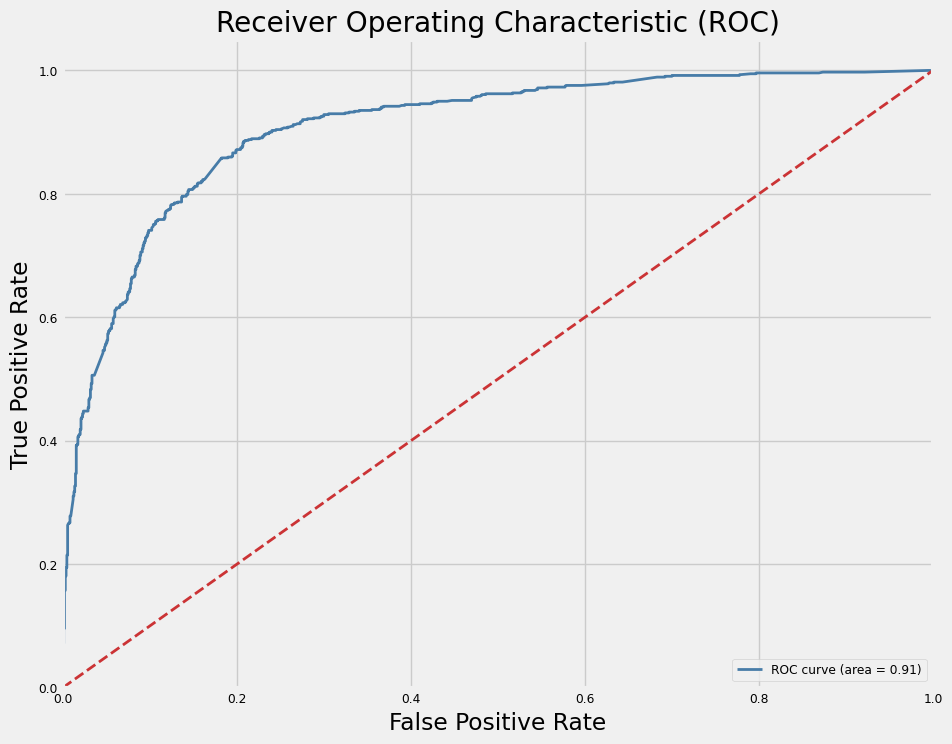

In [44]:
draw_roc(y_test_lgb_shap, pred_prob_1)

In [45]:
score = pd.DataFrame()

# Define score ranges for each decile
score_ranges = {
    0: (400, 500),  # Highest scores for the lowest probabilities
    1: (300, 400),
    2: (200, 300),
    3: (100, 200),
    4: (1, 100),    # Lowest scores for the highest probabilities
}

# Calculate the quantile values for your probabilities that separate the deciles
quantiles = np.quantile(pred_prob_1, [0, 0.2, 0.4, 0.6, 0.8, 1])
#quantiles = np.array([0.03935929, 0.08444629, 0.10565795, 0.13180369, 0.17968608,0.61205226])
def map_probability_to_score(prob):
    for i, (q_min, q_max) in enumerate(zip(quantiles[:-1], quantiles[1:])):
        if q_min <= prob <= q_max:
            score_min, score_max = score_ranges[4-i]
            score = score_max - (prob - q_min) / (q_max - q_min) * (score_max - score_min)
            return round(score)
    return 850  # Assign the lowest score to the highest probability

score['prob'] = pred_prob_1
score['score'] = score['prob'].apply(map_probability_to_score)

In [46]:
score

,prob,score
0,0.281,262
1,0.144,125
2,0.028,78
3,0.494,391
4,0.059,30
...,...,...
1843,0.629,350
1844,0.412,218
1845,0.145,124
1846,0.130,141


In [47]:
scores_above_500 = score[score['score'] == 500]
scores_above_500

,prob,score
604,0.794,500
1343,0.794,500


<Axes: xlabel='score', ylabel='Count'>

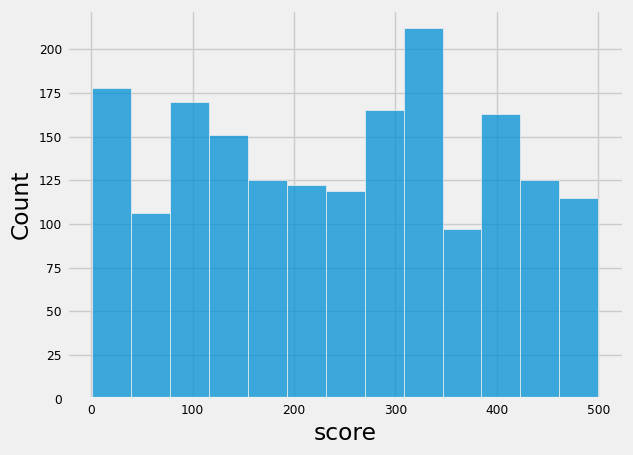

In [48]:
import seaborn as sns

sns.histplot(score['score'])

In [49]:
score_df = pd.DataFrame({'score': pred_prob_1, 'target': y_test_lgb_shap})

# Creating deciles based on score
score_df['decile'] = pd.qcut(score_df['score'], 10, labels=[f"{i+1}" for i in range(10)])

# Grouping by decile and calculating conversions
decile_stats = score_df.groupby('decile').agg(
    Converted=('target', lambda x: (x==1).sum()), 
    Not_Converted=('target', lambda x: (x==0).sum())  
).reset_index()

decile_stats['%CumN/Total Not_Converted'] = (decile_stats['Not_Converted'].cumsum() / decile_stats['Not_Converted'].sum()) * 100
decile_stats['%CumC/Total Converted'] = (decile_stats['Converted'].cumsum() / decile_stats['Converted'].sum()) * 100

final_table = decile_stats[['decile', 'Converted', 'Not_Converted', '%CumN/Total Not_Converted', '%CumC/Total Converted']]
final_table

,decile,Converted,Not_Converted,%CumN/Total Not_Converted,%CumC/Total Converted
0,1,3,182,16.441,0.405
1,2,11,213,35.682,1.889
2,3,13,133,47.696,3.644
3,4,16,168,62.873,5.803
4,5,33,153,76.694,10.256
5,6,77,107,86.360,20.648
6,7,116,68,92.502,36.302
7,8,135,50,97.019,54.521
8,9,158,27,99.458,75.843
9,10,179,6,100.000,100.000


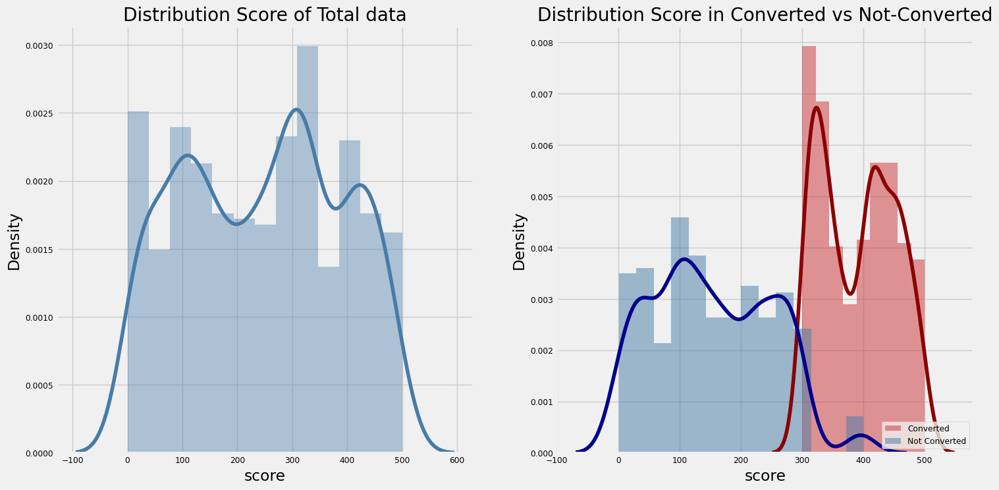

In [50]:
# Ví dụ, nếu xác suất dự đoán > 0.5 thì được coi là 'Bad', ngược lại là 'Good'
score['target'] = (score['prob'] > 0.5).astype(int)

# Chúng ta sẽ vẽ biểu đồ phân phối của 'score' cho toàn bộ dữ liệu và phân chia theo 'target'
plt.figure(figsize=(16, 8))

# Biểu đồ phân phối cho toàn bộ dữ liệu
plt.subplot(121)
sns.distplot(score['score'], color= '#477ca8')
plt.title('Distribution Score of Total data')

# Biểu đồ phân phối cho dữ liệu theo 'Good' và 'Bad'
plt.subplot(122)
sns.distplot(score[score['target'] == 1]['score'], label='Converted', kde_kws={"color": "darkred"}, hist_kws={"color": "#cb3335", "alpha": 0.5})
sns.distplot(score[score['target'] == 0]['score'], label='Not Converted', hist_kws={"color": "#477ca8", "alpha": 0.5}, kde_kws={"color": "darkblue"})
plt.legend(loc = 'lower right')
plt.title('Distribution Score in Converted vs Not-Converted')

plt.show()

In [51]:
optuna.visualization.plot_param_importances(study_lgb)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'cliponaxis': False,
              'hovertemplate': [min_child_weight (IntDistribution):
                                0.002906127167541423<extra></extra>, alpha
                                (FloatDistribution):
                                0.005585803228146744<extra></extra>, subsample
                                (FloatDistribution):
                                0.008810437147582442<extra></extra>, lambda
                                (FloatDistribution):
                                0.03338921340330893<extra></extra>, n_estimators
                                (IntDistribution):
                                0.04959784412771935<extra></extra>,
                                scale_pos_weight (FloatDistribution):
                                0.06567970394920218<extra></extra>, num_leaves
                                (IntDistribution):
                                0.07931602010462882<extra></extra>,
                                colsample_bytree (FloatDistribution):
                                0.1023629781308333<extra></extra>, max_depth
                                (IntDistribution):
                                0.25245267930188053<extra></extra>, learning_rate
                                (FloatDistribution):
                                0.3998991934391563<extra></extra>],
              'name': 'Objective Value',
              'orientation': 'h',
              'text': [<0.01, <0.01, <0.01, 0.03, 0.05, 0.07, 0.08, 0.10, 0.25,
                       0.40],
              'textposition': 'outside',
              'type': 'bar',
              'x': [0.002906127167541423, 0.005585803228146744,
                    0.008810437147582442, 0.03338921340330893, 0.04959784412771935,
                    0.06567970394920218, 0.07931602010462882, 0.1023629781308333,
                    0.25245267930188053, 0.3998991934391563],
              'y': [min_child_weight, alpha, subsample, lambda, n_estimators,
                    scale_pos_weight, num_leaves, colsample_bytree, max_depth,
                    learning_rate]}],
    'layout': {'template': '...',
               'title': {'text': 'Hyperparameter Importances'},
               'xaxis': {'title': {'text': 'Hyperparameter Importance'}},
               'yaxis': {'title': {'text': 'Hyperparameter'}}}
})

In [52]:
optuna.visualization.plot_parallel_coordinate(study_lgb)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'dimensions': [{'label': 'Objective Value',
                              'range': [0.855966710951036, 0.8977324939995188],
                              'values': [0.8768109476778735, 0.8938242247627646,
                                         0.895859561348989, 0.8928543578507784,
                                         0.8916404816887693, 0.855966710951036,
                                         0.8927874542771518, 0.8940597882236989,
                                         0.8807467693483982, 0.8922214348220496,
                                         0.8827929279168003, 0.8855168166967168,
                                         0.8895656627293267, 0.891971222834588,
                                         0.8899367550598623, 0.8927089396251059,
                                         0.89135324896067, 0.8908850182891392,
                                         0.8946115036663507, 0.8954351443876517,
                                         0.8949998225487494, 0.8941271533401837,
                                         0.8953726128566633, 0.8939366851818071,
                                         0.8955246588971428, 0.8926284492643342,
                                         0.886707325475953, 0.8967478799769776,
                                         0.8963730726186487, 0.8961364260054575,
                                         0.8947404271940627, 0.8960026782206298,
                                         0.8955725923596658, 0.892039186451527,
                                         0.8977324939995188, 0.8957449170287137,
                                         0.8916576914919483, 0.8796897639080015,
                                         0.8942015068982107, 0.8839437300176535,
                                         0.8965175094562225, 0.896883061364381,
                                         0.8969239451148583, 0.8959822098443085,
                                         0.8957521622127462, 0.890676991573334,
                                         0.8975347026379221, 0.8969913799821929,
                                         0.897440040134088, 0.8921837608827226,
                                         0.8967942350350082, 0.8967899759929872,
                                         0.8960583474552303, 0.8959350408850225,
                                         0.8941516320723653, 0.896206264414999,
                                         0.8952166565284123, 0.8962659777148365,
                                         0.8963469202900856, 0.8881369215121035,
                                         0.8961137256019371, 0.894847107408931,
                                         0.8965898866694975, 0.8958186888349708,
                                         0.8975990154656927, 0.8947415472358268,
                                         0.8961525914539648, 0.8927047030560032,
                                         0.8908068962771363, 0.896834212024436,
                                         0.895064962210304, 0.8966990658304705,
                                         0.8927137390772077, 0.8961648686636018,
                                         0.8663819827067079, 0.8916727436829687,
                                         0.8962243332772782, 0.865862107997043,
                                         0.8964715953762099, 0.8946762436915762,
                                         0.8960800783431371, 0.8973352222033111,
                                         0.8947598747486744, 0.8944958376763308,
                                         0.8957803050906417, 0.8962924535686188,
                                         0.8956017168376686, 0.8974309761277398,
                                         0.8966132303072998, 0.8960549037985253,
                                         0.8932982634964078, 0.8933723458953555,
                                         0.8965960105397139, 0.8967581337759396,
                                         0.8965813760057586, 

In [53]:
optuna.visualization.plot_param_importances(study_cb)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'cliponaxis': False,
              'hovertemplate': [scale_pos_weight (FloatDistribution):
                                0.033408883132688826<extra></extra>, l2_leaf_reg
                                (FloatDistribution):
                                0.03638364169805302<extra></extra>, depth
                                (IntDistribution):
                                0.04034958513124275<extra></extra>, subsample
                                (FloatDistribution):
                                0.1407751155423765<extra></extra>, learning_rate
                                (FloatDistribution):
                                0.28781684467147456<extra></extra>, iterations
                                (IntDistribution):
                                0.4612659298241642<extra></extra>],
              'name': 'Objective Value',
              'orientation': 'h',
              'text': [0.03, 0.04, 0.04, 0.14, 0.29, 0.46],
              'textposition': 'outside',
              'type': 'bar',
              'x': [0.033408883132688826, 0.03638364169805302,
                    0.04034958513124275, 0.1407751155423765, 0.28781684467147456,
                    0.4612659298241642],
              'y': [scale_pos_weight, l2_leaf_reg, depth, subsample,
                    learning_rate, iterations]}],
    'layout': {'template': '...',
               'title': {'text': 'Hyperparameter Importances'},
               'xaxis': {'title': {'text': 'Hyperparameter Importance'}},
               'yaxis': {'title': {'text': 'Hyperparameter'}}}
})

In [54]:
optuna.visualization.plot_parallel_coordinate(study_cb)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'dimensions': [{'label': 'Objective Value',
                              'range': [0.8373805422350513, 0.898091931365842],
                              'values': [0.8740462624950485, 0.8903245350162411,
                                         0.874381184239683, 0.884464721800961,
                                         0.8859090742760477, 0.8373805422350513,
                                         0.8904034512126937, 0.8913769271481418,
                                         0.890049763945315, 0.8720692289270386,
                                         0.8904675681444605, 0.8914262713163049,
                                         0.8870086296430003, 0.8912240496096878,
                                         0.8923640502932036, 0.8889303071132044,
                                         0.8905067999234395, 0.8883170277471002,
                                         0.8870044486201671, 0.8905972228900495,
                                         0.891576565741215, 0.8906665130451898,
                                         0.8890629713217578, 0.8913915061358274,
                                         0.8899657516966417, 0.8815809309995759,
                                         0.847320685405349, 0.8907514019496825,
                                         0.8857894649249053, 0.8807817982676518,
                                         0.893194637266323, 0.8930080196092748,
                                         0.8913433818655083, 0.8942084241048421,
                                         0.8915430552280021, 0.8945385016635472,
                                         0.8943128576639138, 0.8928225942889446,
                                         0.8966846609018967, 0.8975601841710772,
                                         0.8971578818333255, 0.8971021046863159,
                                         0.898091931365842, 0.8967403871668272,
                                         0.8915875753510587, 0.8923451249159278,
                                         0.8962181097629903, 0.8940353497731636,
                                         0.8975044409454535, 0.8941623575906013,
                                         0.8944862461924303, 0.8976685803840597,
                                         0.8956990883881921, 0.8941637788966748,
                                         0.8972650312233638, 0.8952535015138692,
                                         0.8929520533505382, 0.892004067428592,
                                         0.8941814089010227, 0.8935803310574627,
                                         0.8961216625702353, 0.8971359925749478,
                                         0.8906243426141398, 0.8972998002199972,
                                         0.8780377088783545, 0.8951282128746755,
                                         0.8926625563699233, 0.8957297022270494,
                                         0.8960523170808342, 0.8941432197806456,
                                         0.8624263000646796, 0.897079273897468,
                                         0.8946923959955464, 0.8886047334665257,
                                         0.8940937956852165, 0.896138260516414,
                                         0.8896097982686694, 0.8836433442721322,
                                         0.894191242074798, 0.8941934293681693,
                                         0.893489276517047, 0.8962663050562115,
                                         0.8955843389116206, 0.8959377683764658,
                                         0.8941876141825654, 0.892333476523984,
                                         0.893755248804462, 0.8951950373690709,
                                         0.8968624233811294, 0.8929681149148008,
                                         0.8917134629147239, 0.8968238570973419,
                                         0.8933400981057366, 0.8959742440428322,
                                         0.8955666554810897,